# Imports

In [1]:
from collections import Counter
from gensim.models import Word2Vec
from nltk import sent_tokenize
from nltk.corpus import stopwords, wordnet
from nltk.stem import PorterStemmer, SnowballStemmer, WordNetLemmatizer
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer #for word embedding
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score # bag of words
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
import collections
import csv
import gensim
import matplotlib.pyplot as plt
import nltk
import nltk.tokenize
import numpy as np #for text pre-processing
import operator
import pandas as pd
import pathlib
import pickle
import re, string
import seaborn
import string
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
nltk.download('wordnet')#for model-building
ps = PorterStemmer()

C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)
In C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_

# Functions

### _1) Reading in files and append them into corpus list_

In [2]:
tok = nltk.tokenize.TreebankWordTokenizer()

def make_corpus(filename):
    corpus = []
    with open(filename, 'r') as f:
        for line in f:
            corpus.extend(t for line in f for t in tok.tokenize(line))
    
    return corpus

### _2) Convert corpus into data frame_

a) voc: counts the total number of tokens in corpus

b) frq_ returns a dataframe with tokens and frequency of each token
    

In [3]:
def dataframe_corpus(corpus):
    voc = collections.Counter(corpus)
    frq = pandas.DataFrame(voc.most_common(), columns=['token', 'frequency'])

    return frq

### _3) Frequency normalized by corpus size and Cumulative normalized frequency inserted into dataframe_

In [4]:
def freq_cum(frq):
    # Index in the sorted list
    frq['idx'] = frq.index + 1

    # Frequency normalised by corpus size
    frq['norm_freq'] = frq.frequency / len(corpus)

    # Cumulative normalised frequency
    frq['cumul_frq'] = frq.norm_freq.cumsum()

    return frq


### _4) Plots for Culumative frequency and Log-log plot for Zipf's law_

In [5]:
seaborn.set(style='whitegrid')

# Plot: Cumulative frequency by index
def freq_cum_plot(frq):
    seaborn.relplot(x='idx', y='cumul_frq', data=frq)
    return plt.show()

# Plot: Cumulative frequency by index, top x tokens
def freq_cum_plot_top_x_tokens(frq, top_x):
    seaborn.relplot(x='idx', y='cumul_frq', data=frq[:int(top_x)], kind='line')
    return plt.show()

# Plot: Log-log plot for Zipf's law
def zipfs_law(frq):
    frq['log_frq'] = numpy.log(frq.frequency)
    frq['log_rank'] = numpy.log(frq.frequency.rank(ascending=True))
    seaborn.relplot(x='log_rank', y='log_frq', data=frq)
    return plt.show()

***

## a.1) Tokenization

In [6]:
def token_sentences(text):
    sentences = sent_tokenize(text)
    return sentences


def tokenization(words,text):
    tokens = word_tokenize(text[1:])
    words = [token.lower() for token in tokens if token.isalpha()]   
    return words

#### a.1.1) Comparing TweetTokenizer with NLTK Tokenizer (Task 1)

In [7]:
from nltk.tokenize import TweetTokenizer
from nltk.tokenize import  word_tokenize

def comparing_tokenizer(text):
    tt = TweetTokenizer()
    tweet_tokenizer = tt.tokenize(text)
    word_tweet_tok = word_tokenize(text)
    return tweet_tokenizer, word_tweet_tok

#output example:

# tweet_tokenizer       = ['#ibelieveblaseyford', 'is', 'liar', 'she', 'is']
# word_tweet_tok (NLTK) = ['#', 'ibelieveblaseyford', 'is', 'liar', 'she']

#### a.1.2) Spacy library

In [8]:
def split_in_sentences(text):
    doc = nlp(text)
    return [str(sent).strip() for sent in doc.sents]

## a.2) Vocabulary 

In [9]:
#converting a dataframe into a single list 
#text is split into words defined by their space inbetween
#words are inserted into list 
def words_list(text):
    #words are inserted into list 
    corpus=[]
    for row in text:
        tokens = row[0].split(" ")
        for token in tokens:
            corpus.append(token)
    
    
    def vocabulary_list(corpus):
        #initlialize the vocabulary
        vocab = list(set(" ".join(corpus)))
        vocab.remove(' ')
        return vocab
      
    
    def split_words_char(corpus):
        #split the word into characters
        corpus = [" ".join(token) for token in corpus]
        #appending </w>
        corpus=[token+' </w>' for token in corpus]
        return corpus
        
    x,y = split_words_char(corpus), vocabulary_list(corpus)
    return x,y


# Creating the Bag of Words model
def bag_of_words(text):
    word2count = {}
    for data in text:
        words = nltk.word_tokenize(data)
        for word in words:  
            if word not in word2count.keys():
                word2count[word] = 1
            else:
                word2count[word] += 1
    return word2count   



## b) Pre-processing and cleaning

In [10]:
# removing punctuations
# convert all words into lower cases
# remove stop words

def preprocess_text(words):
    #delete punctuations
    punctuation_table = str.maketrans('', '', string.punctuation)

    #convert all words into lower cases
    words = [word.translate(punctuation_table).lower() for word in words]
    
    #remove stopwords
    from nltk.corpus import stopwords
    stop_words = stopwords.words('english')
    words = [word for word in words if word not in stop_words]

    return words

# cleaning sentences within data frame
def  clean_text(df, text_field):
    df[text_field] = df[text_field].str.lower()
    df[text_field] = df[text_field].apply(lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", " ", elem))  
    return df

def del_punctuations(words):
    punctuation_table = str.maketrans('', '', string.punctuation)
    words = [word.translate(punctuation_table).lower() for word in words]
    return words


def stop_words(words):
    stop_words = stopwords.words('english')
    words = [word for word in words if word not in stop_words]
    return words

def word_lemmatizer(text):
    lem_text = [WordNetLemmatizer().lemmatize(i) for i in text]
    return lem_text


## c) Basic statistics

In [11]:
# number of tokens, sentences, average tokens, total unique tokens, total number of tokens after cleaning

def basic_statistics(text,printer = False):
    sents = nltk.sent_tokenize(text)
    tokens = word_tokenize(text[1:])
    words = [token.lower() for token in tokens if token.isalpha()]
    average_tokens = round(len(words)/len(sents))
    unique_tokens = set(words)
    token_ratio = round(len(unique_tokens)/len(tokens),3)
    stop_words = set(stopwords.words('english'))
    final_tokens = []
    for each in words:
        if each not in stop_words:
            final_tokens.append(each)
    if printer == True:
        print(f'The number of characters: {len(text)}')
        print(f'The number of tokens is: {len(tokens)}')
        print(f'The number of sentences is: {len(sents)}')
        print(f'The average number of tokens per sentence is: {average_tokens}')
        print(f'The number of unique tokens are: {len(unique_tokens)}')
        print(f'The tokens ratio is: {token_ratio}')
        print(f'The number of total tokens after removing stopwords are: {len(final_tokens)}')
    return len(text), len(tokens), len(sents), average_tokens, len(unique_tokens), token_ratio, len(final_tokens)

def word_frequency(words):
    frequency_words = collections.Counter(words)
    
    #convert counter object to dictionary
    frequency_words_dict = dict(frequency_words)
    res = dict(sorted(frequency_words_dict.items(), key=lambda item: item[1]))
    return res

def top_20_most_common_words(freq_words):
    res = dict(Counter(freq_words).most_common(20))
    return res

def most_common_words(dictionary):
    # Output a dict of most common words
    return dict(sorted(dictionary.items(),key=lambda x: x[1], reverse=True))

def least_common_words(dictionary):
    return sorted(list(dictionary.items()),key=lambda x: x[1])


# Function for loglog plots
def llplot(list_var, labels, title):
    """Function that takes a list of datasets, list of labels and a title as string, and plots a loglogplot, example:
    llplot([offensive_freq_words_val, offensive_freq_words_train, offensive_freq_words_test], ["val", "train", "test"], "Offensive dataset, loglog plot")
    """
    # Size of the figure:
    plt.figure(figsize = (7,6))
    # Iterating through the datasets:
    for idx, i in enumerate(list_var):
        y = np.log(list(most_common_words(i).values()))
        x = np.log([i for i in range(1,len(y)+1)])
        plt.scatter(x, y, label = labels[idx])
    # Labeling title and axis:
    plt.title(title)
    plt.xlabel("Rank of word")
    plt.ylabel("Frequency of word")
    # Plotting:
    plt.legend()
    plt.show()
    return None


## Spacy - preprocessing/cleaning

In [12]:
def merging_labels_and_sentences(textfile, labelfile):

    # read textfile and labelfile into two separate dataframes
    df_text = pd.read_csv(textfile + '.txt', header=None, skiprows = 0,
        names=['tweet'], sep='\t', quoting=3)
    df_labels = pd.read_csv(labelfile + '.txt',header=None, skiprows = 0, names=['label'],
        sep='\t', quoting=3)

    index_text = [x for x in range(1, len(df_text.values)+1)]

    df_labels.insert(loc=0, column='id', value =index_text)
    df_text.insert(loc=0, column='id', value =index_text)
    final_df = df_text.merge(df_labels, on='id', how='left')

    return final_df

def class_distribution(dataframe,title,xlabel_title):
    x = dataframe['label'].value_counts()
    barplot = seaborn.barplot(x.index, x)
    barplot.set_title(title)
    barplot.set_xlabel(xlabel_title)
    barplot.set_ylabel("Count")
    return barplot

# WORD-COUNT
def word_count(dataframe_col):
    dataframe_col['word_count'] = dataframe_col['tweet'].apply(lambda x: len(str(x).split()))
    
    avg_off_tweets = round(dataframe_col[dataframe_col['label']==1]['word_count'].mean(),3)
    avg_non_off_tweets = round(dataframe_col[dataframe_col['label']==0]['word_count'].mean(),3) 

    return dataframe_col, avg_off_tweets, avg_non_off_tweets

# CHARACTER-COUNT
def char_count(dataframe_col):
    dataframe_col['char_count'] = dataframe_col['tweet'].apply(lambda x: len(str(x)))
    
    #the average characters in offensive tweets
    avg_char_off = round(dataframe_col[dataframe_col['label']==1]['char_count'].mean(),3) 

    #the average characters in non-offensive tweets
    avg_char_non_off = round(dataframe_col[dataframe_col['label']==0]['char_count'].mean(),3)

    return dataframe_col, avg_char_off, avg_char_non_off

def plot_word_count(dataframe):
    # PLOTTING WORD-COUNT
    fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,4))
    dataframe_words=dataframe[dataframe['label']==1]['word_count']
    ax1.hist(dataframe_words,color='red')
    ax1.set_title('offensive tweets')
    dataframe_words=dataframe[dataframe['label']==0]['word_count']
    ax2.hist(dataframe_words,color='green')
    ax2.set_title('non-offensive tweets')
    fig.suptitle('Words per tweet')
    ax2.set_xlabel("Length of tweet")
    ax2.set_ylabel("occurrences")
    ax1.set_xlabel("Length of tweet")
    ax1.set_ylabel("occurrences")
    plt.show()

def missing_values(dataframe):
    res = dataframe.isna().sum()
    return res

#convert to lowercase, strip and remove punctuations
def preprocess(text):
    text = text.lower() 
    text=text.strip()  
    text=re.compile('<.*?>').sub('', text) 
    text = re.compile('[%s]' % re.escape(string.punctuation)).sub(' ', text)  
    text = re.sub('\s+', ' ', text)  
    text = re.sub(r'\[[0-9]*\]',' ',text) 
    text=re.sub(r'[^\w\s]', '', str(text).lower().strip())
    text = re.sub(r'\d',' ',text) 
    text = re.sub(r'\s+',' ',text) 
    return text
 
# STOPWORD REMOVAL
def stopword(string):
    a= [i for i in string.split() if i not in stopwords.words('english')]
    return ' '.join(a)#LEMMATIZATION
# Initialize the lemmatizer
wl = WordNetLemmatizer()
 
# This is a helper function to map NTLK position tags
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN# Tokenize the sentence
def lemmatizer(string):
    word_pos_tags = nltk.pos_tag(word_tokenize(string)) # Get position tags
    a=[wl.lemmatize(tag[0], get_wordnet_pos(tag[1])) for idx, tag in enumerate(word_pos_tags)] # Map the position tag and lemmatize the word/token
    return " ".join(a)
    
def finalpreprocess(string):
    return lemmatizer(stopword(preprocess(string)))



## D) Classification

In [13]:
#SPLITTING THE VALIDATION DATASET INTO TRAIN AND TEST


def split_dataset(dataframe):
    X_train, X_test, y_train, y_test = train_test_split(dataframe["tweet"],dataframe      
    ["label"],test_size=0.2,shuffle=True)
    return X_train, X_test, y_train, y_test
    
def tokenize_train_test(X_train, X_test):
    #Word2Vec
    # Word2Vec runs on tokenized sentences
    X_train_tok= [nltk.word_tokenize(i) for i in X_train]  
    X_test_tok= [nltk.word_tokenize(i) for i in X_test]

    return X_train_tok, X_test_tok


#building Word2Vec model
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        # if a text is empty we should return a vector of zeros
        # with the same dimensionality as all the other vectors
        self.dim = len(next(iter(word2vec.values())))

    def fit(self, X, y):
        return self

    def transform(self, X):
        return np.array([np.mean([self.word2vec[w] 
        for w in words if w in self.word2vec] or [np.zeros(self.dim)], axis=0) 
        for words in X])

#building Word2Vec model
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        # if a text is empty we should return a vector of zeros
        # with the same dimensionality as all the other vectors
        self.dim = len(next(iter(word2vec.values())))

    def fit(self, X, y):
        return self

    def transform(self, X):
        return np.array([np.mean([self.word2vec[w] 
        for w in words if w in self.word2vec] or [np.zeros(self.dim)], axis=0) 
        for words in X])

## Model prediction

#### Cleaned

In [14]:
def model_prediction_preprocessed_data(dataframe):
    #Pre-processing the new dataset
    dataframe['clean_text'] = dataframe['tweet'].apply(lambda x: finalpreprocess(x)) 
    
    #preprocess the data
    X_test=dataframe['clean_text'] 

    #converting words to numerical data using tf-idf
    X_vector=tfidf_vectorizer.transform(X_test)

    #use the best model to predict 'target' value for the new dataset 
    y_predict = lr_tfidf.predict(X_vector)      
    y_prob = lr_tfidf.predict_proba(X_vector)[:,1]
    dataframe['predict_prob']= y_prob
    dataframe['label']= y_predict
    final=dataframe[['clean_text','label']].reset_index(drop=True)
    return final 


#### Non cleaned

In [15]:
def model_prediction_nonprocessed_data(dataframe):
    X_test=dataframe['tweet'] 

    #converting words to numerical data using tf-idf
    X_vector=tfidf_vectorizer.transform(X_test)

    #use the best model to predict 'target' value for the new dataset 
    y_predict = lr_tfidf.predict(X_vector)      
    y_prob = lr_tfidf.predict_proba(X_vector)[:,1]
    dataframe['predict_prob']= y_prob
    dataframe['label']= y_predict
    final=dataframe[['tweet','label']].reset_index(drop=True)
    return final 


***
***

# TASK 1: PRE-PROCESSING AND TOKENIZATION
_ splitting text files into words _


## 1.1) Text file: Emoji
***

### Read in txt files: offensive/emoji.txt

In [16]:
file_path_val = pathlib.Path(r'datasets/emoji/val_text.txt')

with open(file_path_val, 'r',encoding="utf8") as f:
    emoji_text_val = f.read()       
    f.close()
    
emoji_words_val_txt = emoji_text_val[1:].split()

print(emoji_words_val_txt[:100])

['little', 'throwback', 'with', 'my', 'favourite', 'person', '@', 'Water', 'Wall', 'glam', 'on', '@user', 'yesterday', 'for', '#kcon', 'makeup', 'using', '@user', 'in', '#featherette,…', 'Democracy', 'Plaza', 'in', 'the', 'wake', 'of', 'a', 'stunning', 'outcome', '#Decision2016', '@', 'NBC', 'News', 'Then', '&amp;', 'Now.', 'VILO', '@', 'Walt', 'Disney', 'Magic', 'Kingdom', 'Who', 'never...', '@', 'A', 'Galaxy', 'Far', 'Far', 'Away', 'Dinner', 'in', 'FLA', 'tonight', '//', 'Pan-seared', 'salmon', 'over', 'couscous', 'veggie', 'salad', '#yum', '#dinner', '#florida', '#salmon…', "It's", 'my', 'fav', 'seniors', 'last', 'game', 'congrats', 'on', 'beating', 'west', '@', 'West', 'Salem…', 'I', 'got', 'to', 'to', 'go', 'formal', 'with', 'my', 'best', 'friend', '@', 'Phi', 'Mu', 'at', 'JSU', "'Cause", 'I', 'Miss', 'My', 'Little', 'Homies', '.#Throwback']


In [17]:
file_path_train = pathlib.Path(r'datasets/emoji/train_text.txt')


with open(file_path_train, 'r',encoding="utf8") as f:
    emoji_text_train = f.read()       
    f.close()
    
emoji_words_train_txt = emoji_text_train[1:].split()
print(emoji_words_train_txt[:100])

['unday', 'afternoon', 'walking', 'through', 'Venice', 'in', 'the', 'sun', 'with', '@user', '️', '️', '️', '@', 'Abbot', 'Kinney,', 'Venice', 'Time', 'for', 'some', 'BBQ', 'and', 'whiskey', 'libations.', 'Chomp,', 'belch,', 'chomp!', '(@', "Lucille's", 'Smokehouse', 'Bar-B-Que)', 'Love', 'love', 'love', 'all', 'these', 'people', '️', '️', '️', '#friends', '#bff', '#celebrate', '#blessed', '#sundayfunday', '@', 'San…', '️', '️', '️', '️', '@', 'Toys"R"Us', 'Man', 'these', 'are', 'the', 'funniest', 'kids', 'ever!!', 'That', 'face!', '#HappyBirthdayBubb', '@', 'FLIPnOUT', 'Xtreme', '#sandiego', '@', 'San', 'Diego,', 'California', 'My', 'little', '️', '️', '️', '️', '️', '#ObsessedWithMyDog', '@', 'Cafe', 'Solstice', 'Capitol', 'Hill', 'More', '#tinyepic', 'things', '#tinyepicwestern,', 'this', 'one', 'is', 'crazy', '@user', 'I', 'may', 'be', 'one', 'of', 'your…', 'Last']


In [18]:
file_path_test = pathlib.Path(r'datasets/emoji/test_text.txt')


with open(file_path_test, 'r',encoding="utf8") as f:
    emoji_text_test = f.read()       
    f.close()
    
emoji_words_test_txt = emoji_text_test[1:].split()
print(emoji_words_test_txt[:100])

['n', 'Pelham', 'Parkway', 'The', 'calm', 'before......', '|', 'w/', 'sofarsounds', '@user', '|', ':', 'B.', 'Hall.......#sofarsounds…', 'Just', 'witnessed', 'the', 'great', 'solar', 'eclipse', '@', 'Tampa,', 'Florida', 'This', 'little', 'lady', 'is', '26', 'weeks', 'pregnant', 'today!', 'Excited', 'for', 'baby', 'Cam', 'to', 'come!', '@', 'Springfield,…', 'Great', 'road', 'trip', 'views!', '@', 'Shartlesville,', 'Pennsylvania', 'CHRISTMAS', 'DEALS', 'BUY', 'ANY', '3', 'SMALL', 'POMADES', '1.5', 'OR', '1.7', 'OZ', 'RECEIVE', 'THE', 'F&amp;S', 'COLLECTOR', 'TIN', '&amp;', 'COMB…', 'the', '#sisterstunt', 'was', 'mad', 'real', 'last', 'night', '#MiaStaxxx', '#AndreaStaxxx', '#denverqueen', '#staxxxlife…', "I'm", 'starting', 'to', 'love', 'shooting', 'in', 'the', 'dark', '#brandonwolfel', '@', 'New', 'York,', 'New', 'York', 'Let', 'the', 'sun', 'shine', 'through', '️', '5x5', 'Feet', '#oilpainting', '#oiloncanvas', '#acrylicpainting']


### Remove punctuations from txt files
_ meaning signs, spacing and other disturbing features. Alle words are then turned into lower cases_

In [19]:


emoji_cleaned_val_words = del_punctuations(emoji_words_val_txt)
emoji_cleaned_train_words = del_punctuations(emoji_words_train_txt)
emoji_cleaned_test_words = del_punctuations(emoji_words_test_txt)

print('val_text.txt:\n',emoji_cleaned_val_words[:100],'\n')

print('\nval_train.txt:\n',emoji_cleaned_train_words[:100], '\n')

print('\nval_test.txt:\n',emoji_cleaned_test_words[:100],'\n')

val_text.txt:
 ['little', 'throwback', 'with', 'my', 'favourite', 'person', '', 'water', 'wall', 'glam', 'on', 'user', 'yesterday', 'for', 'kcon', 'makeup', 'using', 'user', 'in', 'featherette…', 'democracy', 'plaza', 'in', 'the', 'wake', 'of', 'a', 'stunning', 'outcome', 'decision2016', '', 'nbc', 'news', 'then', 'amp', 'now', 'vilo', '', 'walt', 'disney', 'magic', 'kingdom', 'who', 'never', '', 'a', 'galaxy', 'far', 'far', 'away', 'dinner', 'in', 'fla', 'tonight', '', 'panseared', 'salmon', 'over', 'couscous', 'veggie', 'salad', 'yum', 'dinner', 'florida', 'salmon…', 'its', 'my', 'fav', 'seniors', 'last', 'game', 'congrats', 'on', 'beating', 'west', '', 'west', 'salem…', 'i', 'got', 'to', 'to', 'go', 'formal', 'with', 'my', 'best', 'friend', '', 'phi', 'mu', 'at', 'jsu', 'cause', 'i', 'miss', 'my', 'little', 'homies', 'throwback'] 


val_train.txt:
 ['unday', 'afternoon', 'walking', 'through', 'venice', 'in', 'the', 'sun', 'with', 'user', '️', '️', '️', '', 'abbot', 'kinney', 'venice

In [20]:

#nltk.download('punkt')

emoji_sentences_val_txt = token_sentences(emoji_text_val)   
emoji_sentences_train_txt = token_sentences(emoji_text_train)
emoji_sentences_test_txt = token_sentences(emoji_text_test)   

print(emoji_sentences_val_txt[:5])
print(emoji_sentences_train_txt[:5])
print(emoji_sentences_test_txt[:5])

['A little throwback with my favourite person @ Water Wall\nglam on @user yesterday for #kcon makeup using @user in #featherette,…\nDemocracy Plaza in the wake of a stunning outcome #Decision2016 @ NBC News\nThen &amp; Now.', "VILO @ Walt Disney Magic Kingdom\nWho never... @ A Galaxy Far Far Away\nDinner in FLA tonight // Pan-seared salmon over couscous veggie salad #yum #dinner #florida #salmon…\nIt's my fav seniors last game congrats on beating west @ West Salem…\nI got to to go formal with my best friend @ Phi Mu at JSU\n'Cause I Miss My Little Homies .#Throwback #CousinLove @ Indiana University\nBirthday Kisses @ Madison, Wisconsin\nGreat time in Tuscaloosa with my girl!", '@ Bryant–Denny Stadium\nA seguir aprendiendo del mundo de las berries (@ John F. Kennedy International Airport (JFK) in Queens, NY, NY)\n#livinginparadise @ Ramada Plaza Beach Resort\n••In order for your life to be "GREAT" you must first learn to "APPRECIATE" it... •• #Ny…\nThese girls!', '#seniors2016 #memories

### Number of words in each tokenization variables

In [21]:

emoji_token_val = tokenization(emoji_cleaned_val_words, emoji_text_val)
emoji_token_train = tokenization(emoji_cleaned_train_words, emoji_text_train)
emoji_token_test = tokenization(emoji_cleaned_test_words, emoji_text_test)

print(f'Number of words in tokenization for val_text: {len(emoji_token_val)}')
print(f'Number of words in tokenization for val_train: {len(emoji_token_train)}')
print(f'Number of words in tokenization for val_test: {len(emoji_token_test)}')

Number of words in tokenization for val_text: 49661
Number of words in tokenization for val_train: 461690
Number of words in tokenization for val_test: 518019


### Removing stopwords like 'and, or, of, is, had.... etc' 

In [22]:
emoji_cleaned_val_words = stop_words(emoji_token_val)
emoji_cleaned_train_words = stop_words(emoji_token_train)
emoji_cleaned_test_words = stop_words(emoji_token_test)

print(f'Number of words after removing Stop Words: {len(emoji_cleaned_val_words)}')
print(f'Number of words after removing Stop Words: {len(emoji_cleaned_train_words)}')
print(f'Number of words after removing Stop Words: {len(emoji_cleaned_test_words)}')


Number of words after removing Stop Words: 33634
Number of words after removing Stop Words: 314706
Number of words after removing Stop Words: 345902


### Frequency of each word

In [23]:
import collections

#returns frequency of each word
emoji_freq_words_val = word_frequency(emoji_cleaned_val_words)
emoji_freq_words_train = word_frequency(emoji_cleaned_train_words)
emoji_freq_words_test = word_frequency(emoji_cleaned_test_words)


print('_'*112,'\n')
print('Frequency of words in val_text:\n',list(emoji_freq_words_val.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in train_text:\n',list(emoji_freq_words_train.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in test_text:\n',list(emoji_freq_words_test.items())[-40:-1], '\n')
print('_'*112,'\n')

________________________________________________________________________________________________________________ 

Frequency of words in val_text:
 [('friends', 76), ('high', 77), ('much', 78), ('fun', 78), ('first', 79), ('school', 81), ('life', 82), ('thank', 83), ('thanks', 86), ('center', 87), ('california', 87), ('see', 87), ('get', 89), ('city', 91), ('great', 96), ('back', 96), ('little', 99), ('ca', 99), ('university', 103), ('beautiful', 106), ('christmas', 116), ('like', 118), ('birthday', 119), ('last', 120), ('one', 125), ('today', 134), ('got', 137), ('best', 137), ('time', 137), ('good', 138), ('beach', 147), ('york', 148), ('night', 151), ('park', 152), ('day', 223), ('happy', 225), ('amp', 245), ('new', 292), ('love', 389)] 

________________________________________________________________________________________________________________ 

Frequency of words in train_text:
 [('city', 738), ('francisco', 746), ('great', 751), ('fun', 756), ('little', 778), ('see', 783), (

### Vocabulary list for offensive text files
_Looking through vocabulary lists can help you find problems
(especially tokens that only occur once or twice)._

In [24]:


emoji_corpus_val, emoji_vocab_val = words_list(emoji_text_val)
emoji_corpus_train, emoji_vocab_train = words_list(emoji_text_train)
emoji_corpus_test, emoji_vocab_test = words_list(emoji_text_test)

print('Vocabulary for text_val.txt:\n', emoji_vocab_val[:20],'\n')
print('Vocabulary for text_train.txt:\n', emoji_vocab_train[:20],'\n')
print('Vocabulary for text_test.txt:\n', emoji_vocab_test[:20],'\n')

Vocabulary for text_val.txt:
 ['ｇ', 'ñ', 'ポ', 'k', 'N', 'ｒ', ')', 'û', '|', 'ö', '+', 'C', 'é', 'Ä', 'c', 'Τ', 'v', '♡', '–', 'V'] 

Vocabulary for text_train.txt:
 ['餐', 'N', 'ā', 'ズ', 'н', '카', 'Ê', '❥', '+', '며', 'é', 'と', 'Τ', '민', '♡', '–', '】', 'ᴷ', '店', 'ก'] 

Vocabulary for text_test.txt:
 ['N', 'ā', '╳', 'Ｎ', 'อ', 'н', '家', '❥', '+', '‘', 'é', 'と', 'み', 'Τ', 'Ω', 'Í', '♡', '浴', '–', 'ก'] 



### Read in txt files: offensive/val_text.txt

In [25]:
#offensive_

In [26]:
file_path_val = pathlib.Path(r'datasets/offensive/val_text.txt')

with open(file_path_val, 'r',encoding="utf8") as f:
    offensive_text_val = f.read()       
    f.close()
    
offensive_words_val_txt = offensive_text_val[1:].split()

print(offensive_words_val_txt[:100])

['user', '@user', 'WiiU', 'is', 'not', 'even', 'a', 'real', 'console.', '@user', '@user', '@user', 'If', 'he', 'is', 'from', 'AZ', 'I', 'would', 'put', 'my', 'money', 'on', 'sex', 'with', 'underage', 'kids.', '@user', 'I', 'thought', 'Canada', 'had', 'strict', 'gun', 'control.', 'Help', 'me', 'understand', 'what', 'is', 'happening.', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Following', 'all', '#Maga', 'patriots', 'please', 'follow', 'back', '👍', '#LionsDen', '🦁', '#MAGA2KAG', '🇺🇸', '1', 'Minute', 'of', 'Truth:', 'Gun', 'Control', 'via', '@user', '@user', '@user', '@user', 'We', 'could', 'help', 'if', 'you', 'are', 'London', 'based', '😊', '@user', '@user', 'There', 'r', '65', 'million', 'that', 'can', 'sign', 'to', 'the']


In [27]:
file_path_train = pathlib.Path(r'datasets/offensive/train_text.txt')


with open(file_path_train, 'r',encoding="utf8") as f:
    offensive_text_train = f.read()       
    f.close()
    
offensive_words_train_txt = offensive_text_train[1:].split()
print(offensive_words_train_txt[:100])

['user', 'Bono...', 'who', 'cares.', 'Soon', 'people', 'will', 'understand', 'that', 'they', 'gain', 'nothing', 'from', 'following', 'a', 'phony', 'celebrity.', 'Become', 'a', 'Leader', 'of', 'your', 'people', 'instead', 'or', 'help', 'and', 'support', 'your', 'fellow', 'countrymen.', '@user', 'Eight', 'years', 'the', 'republicans', 'denied', 'obama’s', 'picks.', 'Breitbarters', 'outrage', 'is', 'as', 'phony', 'as', 'their', 'fake', 'president.', '@user', 'Get', 'him', 'some', 'line', 'help.', 'He', 'is', 'gonna', 'be', 'just', 'fine.', 'As', 'the', 'game', 'went', 'on', 'you', 'could', 'see', 'him', 'progressing', 'more', 'with', 'his', 'reads.', 'He', 'brought', 'what', 'has', 'been', 'missing.', 'The', 'deep', 'ball', 'presence.', 'Now', 'he', 'just', 'needs', 'a', 'little', 'more', 'time', '@user', '@user', 'She', 'is', 'great.', 'Hi', 'Fiona!', '@user']


In [28]:
file_path_test = pathlib.Path(r'datasets/offensive/test_text.txt')


with open(file_path_test, 'r',encoding="utf8") as f:
    offensive_text_test = f.read()       
    f.close()
    
offensive_words_test_txt = offensive_text_test[1:].split()
print(offensive_words_test_txt[:100])

['ibelieveblaseyford', 'is', 'liar', 'she', 'is', 'fat', 'ugly', 'libreal', '#snowflake', 'she', 'sold', 'her', 'herself', 'to', 'get', 'some', 'cash', '!!', 'From', 'dems', 'and', 'Iran', '!', 'Why', 'she', 'spoke', 'after', '#JohnKerryIranMeeting', '?', '@user', '@user', '@user', 'I', 'got', 'in', 'a', 'pretty', 'deep', 'debate', 'with', 'my', 'friend', 'and', 'she', 'told', 'me', 'that', 'latinos', 'for', 'Trump', 'and', 'blacks', 'for', 'Trump', 'were', 'paid', 'supporters', '😂', 'then', 'I', 'said', 'you', 'mean', 'antifa', 'are', 'paid', 'domestic', 'terrorist', 'and', 'she', 'said', 'No', 'they', 'are', 'anti-fascist', 'then', 'I', 'said', 'they', 'are', 'the', 'fascist', 'are', 'you', 'kidding', 'me?!', '...if', 'you', 'want', 'more', 'shootings', 'and', 'more', 'death,', 'then', 'listen', 'to', 'the', 'ACLU,', 'Black']


### Remove punctuations from txt files
_ meaning signs, spacing and other disturbing features. Alle words are then turned into lower cases_

In [29]:

offensive_cleaned_val_words = del_punctuations(offensive_words_val_txt)
offensive_cleaned_train_words = del_punctuations(offensive_words_train_txt)
offensive_cleaned_test_words = del_punctuations(offensive_words_test_txt)

print('val_text.txt:\n',offensive_cleaned_val_words[:100],'\n')

print('\nval_train.txt:\n',offensive_cleaned_train_words[:100], '\n')

print('\nval_test.txt:\n',offensive_cleaned_test_words[:100],'\n')

val_text.txt:
 ['user', 'user', 'wiiu', 'is', 'not', 'even', 'a', 'real', 'console', 'user', 'user', 'user', 'if', 'he', 'is', 'from', 'az', 'i', 'would', 'put', 'my', 'money', 'on', 'sex', 'with', 'underage', 'kids', 'user', 'i', 'thought', 'canada', 'had', 'strict', 'gun', 'control', 'help', 'me', 'understand', 'what', 'is', 'happening', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'following', 'all', 'maga', 'patriots', 'please', 'follow', 'back', '👍', 'lionsden', '🦁', 'maga2kag', '🇺🇸', '1', 'minute', 'of', 'truth', 'gun', 'control', 'via', 'user', 'user', 'user', 'user', 'we', 'could', 'help', 'if', 'you', 'are', 'london', 'based', '😊', 'user', 'user', 'there', 'r', '65', 'million', 'that', 'can', 'sign', 'to', 'the'] 


val_train.txt:
 ['user', 'bono', 'who', 'cares', 'soon', 'people', 'will', 'understand', 'that', 'they', 'gain', 'nothing', 'from', 'following', 'a', 'phony', 'celebrity', 'become', 

### Number of words in each tokenization variables

In [30]:
from nltk.tokenize import word_tokenize


offensive_token_val = tokenization(offensive_cleaned_val_words, offensive_text_val)
offensive_token_train = tokenization(offensive_cleaned_train_words, offensive_text_train)
offensive_token_test = tokenization(offensive_cleaned_test_words, offensive_text_test)

print(f'Number of words in tokenization for val_text: {len(offensive_token_val)}')
print(f'Number of words in tokenization for val_train: {len(offensive_token_train)}')
print(f'Number of words in tokenization for val_test: {len(offensive_token_test)}')

Number of words in tokenization for val_text: 30491
Number of words in tokenization for val_train: 258990
Number of words in tokenization for val_test: 19711


### Removing stopwords like 'and, or, of, is, had.... etc' 

In [31]:
from nltk.corpus import stopwords


offensive_cleaned_val_words = stop_words(offensive_token_val)
offensive_cleaned_train_words = stop_words(offensive_token_train)
offensive_cleaned_test_words = stop_words(offensive_token_test)

print(f'Number of words after removing Stop Words: {len(offensive_cleaned_val_words)}')
print(f'Number of words after removing Stop Words: {len(offensive_cleaned_train_words)}')
print(f'Number of words after removing Stop Words: {len(offensive_cleaned_test_words)}')


Number of words after removing Stop Words: 17203
Number of words after removing Stop Words: 147828
Number of words after removing Stop Words: 11143


### Frequency of each word

In [32]:
import collections

#returns frequency of each word
offensive_freq_words_val = word_frequency(offensive_cleaned_val_words)
offensive_freq_words_train = word_frequency(offensive_cleaned_train_words)
offensive_freq_words_test = word_frequency(offensive_cleaned_test_words)


print('_'*112,'\n')
print('Frequency of words in val_text:\n',list(offensive_freq_words_val.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in train_text:\n',list(offensive_freq_words_train.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in test_text:\n',list(offensive_freq_words_test.items())[-40:-1], '\n')
print('_'*112,'\n')

________________________________________________________________________________________________________________ 

Frequency of words in val_text:
 [('love', 31), ('great', 31), ('much', 32), ('democrats', 32), ('country', 32), ('could', 33), ('vote', 33), ('shit', 33), ('never', 35), ('believe', 35), ('way', 35), ('need', 36), ('say', 37), ('still', 38), ('time', 40), ('make', 40), ('go', 41), ('good', 42), ('even', 43), ('see', 44), ('right', 46), ('going', 47), ('us', 52), ('want', 55), ('would', 61), ('amp', 62), ('think', 68), ('trump', 70), ('one', 72), ('get', 74), ('know', 77), ('people', 89), ('maga', 98), ('conservatives', 107), ('like', 110), ('antifa', 119), ('control', 125), ('gun', 133), ('liberals', 139)] 

________________________________________________________________________________________________________________ 

Frequency of words in train_text:
 [('better', 237), ('vote', 239), ('well', 248), ('much', 249), ('left', 253), ('still', 263), ('make', 277), ('way', 2

# My approach to task 1

In [33]:
#This is the ideal tokenization from the library we were supposed to compare it with
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer()

sentence = 'Heroin is my passion.'

tknzr.tokenize(sentence)

['Heroin', 'is', 'my', 'passion', '.']

In [34]:
#Recreate
import re
import pathlib

file_path_train = pathlib.Path(r'datasets/offensive/train_text.txt')

token_pattern = re.compile(r'\w+')

with open(file_path_train, 'r',encoding="utf8") as f:
    line = f.readline()
    tokens = []
    while line:
        line = f.readline()
        print(line)
        print("OUR beta tokenizer",re.findall(token_pattern,line))
        print("DESIRED  tokenizer",tknzr.tokenize(line))
        print('\n')
    

@user Eight years the republicans denied obama’s picks. Breitbarters outrage is as phony as their fake president. 

OUR beta tokenizer ['user', 'Eight', 'years', 'the', 'republicans', 'denied', 'obama', 's', 'picks', 'Breitbarters', 'outrage', 'is', 'as', 'phony', 'as', 'their', 'fake', 'president']
DESIRED  tokenizer ['@user', 'Eight', 'years', 'the', 'republicans', 'denied', 'obama', '’', 's', 'picks', '.', 'Breitbarters', 'outrage', 'is', 'as', 'phony', 'as', 'their', 'fake', 'president', '.']


@user Get him some line help. He is gonna be just fine. As the game went on you could see him progressing more with his reads. He brought what has been missing. The deep ball presence. Now he just needs a little more time 

OUR beta tokenizer ['user', 'Get', 'him', 'some', 'line', 'help', 'He', 'is', 'gonna', 'be', 'just', 'fine', 'As', 'the', 'game', 'went', 'on', 'you', 'could', 'see', 'him', 'progressing', 'more', 'with', 'his', 'reads', 'He', 'brought', 'what', 'has', 'been', 'missing', 

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'And', 'yet', 'antifa', 'dresses', 'like', 'isis', '...']


@user Dude. What the fuck is WRONG WITH YOU?  I sent you a direct tweet to show you how you re-tweet your OWN shit. Then I let it go. Now you want to double down?  Just go back to Whoviille 

OUR beta tokenizer ['user', 'Dude', 'What', 'the', 'fuck', 'is', 'WRONG', 'WITH', 'YOU', 'I', 'sent', 'you', 'a', 'direct', 'tweet', 'to', 'show', 'you', 'how', 'you', 're', 'tweet', 'your', 'OWN', 'shit', 'Then', 'I', 'let', 'it', 'go', 'Now', 'you', 'want', 'to', 'double', 'd

DESIRED  tokenizer ['@user', 'You', 'warned', 'everyone', 'about', 'Josh', 'Gordon', 'the', 'last', '4', 'months', 'on', 'a', 'daily', 'basis', '.', "I'm", 'sure', 'you', 'are', 'as', 'shocked', 'as', 'I', 'am', 'of', 'what', 'transpired', 'today', '.']


@user @user Christine Ford is an admitted friend to Bernie Saunders and she is Known to Hobnob with other demo politicians! Most shocking word is Kavanaughs mom a Judge ruled against Fords parents in a forclosure case in mid 90s🤔 

OUR beta tokenizer ['user', 'user', 'Christine', 'Ford', 'is', 'an', 'admitted', 'friend', 'to', 'Bernie', 'Saunders', 'and', 'she', 'is', 'Known', 'to', 'Hobnob', 'with', 'other', 'demo', 'politicians', 'Most', 'shocking', 'word', 'is', 'Kavanaughs', 'mom', 'a', 'Judge', 'ruled', 'against', 'Fords', 'parents', 'in', 'a', 'forclosure', 'case', 'in', 'mid', '90s']
DESIRED  tokenizer ['@user', '@user', 'Christine', 'Ford', 'is', 'an', 'admitted', 'friend', 'to', 'Bernie', 'Saunders', 'and', 'she', 'is', 'Know

DESIRED  tokenizer ['@user', '@user', '@', 'cooktragic', 'This', 'NOT', 'good', 'news', 'for', 'either', 'Australian', 'women', 'or', 'Palestine', '.', 'It', 'is', 'ridiculous', 'to', 'pretend', 'otherwise', '.', 'Our', 'only', 'hope', 'is', 'his', 'election', 'is', 'not', 'successful', '!', 'Or', 'the', 'abysmal', 'history', 'of', 'women', 'in', 'LNP', 'continues', '.', 'He', 'is', 'not', 'a', 'gentleman', '.', 'In', 'our', 'culture', 'it', 'is', "'", 'Ladies', 'First', "'", '.']


@user @user ok with Andrew @user Bully Liar touchy cheat to be kept on as a MP? On £75k? No anti bullying rules? … @user @user @user @user 

OUR beta tokenizer ['user', 'user', 'ok', 'with', 'Andrew', 'user', 'Bully', 'Liar', 'touchy', 'cheat', 'to', 'be', 'kept', 'on', 'as', 'a', 'MP', 'On', '75k', 'No', 'anti', 'bullying', 'rules', 'user', 'user', 'user', 'user']
DESIRED  tokenizer ['@user', '@user', 'ok', 'with', 'Andrew', '@user', 'Bully', 'Liar', 'touchy', 'cheat', 'to', 'be', 'kept', 'on', 'as', 'a', 

DESIRED  tokenizer ['@user', 'House', 'of', 'flowers', '!', '!', '!', 'Shits', 'crazy']


@user Desirable? Give me a woman over 30 anytime over a girl in her 20s anyday. To much to teach them and you can't relate on a higher level. You are beautiful and any man would be lucky to have you. 

OUR beta tokenizer ['user', 'Desirable', 'Give', 'me', 'a', 'woman', 'over', '30', 'anytime', 'over', 'a', 'girl', 'in', 'her', '20s', 'anyday', 'To', 'much', 'to', 'teach', 'them', 'and', 'you', 'can', 't', 'relate', 'on', 'a', 'higher', 'level', 'You', 'are', 'beautiful', 'and', 'any', 'man', 'would', 'be', 'lucky', 'to', 'have', 'you']
DESIRED  tokenizer ['@user', 'Desirable', '?', 'Give', 'me', 'a', 'woman', 'over', '30', 'anytime', 'over', 'a', 'girl', 'in', 'her', '20s', 'anyday', '.', 'To', 'much', 'to', 'teach', 'them', 'and', 'you', "can't", 'relate', 'on', 'a', 'higher', 'level', '.', 'You', 'are', 'beautiful', 'and', 'any', 'man', 'would', 'be', 'lucky', 'to', 'have', 'you', '.']


@user 

DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'He', 'is', 'an', 'awesome', 'dog', '.', 'Almost', 'worth', 'the', 'trip']


@user Good. He is a head case. Go get a Passrusher 

OUR beta tokenizer ['user', 'Good', 'He', 'is', 'a', 'head', 'case', 'Go', 'get', 'a', 'Passrusher']
DESIRED  tokenizer ['@user', 'Good', '.', 'He', 'is', 'a', 'head', 'case', '.', 'Go', 'get', 'a', 'Passrusher']


@user I was actually thinking you were joining antifa. 

OUR beta tokenizer ['user', 'I', 'was', 'actually', 'thinking', 'you', 'were', 'joining', 'antifa']
DESIRED  tokenizer ['@user', 'I', 'was', 'actually', 'thinking', 'you', 'were', 'joining', 'antifa', '.']


@user @user Rodenbury was against violence and would have advocated for gun control. 

OUR beta tokenizer ['user', 'user', 'Rodenbury', 'was', 'against', 'violence', 'and', 'would', 'have', 'advocated', 'for', 'gun', 'control']
DESIRED  tokenizer ['@user', '@user', 'Rodenbury', 'was', 'against', 'violence', 'and', 'would', 'have', '

DESIRED  tokenizer ['MAGA', 'Mike', 'Mack', 'has', 'the', 'funniest', 'tweet', 'ever', '.', 'I', 'know', "he's", 'pissed', 'but', "it's", 'funny', '#jonesout']


People are sick of books from crooks.   #MAGA #RedWaveRising 

OUR beta tokenizer ['People', 'are', 'sick', 'of', 'books', 'from', 'crooks', 'MAGA', 'RedWaveRising']
DESIRED  tokenizer ['People', 'are', 'sick', 'of', 'books', 'from', 'crooks', '.', '#MAGA', '#RedWaveRising']


@user You know what will make this professor even woker""? If he's a gun control nut...."" 

OUR beta tokenizer ['user', 'You', 'know', 'what', 'will', 'make', 'this', 'professor', 'even', 'woker', 'If', 'he', 's', 'a', 'gun', 'control', 'nut']
DESIRED  tokenizer ['@user', 'You', 'know', 'what', 'will', 'make', 'this', 'professor', 'even', 'woker', '"', '"', '?', 'If', "he's", 'a', 'gun', 'control', 'nut', '...', '"', '"']


@user @user tough to speak your mind at work if your a conservative..amazing that this occurred in work setting. Bizarre. 

OUR bet

DESIRED  tokenizer ['@user', 'Its', 'interesting', 'to', 'see', 'the', 'hypocrisy', 'with', 'these', 'liberals', 'when', 'last', 'year', 'it', 'was', 'discovered', 'that', 'there', 'was', 'a', '“', 'Hush', 'Fund', '”', 'for', 'Congressional', 'Sexual', 'Scandals', 'while', 'working', 'for', 'the', 'government']


@user @user @user I am sure he is doing that in his organization.   Also respect is a two way street. Law enforcement  job is to protect  and SERVE its citizens.  It like they miss that part . 

OUR beta tokenizer ['user', 'user', 'user', 'I', 'am', 'sure', 'he', 'is', 'doing', 'that', 'in', 'his', 'organization', 'Also', 'respect', 'is', 'a', 'two', 'way', 'street', 'Law', 'enforcement', 'job', 'is', 'to', 'protect', 'and', 'SERVE', 'its', 'citizens', 'It', 'like', 'they', 'miss', 'that', 'part']
DESIRED  tokenizer ['@user', '@user', '@user', 'I', 'am', 'sure', 'he', 'is', 'doing', 'that', 'in', 'his', 'organization', '.', 'Also', 'respect', 'is', 'a', 'two', 'way', 'street',

DESIRED  tokenizer ['@user', '@user', 'Word', 'cause', 'her', 'music', 'SLAPS', "THERE'S", 'NO', 'REASON', 'SHE', "SHOULDN'T", 'BE', 'SELLING', 'OUT', 'BIG', 'ASS', 'SHOWS', '(', 'idk', 'if', 'she', 'is', 'or', "isn't", 'but', 'she', 'DESERVES', ')']


16 year old stabbed in Dagenham this evening and the liberals are worried about data protection.  #c4news 

OUR beta tokenizer ['16', 'year', 'old', 'stabbed', 'in', 'Dagenham', 'this', 'evening', 'and', 'the', 'liberals', 'are', 'worried', 'about', 'data', 'protection', 'c4news']
DESIRED  tokenizer ['16', 'year', 'old', 'stabbed', 'in', 'Dagenham', 'this', 'evening', 'and', 'the', 'liberals', 'are', 'worried', 'about', 'data', 'protection', '.', '#c4news']


@user ... Do a few more lines Moore. 

OUR beta tokenizer ['user', 'Do', 'a', 'few', 'more', 'lines', 'Moore']
DESIRED  tokenizer ['@user', '...', 'Do', 'a', 'few', 'more', 'lines', 'Moore', '.']


@user @user @user It started with Cameron and May is even worse. She is not a Conserv

DESIRED  tokenizer ['@user', 'He', '’', 's', 'an', 'NBA', 'plant', '!']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Is that a bar where antifa sharpens their stones and buys their silly string? 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'Is', 'that', 'a', 'bar', 'where', 'antifa', 'sharpens', 'their', 'stones', 'and', 'buys', 'their', 'silly', 'string']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Is', 'that', 'a', 'bar', 'where', 'antifa', 'sharpens', 'their', 'stones', 'and', 'buys', 'their', 'silly', 'string', '?']


@user He is so brutal. Hopefully he sells the team... 

OUR beta tokenizer ['user', 'He', 'is', 'so', 'brutal', 'Hopefully', 'he', 'sells', 'the', 'team']
DESIRED  tokeni

DESIRED  tokenizer ['@user', '@user', 'Several', 'of', 'the', 'western', 'liberals', 'are', 'not', 'too', 'happy', 'with', 'national', 'focus', 'of', 'Saudi', '.']


@user @user Everybody's doin it...#MAGA 

OUR beta tokenizer ['user', 'user', 'Everybody', 's', 'doin', 'it', 'MAGA']
DESIRED  tokenizer ['@user', '@user', "Everybody's", 'doin', 'it', '...', '#MAGA']


#Tories #Labour #GE2017 #Conservatives Conservatives JackieDP: This is great news. We need more affordable homes to support families. As for me I am #proudtobeaconservativefromacouncilestate 

OUR beta tokenizer ['Tories', 'Labour', 'GE2017', 'Conservatives', 'Conservatives', 'JackieDP', 'This', 'is', 'great', 'news', 'We', 'need', 'more', 'affordable', 'homes', 'to', 'support', 'families', 'As', 'for', 'me', 'I', 'am', 'proudtobeaconservativefromacouncilestate']
DESIRED  tokenizer ['#Tories', '#Labour', '#GE2017', '#Conservatives', 'Conservatives', 'JackieDP', ':', 'This', 'is', 'great', 'news', '.', 'We', 'need', 'more', 

DESIRED  tokenizer ['@user', '#cnn', 'will', 'go', 'down', 'in', 'flames', 'with', 'the', 'rest', 'of', 'the', 'liberals', '.', 'They', 'are', 'far', 'too', 'clueless', 'to', 'change', '.']


@user What would happen if she were to support gun control? Would the NRA help her opponent? 

OUR beta tokenizer ['user', 'What', 'would', 'happen', 'if', 'she', 'were', 'to', 'support', 'gun', 'control', 'Would', 'the', 'NRA', 'help', 'her', 'opponent']
DESIRED  tokenizer ['@user', 'What', 'would', 'happen', 'if', 'she', 'were', 'to', 'support', 'gun', 'control', '?', 'Would', 'the', 'NRA', 'help', 'her', 'opponent', '?']


@user America first #MAGA magic 

OUR beta tokenizer ['user', 'America', 'first', 'MAGA', 'magic']
DESIRED  tokenizer ['@user', 'America', 'first', '#MAGA', 'magic']


@user @user is paid to attack the credibility of anyone who criticizes or accuses Trump of wrong doing. He is a paid political hitman disguised as a journalist. He is a hack! 

OUR beta tokenizer ['user', 'user

DESIRED  tokenizer ['7th', 'and', '8th', 'grade', 'football', 'will', 'be', 'looking', 'for', 'parent', 'volunteers', 'to', 'help', 'assist', 'with', 'our', 'concession', 'stand', '.', 'If', 'you', 'are', 'interested', 'you', 'my', 'email', 'me', 'at', 'darell', '.', 'maddox', '@USER']


@user @user This is what happens when you allow employees to destroy your brand.  Americans will never choose Football over our Flag. ALWAYS STAND 

OUR beta tokenizer ['user', 'user', 'This', 'is', 'what', 'happens', 'when', 'you', 'allow', 'employees', 'to', 'destroy', 'your', 'brand', 'Americans', 'will', 'never', 'choose', 'Football', 'over', 'our', 'Flag', 'ALWAYS', 'STAND']
DESIRED  tokenizer ['@user', '@user', 'This', 'is', 'what', 'happens', 'when', 'you', 'allow', 'employees', 'to', 'destroy', 'your', 'brand', '.', 'Americans', 'will', 'never', 'choose', 'Football', 'over', 'our', 'Flag', '.', 'ALWAYS', 'STAND']


@user Maybe she’s just mad that you don’t “attack” her enough that she is gettin

DESIRED  tokenizer ['@user', 'the', 'democommunists', 'have', 'allready', 'destroyed', 'america', 'put', 'men', 'in', 'a', 'womens', 'bathroom', 'right', 'to', 'child', 'molestors', 'n', 'child', 'killers', 'n', 'illegals', 'have', 'more', 'rights', 'than', 'americans', 'if', 'u', 'think', 'im', 'wrong', 'bill', 'say', 'something', 'besides', 'kissing', 'liberals', 'asses']


@user It was litterally the best i could ever ask for you are SO sweet and funny and cute and gorgeous and omygod my heart is full 

OUR beta tokenizer ['user', 'It', 'was', 'litterally', 'the', 'best', 'i', 'could', 'ever', 'ask', 'for', 'you', 'are', 'SO', 'sweet', 'and', 'funny', 'and', 'cute', 'and', 'gorgeous', 'and', 'omygod', 'my', 'heart', 'is', 'full']
DESIRED  tokenizer ['@user', 'It', 'was', 'litterally', 'the', 'best', 'i', 'could', 'ever', 'ask', 'for', 'you', 'are', 'SO', 'sweet', 'and', 'funny', 'and', 'cute', 'and', 'gorgeous', 'and', 'omygod', 'my', 'heart', 'is', 'full']


@user We thank our God 

DESIRED  tokenizer ['@user', 'You', 'are', 'beginning', 'to', 'sound', 'just', 'like', 'a', 'stuck', 'record', 'Brian', '.', 'Why', "don't", 'you', 'go', 'and', 'find', 'something', 'less', 'boring', 'to', 'do', 'instead', '.']


@user pffft the new tweet"" just keeps wondering around the interface"" 

OUR beta tokenizer ['user', 'pffft', 'the', 'new', 'tweet', 'just', 'keeps', 'wondering', 'around', 'the', 'interface']
DESIRED  tokenizer ['@user', 'pffft', 'the', 'new', 'tweet', '"', '"', 'just', 'keeps', 'wondering', 'around', 'the', 'interface', '"', '"']


@user So, I tuned into the Emmys last night, I watched for a whole 5 SECONDS before some celebrity, I had never heard of, started talking about their platform.""  Click. Liberals ruin everything."" 

OUR beta tokenizer ['user', 'So', 'I', 'tuned', 'into', 'the', 'Emmys', 'last', 'night', 'I', 'watched', 'for', 'a', 'whole', '5', 'SECONDS', 'before', 'some', 'celebrity', 'I', 'had', 'never', 'heard', 'of', 'started', 'talking', 'a

DESIRED  tokenizer ['@user', '@user', 'How', 'much', 'you', 'are', 'paying', 'for', 'patrol', '...', '?', 'Do', 'you', 'think', "it's", 'because', 'of', 'naheru', 'or', 'Zina', '...', 'Indira', '...', '?']


@user @user Yes I do! Because when he's grumpy he is impossible and he grunts and mumbles and shouts at whoever dares knock on the door of the man cave.... Even at the girls!  But when he's being good? No. Not really..😊 

OUR beta tokenizer ['user', 'user', 'Yes', 'I', 'do', 'Because', 'when', 'he', 's', 'grumpy', 'he', 'is', 'impossible', 'and', 'he', 'grunts', 'and', 'mumbles', 'and', 'shouts', 'at', 'whoever', 'dares', 'knock', 'on', 'the', 'door', 'of', 'the', 'man', 'cave', 'Even', 'at', 'the', 'girls', 'But', 'when', 'he', 's', 'being', 'good', 'No', 'Not', 'really']
DESIRED  tokenizer ['@user', '@user', 'Yes', 'I', 'do', '!', 'Because', 'when', "he's", 'grumpy', 'he', 'is', 'impossible', 'and', 'he', 'grunts', 'and', 'mumbles', 'and', 'shouts', 'at', 'whoever', 'dares', 'kno

@user @user @user @user @user @user @user UNDERSTOOD, Sir! Like on the morn of 11/08/16, Nation HUNKERED DOWN 2 cont. 2 help #MAGA, in UR God given STABLE GENIUS wrds:Till The Bitter End""... God speed Tziyon, Shalom! Con musica, Lucho, Latin Jazz Voc.&amp;Comp."" 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'UNDERSTOOD', 'Sir', 'Like', 'on', 'the', 'morn', 'of', '11', '08', '16', 'Nation', 'HUNKERED', 'DOWN', '2', 'cont', '2', 'help', 'MAGA', 'in', 'UR', 'God', 'given', 'STABLE', 'GENIUS', 'wrds', 'Till', 'The', 'Bitter', 'End', 'God', 'speed', 'Tziyon', 'Shalom', 'Con', 'musica', 'Lucho', 'Latin', 'Jazz', 'Voc', 'amp', 'Comp']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', 'UNDERSTOOD', ',', 'Sir', '!', 'Like', 'on', 'the', 'morn', 'of', '11/08', '/', '16', ',', 'Nation', 'HUNKERED', 'DOWN', '2', 'cont', '.', '2', 'help', '#MAGA', ',', 'in', 'UR', 'God', 'given', 'STABLE', 'GENIUS', 'wrds', ':', 'Till', 'The', 'Bitt

DESIRED  tokenizer ['@user', 'Deranged', 'and', 'demented', 'what', 'a', 'perfect', 'match', 'for', 'the', 'Democratic', 'party']


@user He knows he dosen't have much time left before he is brought down. 

OUR beta tokenizer ['user', 'He', 'knows', 'he', 'dosen', 't', 'have', 'much', 'time', 'left', 'before', 'he', 'is', 'brought', 'down']
DESIRED  tokenizer ['@user', 'He', 'knows', 'he', "dosen't", 'have', 'much', 'time', 'left', 'before', 'he', 'is', 'brought', 'down', '.']


@user She is wortless why is she not checked out by secret service she is irresponsible in trying to generate hste to have somone kill thre president 

OUR beta tokenizer ['user', 'She', 'is', 'wortless', 'why', 'is', 'she', 'not', 'checked', 'out', 'by', 'secret', 'service', 'she', 'is', 'irresponsible', 'in', 'trying', 'to', 'generate', 'hste', 'to', 'have', 'somone', 'kill', 'thre', 'president']
DESIRED  tokenizer ['@user', 'She', 'is', 'wortless', 'why', 'is', 'she', 'not', 'checked', 'out', 'by', 'secret',

DESIRED  tokenizer ['@user', 'Thank', 'You', 'Iron', 'Lilies', 'For', 'very', 'Beatiful', 'pics', 'with', 'Harley', 'Davidson', 'Bikes', 'This', 'Looks', 'Like', 'an', 'Easy', 'Rider', 'Modified', 'Sportster']


@user MAYBE... HMM... I DONT KNOW.... FIX THE MUSIC KIT AGRESSIVE MVP SOUND THAT PLAYS AT FULL VOLUME EVEN IF ITS OFF IN SETTINGS (IM TYPING IN CAPS BECAUSE I JUST WENT DEAF AFTER A WHOLE TEAM USED THAT KIT) 

OUR beta tokenizer ['user', 'MAYBE', 'HMM', 'I', 'DONT', 'KNOW', 'FIX', 'THE', 'MUSIC', 'KIT', 'AGRESSIVE', 'MVP', 'SOUND', 'THAT', 'PLAYS', 'AT', 'FULL', 'VOLUME', 'EVEN', 'IF', 'ITS', 'OFF', 'IN', 'SETTINGS', 'IM', 'TYPING', 'IN', 'CAPS', 'BECAUSE', 'I', 'JUST', 'WENT', 'DEAF', 'AFTER', 'A', 'WHOLE', 'TEAM', 'USED', 'THAT', 'KIT']
DESIRED  tokenizer ['@user', 'MAYBE', '...', 'HMM', '...', 'I', 'DONT', 'KNOW', '...', 'FIX', 'THE', 'MUSIC', 'KIT', 'AGRESSIVE', 'MVP', 'SOUND', 'THAT', 'PLAYS', 'AT', 'FULL', 'VOLUME', 'EVEN', 'IF', 'ITS', 'OFF', 'IN', 'SETTINGS', '(', 'IM',

DESIRED  tokenizer ['@user', '@user', 'Good', 'for', 'you', 'Matt', '!', 'Common', 'sense', '.', '#MAGA', '🇺', '🇸']


@user Chuck is a “ DUCK !” 

OUR beta tokenizer ['user', 'Chuck', 'is', 'a', 'DUCK']
DESIRED  tokenizer ['@user', 'Chuck', 'is', 'a', '“', 'DUCK', '!', '”']


@user Luckily you’re in one of the safest @user seats. It allows you to be flippant/dismissive when it comes to opposing views. Still not heard a cohesive alternative plan from you though... #brexitshambles 

OUR beta tokenizer ['user', 'Luckily', 'you', 're', 'in', 'one', 'of', 'the', 'safest', 'user', 'seats', 'It', 'allows', 'you', 'to', 'be', 'flippant', 'dismissive', 'when', 'it', 'comes', 'to', 'opposing', 'views', 'Still', 'not', 'heard', 'a', 'cohesive', 'alternative', 'plan', 'from', 'you', 'though', 'brexitshambles']
DESIRED  tokenizer ['@user', 'Luckily', 'you', '’', 're', 'in', 'one', 'of', 'the', 'safest', '@user', 'seats', '.', 'It', 'allows', 'you', 'to', 'be', 'flippant', '/', 'dismissive', 'when',

DESIRED  tokenizer ['(', '2020', 'election', 'season', ')', 'Trump', ':', 'my', 'dick', 'is', 'the', 'most', 'magnificent', 'dick', '.', 'Just', 'tremendous', '.', 'Leftists', ':', 'prove', 'it', 'you', 'Russian', 'puppet', '!', 'Trump', ':', '*', 'whips', 'dick', 'out', 'in', 'fit', 'of', 'senility', '*', 'Conservatives', ':', '*', 'vote', 'Trump', 'to', 'victory', '*']


@user @user @user @user Kate, gun safety"" is just a code word for gun control. There isn't anything ""safe"" about gun control. It just limits law abiding citizens. Law breakers ignore ALL laws. Wake up! You folks in MN need to get off the liberal wagon. Vote for Patriots Only ... Vote Red! ✝🗽🚂⚓🇺🇸"" 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'Kate', 'gun', 'safety', 'is', 'just', 'a', 'code', 'word', 'for', 'gun', 'control', 'There', 'isn', 't', 'anything', 'safe', 'about', 'gun', 'control', 'It', 'just', 'limits', 'law', 'abiding', 'citizens', 'Law', 'breakers', 'ignore', 'ALL', 'laws', 'Wake', 'up', 'Yo

DESIRED  tokenizer ['@user', 'It', '’', 's', 'only', 'significant', 'if', 'he', 'is', 'packing', 'his', 'bags', '.']


@user @user I hope you are right! 

OUR beta tokenizer ['user', 'user', 'I', 'hope', 'you', 'are', 'right']
DESIRED  tokenizer ['@user', '@user', 'I', 'hope', 'you', 'are', 'right', '!']


* lives in Chicago   * thinks gun control works  😂😂😂😂😭 

OUR beta tokenizer ['lives', 'in', 'Chicago', 'thinks', 'gun', 'control', 'works']
DESIRED  tokenizer ['*', 'lives', 'in', 'Chicago', '*', 'thinks', 'gun', 'control', 'works', '😂', '😂', '😂', '😭']


@user Ummm.   You are one of those people that shouldn’t be there.  😂 

OUR beta tokenizer ['user', 'Ummm', 'You', 'are', 'one', 'of', 'those', 'people', 'that', 'shouldn', 't', 'be', 'there']
DESIRED  tokenizer ['@user', 'Ummm', '.', 'You', 'are', 'one', 'of', 'those', 'people', 'that', 'shouldn', '’', 't', 'be', 'there', '.', '😂']


4. But I have to called an hotel to send a shuttle to come pick my mother who is sitting at @user te

DESIRED  tokenizer ['@user', 'Consider', 'this', 'source', '...', '@user', 'is', 'a', 'supreme', 'ass', 'kissing', 'douche', 'bag', '.']


@user And you are? Lol 

OUR beta tokenizer ['user', 'And', 'you', 'are', 'Lol']
DESIRED  tokenizer ['@user', 'And', 'you', 'are', '?', 'Lol']


@user @user I'll bet if award shows trash Christians and conservatives even more their ratings will really bounce back......@USER 

OUR beta tokenizer ['user', 'user', 'I', 'll', 'bet', 'if', 'award', 'shows', 'trash', 'Christians', 'and', 'conservatives', 'even', 'more', 'their', 'ratings', 'will', 'really', 'bounce', 'back', 'USER']
DESIRED  tokenizer ['@user', '@user', "I'll", 'bet', 'if', 'award', 'shows', 'trash', 'Christians', 'and', 'conservatives', 'even', 'more', 'their', 'ratings', 'will', 'really', 'bounce', 'back', '...', '@USER']


@user @user This is what happens when you tell white liberals that they don't get to congratulate themselves on how woke they are until they put their money where th

DESIRED  tokenizer ['@user', '@user', '@user', 'I', 'like', 'carol', 'she', 'is', 'funny', '😂', '😂']


Are WE anywhere in this? Am I REALLY just asking @user @user (I see #SlimShady EVERYWHERE in this lol) #TheGreatAwakening #Qanon #MAGA - Time to ALL wake up to OURSELVES! #TheStorm #WWG1WGA #JesusIsBack #GodIsGreat @user 

OUR beta tokenizer ['Are', 'WE', 'anywhere', 'in', 'this', 'Am', 'I', 'REALLY', 'just', 'asking', 'user', 'user', 'I', 'see', 'SlimShady', 'EVERYWHERE', 'in', 'this', 'lol', 'TheGreatAwakening', 'Qanon', 'MAGA', 'Time', 'to', 'ALL', 'wake', 'up', 'to', 'OURSELVES', 'TheStorm', 'WWG1WGA', 'JesusIsBack', 'GodIsGreat', 'user']
DESIRED  tokenizer ['Are', 'WE', 'anywhere', 'in', 'this', '?', 'Am', 'I', 'REALLY', 'just', 'asking', '@user', '@user', '(', 'I', 'see', '#SlimShady', 'EVERYWHERE', 'in', 'this', 'lol', ')', '#TheGreatAwakening', '#Qanon', '#MAGA', '-', 'Time', 'to', 'ALL', 'wake', 'up', 'to', 'OURSELVES', '!', '#TheStorm', '#WWG1WGA', '#JesusIsBack', '#GodIsGre

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Sorry', 'my', 'love', 'I', 'know', 'you', 'will', 'be', 'disappointed', 'maybe', "I'll", 'stand', 'in', 'my', 'next', 'life', 'time', '❤']


@user Just one more proof that the dnc hates the cosnstitution. this is exactly what pres. Washington warned us of in his farwell address. the dnc hates the constitution because it stands in the way of their totalitarain agenda. maybe that i why they push both socialism and gun control 

OUR beta tokenizer ['user', 'Just', 'one', 'more', 'proof', 'that', 'the', 'dnc', 'hates', 'the', 'cosnstitution', 'this', 'is', 'exactly', 'what', 'pres', 'Washington', 'warned', 'us', 'of', 'in', 'his', 'farwell', 'address', 'the', 'dnc', 'hates', 'the', 'constitution', 'because', 'it', 'stands', 'in', 'the', 'way', 'of', 'their', 'totalitarain', 'agenda', 'maybe', 'that', 'i', 'why', 'they', 'push', 'both', 'socialism', 'and', 'gun', 'control'

DESIRED  tokenizer ['@user', '@user', 'Still', 'a', 'lot', 'of', 'religious', 'conservatives', 'but', 'hopefully', 'Beto', 'is', 'getting', 'a', 'bunch', 'of', 'unlikely', 'voters', 'that', 'the', 'polls', "don't", 'capture', '.']


@user ??? what the fuck ?? 

OUR beta tokenizer ['user', 'what', 'the', 'fuck']
DESIRED  tokenizer ['@user', '?', '?', '?', 'what', 'the', 'fuck', '?', '?']


@user She is a lost Soul who has to follow the Party Line. I also believe she has sold her Soul for the Lousy 30Pieces of Silver from the guidance of her Horrible Mother. 

OUR beta tokenizer ['user', 'She', 'is', 'a', 'lost', 'Soul', 'who', 'has', 'to', 'follow', 'the', 'Party', 'Line', 'I', 'also', 'believe', 'she', 'has', 'sold', 'her', 'Soul', 'for', 'the', 'Lousy', '30Pieces', 'of', 'Silver', 'from', 'the', 'guidance', 'of', 'her', 'Horrible', 'Mother']
DESIRED  tokenizer ['@user', 'She', 'is', 'a', 'lost', 'Soul', 'who', 'has', 'to', 'follow', 'the', 'Party', 'Line', '.', 'I', 'also', 'believe',

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', 'im', 'just', 'a', 'reality', 'based', 'results', 'oriented', 'kind', 'of', 'guy', '...', 'how', 'it', 'turned', 'out', ',', 'is', 'what', 'informs', 'my', 'opinion', '..', 'not', 'my', 'idealistic', 'dreams', '..', 'all', 'liberals', 'are', 'progressive', '..', 'all', 'conservatives', 'regressive', '.', 'all', 'within', 'varying', 'degrees', 'relative', 'to', 'their', 'location', '..', 'all', 'politics', 'is', 'local', '"', '"', '"']


@user @user Liberals makes America  Sicker 

OUR beta tokenizer ['user', 'user', 'Liberals', 'makes', 'America', 'Sicker']
DESIRED  tokenizer ['@user', '@user', 'Liberals', 'makes', 'America', 'Sicker']


@user @user In case of antifa take a little bat or something. Good for you- more of should do that kind of thing. 

OUR beta tokenizer ['user', 'user', 'In', 'case', 'of', 'antifa', 'take', 'a', 'little', 'bat', 'or', 'something', 'Good', 'for', 'you', 'more', 'of', 'sho

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', "I'm", 'sure', 'most', 'patients', 'would', 'prefer', 'to', 'be', 'treated', 'in', 'a', 'professional', 'and', 'transparent', 'manner', 'by', 'the', 'NHS', 'rather', 'than', 'being', 'packed', 'off', 'to', 'some', 'carpet', 'bagging', 'health', 'company', 'hoping', 'to', 'squeeze', 'a', 'shareholder', 'dividend', 'out', 'of', 'an', 'essential', 'public', 'service', 'monopoly', '.']


@user @user @user How the fuck can he detect an attitude through a text bubble? 

OUR beta tokenizer ['user', 'user', 'user', 'How', 'the', 'fuck', 'can', 'he', 'detect', 'an', 'attitude', 'through', 'a', 'text', 'bubble']
DESIRED  tokenizer ['@user', '@user', '@user', 'How', 'the', 'fuck', 'can', 'he', 'detect', 'an', 'attitude', 'through', 'a', 'text', 'bubble', '?']


@user Holy fuck I’m so sorry someone violated your trust like that 

OUR beta tokenizer ['user', 'Holy', 'fuck', 'I', 'm', 'so', 'sorry', 'someone', 'violated', 'your', 'trus

DESIRED  tokenizer ['@user', '@user', '@user', "I'd", 'point', 'out', 'he', 'is', 'an', 'Australian', 'and', 'we', "don't", 'have', 'free', 'speech', 'like', 'in', 'the', 'US', '.', 'And', 'we', 'do', 'have', 'hate', 'speech', 'laws', 'which', 'people', 'have', 'been', 'convicted', 'under', '.', 'This', 'is', 'skirts', 'it', 'enough', 'to', 'hint', 'and', 'point', 'out', 'but', 'room', 'to', 'deny', '.']


@user 😂 He is the ultimate tease 

OUR beta tokenizer ['user', 'He', 'is', 'the', 'ultimate', 'tease']
DESIRED  tokenizer ['@user', '😂', 'He', 'is', 'the', 'ultimate', 'tease']


@user #straightfire needs to win tonight. She is the rightful women’s champion. #hiac 

OUR beta tokenizer ['user', 'straightfire', 'needs', 'to', 'win', 'tonight', 'She', 'is', 'the', 'rightful', 'women', 's', 'champion', 'hiac']
DESIRED  tokenizer ['@user', '#straightfire', 'needs', 'to', 'win', 'tonight', '.', 'She', 'is', 'the', 'rightful', 'women', '’', 's', 'champion', '.', '#hiac']


@user @user @user

DESIRED  tokenizer ['@user', 'Trump', 'and', 'Rudy', 'talk', 'not', 'finding', 'collusion', 'in', 'all', 'stories', 'that', 'have', 'nothing', 'to', 'do', 'with', 'collusion', '.', 'They', 'know', 'it', 'has', 'been', 'found', '.', 'Lol']


@user I was informed that your process takes up to 10 business days to transfer credit from an expired Myki card to an active cards - WTF!!!??? 🤪  Do you people use computers????? #whatajoke 

OUR beta tokenizer ['user', 'I', 'was', 'informed', 'that', 'your', 'process', 'takes', 'up', 'to', '10', 'business', 'days', 'to', 'transfer', 'credit', 'from', 'an', 'expired', 'Myki', 'card', 'to', 'an', 'active', 'cards', 'WTF', 'Do', 'you', 'people', 'use', 'computers', 'whatajoke']
DESIRED  tokenizer ['@user', 'I', 'was', 'informed', 'that', 'your', 'process', 'takes', 'up', 'to', '10', 'business', 'days', 'to', 'transfer', 'credit', 'from', 'an', 'expired', 'Myki', 'card', 'to', 'an', 'active', 'cards', '-', 'WTF', '!', '!', '!', '?', '?', '?', '🤪', 'Do

DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'Evidence', 'against', 'Manafort', 'was', 'substantial', 'and', 'beyond', 'reasonable', 'doubt', '"', '"', 'on', '8', 'counts', '.', 'He', 'was', 'found', 'guilty', 'in', 'court', ',', 'any', 'other', 'spin', 'is', 'useless', '.', 'This', 'is', 'how', 'our', 'system', 'works', '.', 'If', 'Manafort', 'had', 'problems', 'with', 'verdicts', 'he', 'can', 'appeal', 'them', ',', 'he', 'is', 'not', '.', '"', '"']


@user Looks like #antifa to me....just saying. 

OUR beta tokenizer ['user', 'Looks', 'like', 'antifa', 'to', 'me', 'just', 'saying']
DESIRED  tokenizer ['@user', 'Looks', 'like', '#antifa', 'to', 'me', '...', 'just', 'saying', '.']


@user @user @user @user @user She can’t remember when it happened she can’t remember where it happened she can’t remember how she got there. She is a liar and a feminazi who will go to any lengths to smear this man. She is a LIAR. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'She

DESIRED  tokenizer ['@user', '@user', 'END', 'of', 'Story', '.', 'Where', 'is', 'the', 'lying', 'Liberals', 'Witness', '🤔']


@user PG 6’6 pure shot creator.  You don’t need to speedboost in this game. If you are half-decent you should thrive with shot creators. They are known for draining (and greening) the most contested shit. YW! 

OUR beta tokenizer ['user', 'PG', '6', '6', 'pure', 'shot', 'creator', 'You', 'don', 't', 'need', 'to', 'speedboost', 'in', 'this', 'game', 'If', 'you', 'are', 'half', 'decent', 'you', 'should', 'thrive', 'with', 'shot', 'creators', 'They', 'are', 'known', 'for', 'draining', 'and', 'greening', 'the', 'most', 'contested', 'shit', 'YW']
DESIRED  tokenizer ['@user', 'PG', '6', '’', '6', 'pure', 'shot', 'creator', '.', 'You', 'don', '’', 't', 'need', 'to', 'speedboost', 'in', 'this', 'game', '.', 'If', 'you', 'are', 'half-decent', 'you', 'should', 'thrive', 'with', 'shot', 'creators', '.', 'They', 'are', 'known', 'for', 'draining', '(', 'and', 'greening', ')'

DESIRED  tokenizer ['@user', '@user', '@user', "That's", 'the', 'point', 'you', 'waffle', 'faced', 'nob', 'goblin']


@user @user I'll go to the original argument that people shouldn't blanket everyone together.   Terrorists = all Muslims  Alt-Right = all conservatives  Both of these are equally dumb. Requiring specific groups to denounce their fringes means that the general populace can't differentiate. 

OUR beta tokenizer ['user', 'user', 'I', 'll', 'go', 'to', 'the', 'original', 'argument', 'that', 'people', 'shouldn', 't', 'blanket', 'everyone', 'together', 'Terrorists', 'all', 'Muslims', 'Alt', 'Right', 'all', 'conservatives', 'Both', 'of', 'these', 'are', 'equally', 'dumb', 'Requiring', 'specific', 'groups', 'to', 'denounce', 'their', 'fringes', 'means', 'that', 'the', 'general', 'populace', 'can', 't', 'differentiate']
DESIRED  tokenizer ['@user', '@user', "I'll", 'go', 'to', 'the', 'original', 'argument', 'that', 'people', "shouldn't", 'blanket', 'everyone', 'together', '.', '

DESIRED  tokenizer ['#Tories', '#Labour', '#GE2017', '#Conservatives', 'Conservatives', 'theresa_may', ':', 'Since', 'my', 'very', 'first', 'day', 'in', '10DowningStreet', 'I', '’', 've', 'made', 'it', 'my', 'personal', 'mission', 'to', 'fix', 'our', 'broken', 'housing', 'system', '.', 'Doing', 'so', 'underpins', 'so', 'much', 'of', 'what', 'this', 'Government', 'is', '…']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user No phones allowed 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'No', 'phones', 'allowed']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'No', 'phones', 'allowed']


@user Just the type of skilled migrant that the Liberals want to come to our wonderful country 

OUR beta tokenizer ['user', 'Just', 'the', 'type', 'of', 'skilled', 'migrant', 'that', 

DESIRED  tokenizer ['@user', 'For', 'the', 'best', 'night', 'sleep', 'in', 'the', 'whole', 'wide', 'world', '...']


@user Fat ass liar strikes again. #NeverForget 

OUR beta tokenizer ['user', 'Fat', 'ass', 'liar', 'strikes', 'again', 'NeverForget']
DESIRED  tokenizer ['@user', 'Fat', 'ass', 'liar', 'strikes', 'again', '.', '#NeverForget']


@user NANSBABH BITCH STFU 

OUR beta tokenizer ['user', 'NANSBABH', 'BITCH', 'STFU']
DESIRED  tokenizer ['@user', 'NANSBABH', 'BITCH', 'STFU']


@user @user @user @user @user Be very careful because you are in danger of pushing maps back into the closet. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'Be', 'very', 'careful', 'because', 'you', 'are', 'in', 'danger', 'of', 'pushing', 'maps', 'back', 'into', 'the', 'closet']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', 'Be', 'very', 'careful', 'because', 'you', 'are', 'in', 'danger', 'of', 'pushing', 'maps', 'back', 'into', 'the', 'closet', '.']


@user @user What h

DESIRED  tokenizer ['You', 'won', '’', 't', 'hear', 'it', 'here', '!', 'Jobless', 'claims', 'lowest', 'since', '1969', '(', 'four', 'years', 'before', 'you', 'were', 'born', ')', '.', 'DOW', 'in', 'record', 'territory', '(', 'how', 'many', 'times', 'now', 'since', '1/17', '?', ')', '.', 'Got', 'to', 'be', 'a', 'pile', 'of', 'shit', 'in', 'this', 'room', 'of', 'ponies', '(', 'right', '@user', 'at', '@user', '#MAGA']


@user @user She is flat out lying! 

OUR beta tokenizer ['user', 'user', 'She', 'is', 'flat', 'out', 'lying']
DESIRED  tokenizer ['@user', '@user', 'She', 'is', 'flat', 'out', 'lying', '!']


@user You liberals have decided to walk that dangerous line; to allow accusations without any basis whatever.  Suppose someone accuses you of abusing your children. Don't you have the right to know who it is and on what basis they make the charge? Well? 

OUR beta tokenizer ['user', 'You', 'liberals', 'have', 'decided', 'to', 'walk', 'that', 'dangerous', 'line', 'to', 'allow', 'accusa

OUR beta tokenizer ['user', 'user', 'Yes', 'you', 'are', 'you', 're', 'just', 'too', 'blind', 'to', 'realize', 'it']
DESIRED  tokenizer ['@user', '@user', 'Yes', 'you', 'are', '.', 'you', '’', 're', 'just', 'too', 'blind', 'to', 'realize', 'it']


@user And here we go !!! 

OUR beta tokenizer ['user', 'And', 'here', 'we', 'go']
DESIRED  tokenizer ['@user', 'And', 'here', 'we', 'go', '!', '!', '!']


@user He is kidding no one. His paper towel throwing stunt was seen around the world. He looked the ridiculous clown yet again. And we as a nation were scorned for the epic fail of a rescue mission to Puerto Rico. 

OUR beta tokenizer ['user', 'He', 'is', 'kidding', 'no', 'one', 'His', 'paper', 'towel', 'throwing', 'stunt', 'was', 'seen', 'around', 'the', 'world', 'He', 'looked', 'the', 'ridiculous', 'clown', 'yet', 'again', 'And', 'we', 'as', 'a', 'nation', 'were', 'scorned', 'for', 'the', 'epic', 'fail', 'of', 'a', 'rescue', 'mission', 'to', 'Puerto', 'Rico']
DESIRED  tokenizer ['@user', 


OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'got', 'you']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'got', 'you']


@user @user Not so much. Trump is mental. He is president. He responds badly to

DESIRED  tokenizer ['@user', '@user', 'Video', 'was', 'worth', 'it']


@user @user Far right bastards. They are literally everywhere. Luckily we have far left extremists like Antifa and Jeremy Corbyn's supporters to act as a counter balance. 

OUR beta tokenizer ['user', 'user', 'Far', 'right', 'bastards', 'They', 'are', 'literally', 'everywhere', 'Luckily', 'we', 'have', 'far', 'left', 'extremists', 'like', 'Antifa', 'and', 'Jeremy', 'Corbyn', 's', 'supporters', 'to', 'act', 'as', 'a', 'counter', 'balance']
DESIRED  tokenizer ['@user', '@user', 'Far', 'right', 'bastards', '.', 'They', 'are', 'literally', 'everywhere', '.', 'Luckily', 'we', 'have', 'far', 'left', 'extremists', 'like', 'Antifa', 'and', 'Jeremy', "Corbyn's", 'supporters', 'to', 'act', 'as', 'a', 'counter', 'balance', '.']


@user I bet. 

OUR beta tokenizer ['user', 'I', 'bet']
DESIRED  tokenizer ['@user', 'I', 'bet', '.']


#DueProcess not permitted for #Conservatives but #documented evidence against #Democrat can’t be 

DESIRED  tokenizer ['@user', 'Christina', 'would', 'have', 'been', 'a', 'better', 'choice', 'than', 'Courtney', '.', 'Hadwin', 'has', 'done', 'this', 'and', 'is', 'not', 'as', 'much', 'of', 'an', 'amateur', 'that', 'she', 'is', 'making', 'America', 'believe']


@user @user @user @user How right you are. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'How', 'right', 'you', 'are']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'How', 'right', 'you', 'are', '.']


@user She is incredible. 

OUR beta tokenizer ['user', 'She', 'is', 'incredible']
DESIRED  tokenizer ['@user', 'She', 'is', 'incredible', '.']


@user Get the hell out 

OUR beta tokenizer ['user', 'Get', 'the', 'hell', 'out']
DESIRED  tokenizer ['@user', 'Get', 'the', 'hell', 'out']


@user @user If she is so passionate, why doesn't she donate ALL her money to helping women who cannot afford. Instead of a fancy apartment, get one for a few hundred, get a roommate and show everyone, Yes YOU can."""" 

OUR beta to

DESIRED  tokenizer ['@user', '@user', 'Dubious', 'mortgages', '?', 'lol', 'You', 'mean', 'the', 'NINJA', 'loans', 'for', 'subprime', 'borrowers', 'that', 'banks', 'WERE', 'FORCED', 'TO', 'PROVIDE', 'by', 'Democrats', 'and', 'liberals', 'citing', 'that', 'NOT', 'providing', 'them', 'was', 'racist', 'and', 'discriminating', 'just', 'because', 'people', "don't", 'have', 'a', 'job', '.', 'CMOs', 'were', 'a', 'derivative', 'of', 'THE', 'SUBPRIME', 'PROBLEM']


@user EVERYONE should know about this.  It's about time we called out these violent liberals that have gone so far off the deep end. 

OUR beta tokenizer ['user', 'EVERYONE', 'should', 'know', 'about', 'this', 'It', 's', 'about', 'time', 'we', 'called', 'out', 'these', 'violent', 'liberals', 'that', 'have', 'gone', 'so', 'far', 'off', 'the', 'deep', 'end']
DESIRED  tokenizer ['@user', 'EVERYONE', 'should', 'know', 'about', 'this', '.', "It's", 'about', 'time', 'we', 'called', 'out', 'these', 'violent', 'liberals', 'that', 'have', 'gon

DESIRED  tokenizer ['.', 'theresa_may', ':', 'Today', 'I', 'can', 'announce', 'that', 'new', 'longer-term', 'partnerships', 'will', 'be', 'opened', 'up', 'to', 'the', 'most', 'ambitious', 'housing', 'associations', 'through', 'a', 'ground-breaking', '£', '2', 'billion', 'initiative', '...', 'the', 'first', 'time', 'any', 'government', 'has', 'offered', 'housing', 'associations', 'such', 'long', '-', '…']


. @user @user @user Fake conservatives and their fake outrage over the budget betrayal 

OUR beta tokenizer ['user', 'user', 'user', 'Fake', 'conservatives', 'and', 'their', 'fake', 'outrage', 'over', 'the', 'budget', 'betrayal']
DESIRED  tokenizer ['.', '@user', '@user', '@user', 'Fake', 'conservatives', 'and', 'their', 'fake', 'outrage', 'over', 'the', 'budget', 'betrayal']


@user BITCH 

OUR beta tokenizer ['user', 'BITCH']
DESIRED  tokenizer ['@user', 'BITCH']


@user She is not leaving BB 

OUR beta tokenizer ['user', 'She', 'is', 'not', 'leaving', 'BB']
DESIRED  tokenizer ['@u

DESIRED  tokenizer ['@user', 'Amputees', "'", 'limbs', 'have', 'grown', 'back', 'in', 'his', 'presence', '!', 'I', 'guess', "he'll", 'do', 'it', 'until', 'they', 'cart', 'him', 'off', 'in', 'a', 'strait', 'jacket', '.']


@user Lol I shit you not... this was it for most of that year... I literally do not have the patience to sit and play game na 

OUR beta tokenizer ['user', 'Lol', 'I', 'shit', 'you', 'not', 'this', 'was', 'it', 'for', 'most', 'of', 'that', 'year', 'I', 'literally', 'do', 'not', 'have', 'the', 'patience', 'to', 'sit', 'and', 'play', 'game', 'na']
DESIRED  tokenizer ['@user', 'Lol', 'I', 'shit', 'you', 'not', '...', 'this', 'was', 'it', 'for', 'most', 'of', 'that', 'year', '...', 'I', 'literally', 'do', 'not', 'have', 'the', 'patience', 'to', 'sit', 'and', 'play', 'game', 'na']


@user @user Conservatives only care about democracy when it's their opinions and so called racist rights are in jeopardy. Anyone else they don't give a shit about. It's sad. 

OUR beta tokenize

DESIRED  tokenizer ['@user', 'hey', 'Samsung', 'on', 'your', 'website', 'you', 'declined', 'me', '.', '2', 'times', 'for', 'credit', 'I', 'can', 'afford', 'your', 'phone', 'without', 'your', 'ass', 'this', 'is', 'my', 'second', 'one', 'maybe', 'next', 'time', 'even', 'though', 'I', 'hate', 'iPhone', "I'll", 'buy', 'iPhone', 'so', 'screw', 'you']


@user He always was in on it. 

OUR beta tokenizer ['user', 'He', 'always', 'was', 'in', 'on', 'it']
DESIRED  tokenizer ['@user', 'He', 'always', 'was', 'in', 'on', 'it', '.']


@user Another uninformed 

OUR beta tokenizer ['user', 'Another', 'uninformed']
DESIRED  tokenizer ['@user', 'Another', 'uninformed']


@user Absolutely should be a nail in the coffin.... for Hilliary 

OUR beta tokenizer ['user', 'Absolutely', 'should', 'be', 'a', 'nail', 'in', 'the', 'coffin', 'for', 'Hilliary']
DESIRED  tokenizer ['@user', 'Absolutely', 'should', 'be', 'a', 'nail', 'in', 'the', 'coffin', '...', 'for', 'Hilliary']


@user I’m HAPPY that you are feel

OUR beta tokenizer ['user', 'It', 's', 'in', 'my', 'fuckbucket']
DESIRED  tokenizer ['@user', 'It', '’', 's', 'in', 'my', 'fuckbucket']


@user @user @user @user @user Hmmmm what about the MEPs who we elect in the UK who attend the European Parliament to represent the UK?   It’s a framework under which we operate. We’re not the victim until we leave and are then subject to rules we don’t even control.  It’s a #BrexitShambles. Let’s stop it. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'Hmmmm', 'what', 'about', 'the', 'MEPs', 'who', 'we', 'elect', 'in', 'the', 'UK', 'who', 'attend', 'the', 'European', 'Parliament', 'to', 'represent', 'the', 'UK', 'It', 's', 'a', 'framework', 'under', 'which', 'we', 'operate', 'We', 're', 'not', 'the', 'victim', 'until', 'we', 'leave', 'and', 'are', 'then', 'subject', 'to', 'rules', 'we', 'don', 't', 'even', 'control', 'It', 's', 'a', 'BrexitShambles', 'Let', 's', 'stop', 'it']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@us

DESIRED  tokenizer ['@user', '9', 'times', 'out', 'of', '10', 'I', 'have', 'the', 'dog', 'on', 'my', 'lap', 'and', 'if', 'I', 'get', 'to', 'rowdy', 'he', 'gets', 'scared', 'that', 'I', 'am', 'hurt', 'then', 'he', 'trys', 'to', 'kiss', 'me.Also', 'he', 'is', 'a', 'ham', 'so', 'when', 'the', 'camera', 'comes', 'out', 'he', 'is', 'like', 'pictures', '?', '!', 'Let', 'me', 'be', 'in', 'them.He', 'photo', 'bombs', 'whenever', 'possible', '.', '😂', '😂', '🐶']


@user @user Did @user advise Iran to do this since he is there go to guy? 

OUR beta tokenizer ['user', 'user', 'Did', 'user', 'advise', 'Iran', 'to', 'do', 'this', 'since', 'he', 'is', 'there', 'go', 'to', 'guy']
DESIRED  tokenizer ['@user', '@user', 'Did', '@user', 'advise', 'Iran', 'to', 'do', 'this', 'since', 'he', 'is', 'there', 'go', 'to', 'guy', '?']


@user Master of None was so fucking good. 

OUR beta tokenizer ['user', 'Master', 'of', 'None', 'was', 'so', 'fucking', 'good']
DESIRED  tokenizer ['@user', 'Master', 'of', 'None'

DESIRED  tokenizer ['@user', '@user', 'homer', 'losing', 'his', 'boner', 'over', 'this', 'is', 'very', 'petty', 'there', 'was', 'a', 'resemblance', 'but', 'again', 'even', 'if', 'she', 'is', 'if', 'they', "aren't", 'shoving', 'it', 'in', 'our', 'face', 'then', 'its', 'okay']


Antifa Caught Off Guard After Getting Confronted By The Last Person They... via @user 

OUR beta tokenizer ['Antifa', 'Caught', 'Off', 'Guard', 'After', 'Getting', 'Confronted', 'By', 'The', 'Last', 'Person', 'They', 'via', 'user']
DESIRED  tokenizer ['Antifa', 'Caught', 'Off', 'Guard', 'After', 'Getting', 'Confronted', 'By', 'The', 'Last', 'Person', 'They', '...', 'via', '@user']


@user @user The reaction from some conservatives was swift and appealed directly to male fears and male interests.""- if men, after 50 years., can come forward about priests' sexual assault ,why can't women,especially if the person accused is going to be SC JUDGE &amp; stay on forever"" 

OUR beta tokenizer ['user', 'user', 'The', 're

DESIRED  tokenizer ['@user', 'Those', 'liberals', 'are', 'kinky', 'people']


@user @user You are the In educated twat! That speed crap and can’t read obviously🤒! 

OUR beta tokenizer ['user', 'user', 'You', 'are', 'the', 'In', 'educated', 'twat', 'That', 'speed', 'crap', 'and', 'can', 't', 'read', 'obviously']
DESIRED  tokenizer ['@user', '@user', 'You', 'are', 'the', 'In', 'educated', 'twat', '!', 'That', 'speed', 'crap', 'and', 'can', '’', 't', 'read', 'obviously', '🤒', '!']


(Part 3)  Hey, Potato.""  //Yeah?  ""How is our inkling girl sidekick so OP?""  //...Good question.  ""She really is strange, isn't she?""  //Yeah; but she IS our sidekick."" 

OUR beta tokenizer ['Part', '3', 'Hey', 'Potato', 'Yeah', 'How', 'is', 'our', 'inkling', 'girl', 'sidekick', 'so', 'OP', 'Good', 'question', 'She', 'really', 'is', 'strange', 'isn', 't', 'she', 'Yeah', 'but', 'she', 'IS', 'our', 'sidekick']
DESIRED  tokenizer ['(', 'Part', '3', ')', 'Hey', ',', 'Potato', '.', '"', '"', '/', '/', 'Yeah',

DESIRED  tokenizer ['@user', 'That', '’', 's', 'one', 'way', 'to', 'look', 'at', 'it', '.', 'The', 'other', 'is', 'that', 'the', 'charge', 'is', 'bullshit', 'for', 'almost', 'everyone', '.']


@user wow @user you didn't look up permanently"" and ""suspends"" before placing them next to each other in a fucking headline? #youhadonejob"" 

OUR beta tokenizer ['user', 'wow', 'user', 'you', 'didn', 't', 'look', 'up', 'permanently', 'and', 'suspends', 'before', 'placing', 'them', 'next', 'to', 'each', 'other', 'in', 'a', 'fucking', 'headline', 'youhadonejob']
DESIRED  tokenizer ['@user', 'wow', '@user', 'you', "didn't", 'look', 'up', 'permanently', '"', '"', 'and', '"', '"', 'suspends', '"', '"', 'before', 'placing', 'them', 'next', 'to', 'each', 'other', 'in', 'a', 'fucking', 'headline', '?', '#youhadonejob', '"', '"']


@user @user It started when those with money realized their future dreams for business could NOW come true by seeing your ass was on the short list. 

OUR beta tokenizer ['

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', 'here', 'is', 'your', 'boy', 'smoking', 'marijuana', 'and', 'hanging', 'out', 'with', 'a', 'pornstar', 'and', 'escort', 'girl', 'and', 'paying', 'the', 'people', 'that', 'keep', 'her', 'a', 'slave', 'to', 'be', 'his', 'slave', '.', 'He', 'is', 'insane']


@user @user @user Saul does not suffer fools. And he is impatient with people who are too lazy to read and learn. 

OUR beta tokenizer ['user', 'user', 'user', 'Saul', 'does', 'not', 'suffer', 'fools', 'And', 'he', 'is', 'impatient', 'with', 'people', 'who', 'are', 'too', 'lazy', 'to', 'read', 'and', 'learn']
DESIRED  tokenizer ['@user', '@user', '@user', 'Saul', 'does', 'not', 'suffer', 'fools', '.', 'And', 'he', 'is', 'impatient', 'with', 'people', 'who', 'are', 'too', 'lazy', 'to', 'read', 'and', 'learn', '.']


@user @user I let it go when you said  We can take away their ammo"" when talking about gun control. I said, maybe she just blurted that out, didn't mean it. 

DESIRED  tokenizer ['@user', '@user', 'Tucker', 'Carlson', 'is', 'not', 'an', 'idiot', '.', 'He', 'knows', 'exactly', 'what', 'he', 'is', 'doing', '.', 'That', 'makes', 'him', 'malicious', '.']


@user Hmmmmm 🧐🧐 No one is doing anything so maybe don’t change pitchers every batter.  Also if he is this genius maybe he should realize this team peaked a month ago. 

OUR beta tokenizer ['user', 'Hmmmmm', 'No', 'one', 'is', 'doing', 'anything', 'so', 'maybe', 'don', 't', 'change', 'pitchers', 'every', 'batter', 'Also', 'if', 'he', 'is', 'this', 'genius', 'maybe', 'he', 'should', 'realize', 'this', 'team', 'peaked', 'a', 'month', 'ago']
DESIRED  tokenizer ['@user', 'Hmmmmm', '🧐', '🧐', 'No', 'one', 'is', 'doing', 'anything', 'so', 'maybe', 'don', '’', 't', 'change', 'pitchers', 'every', 'batter', '.', 'Also', 'if', 'he', 'is', 'this', 'genius', 'maybe', 'he', 'should', 'realize', 'this', 'team', 'peaked', 'a', 'month', 'ago', '.']


@user I'm frothing over all of it so far.. 🤤🤤 ..the goodest s

DESIRED  tokenizer ['@user', '@user', 'We', 'all', 'have', 'concerns', 'about', 'the', 'Democrats', "'", 'disgusting', 'Behavior', 'and', 'disrespect', 'for', 'this', 'country', 'and', 'our', 'Constitution', 'of', 'the', 'United', 'States', 'and', 'the', 'violation', 'of', 'your', 'oath', 'to', 'Citizens', 'and', 'our', 'constitution', '.']


.@USER is trying to negotiate a deal that satisfies the @user She can’t achieve it.  .@USER would negotiate a deal for the country.  It’s time for this coalition of chaos to fall.  .@USER is ready to serve in the interests of the many not the few! 

OUR beta tokenizer ['USER', 'is', 'trying', 'to', 'negotiate', 'a', 'deal', 'that', 'satisfies', 'the', 'user', 'She', 'can', 't', 'achieve', 'it', 'USER', 'would', 'negotiate', 'a', 'deal', 'for', 'the', 'country', 'It', 's', 'time', 'for', 'this', 'coalition', 'of', 'chaos', 'to', 'fall', 'USER', 'is', 'ready', 'to', 'serve', 'in', 'the', 'interests', 'of', 'the', 'many', 'not', 'the', 'few']
DESIRED

DESIRED  tokenizer ['Lebron', 'amazing', 'swallow', 'clear', 'beat', 'deplorables', "can't", 'believe', '#MAGA', 'scott', 'adams']


@user She is with stormy 

OUR beta tokenizer ['user', 'She', 'is', 'with', 'stormy']
DESIRED  tokenizer ['@user', 'She', 'is', 'with', 'stormy']


@user SEE I TOLD YOU!!!!!! SHE IS DESPICABLE!!!!!!!!!!!! 

OUR beta tokenizer ['user', 'SEE', 'I', 'TOLD', 'YOU', 'SHE', 'IS', 'DESPICABLE']
DESIRED  tokenizer ['@user', 'SEE', 'I', 'TOLD', 'YOU', '!', '!', '!', 'SHE', 'IS', 'DESPICABLE', '!', '!', '!']


Actually I avoid purple because everyone loves it and I’m addicted to pissing people off. I also detest the color purple. 

OUR beta tokenizer ['Actually', 'I', 'avoid', 'purple', 'because', 'everyone', 'loves', 'it', 'and', 'I', 'm', 'addicted', 'to', 'pissing', 'people', 'off', 'I', 'also', 'detest', 'the', 'color', 'purple']
DESIRED  tokenizer ['Actually', 'I', 'avoid', 'purple', 'because', 'everyone', 'loves', 'it', 'and', 'I', '’', 'm', 'addicted', 'to',

DESIRED  tokenizer ['@user', '@user', 'Look', 'at', 'her', 'moving', 'and', 'not', 'one', 'word', 'of', 'Truth', 'coming', 'out', 'of', 'it', '.', 'If', 'you', 'ever', 'get', 'a', 'chance', 'to', 'ask', 'that', 'layer', 'a', 'question', 'ask', 'her', 'do', 'you', 'agree', 'with', 'me', 'that', 'the', 'Golan', 'Heights', 'belong', 'to', '🇸', '🇾', '.', 'She', 'is', 'dead', 'dead', 'in', 'the', 'water', 'she', "couldn't", 'answer', 'it', 'without', 'condemning', 'herself', 'true']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user 😁TeleSmokaCatin'  damn that looked better in my head😁😉🤣😎 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'TeleSmokaCatin', 'damn', 'that', 'looked', 'better', 'in', 'my', 'head']
DESIRED  tok

OUR beta tokenizer ['user', 'Anyone', 'is', 'a', 'target', 'for', 'the', 'Leftist', 'Liberals', 'GOAL', 'Decent', 'God', 'fearing', 'conservatives', 'will', 'pass', 'on', 'Gov', 'service', 'RESULT', 'The', 'country', 'is', 'harmed', 'Congrats', 'to', 'Liberals', 'your', 'ANTIFA', 'anti', 'America', 'blossoms']
DESIRED  tokenizer ['@user', 'Anyone', 'is', 'a', 'target', 'for', 'the', 'Leftist', 'Liberals', '.', 'GOAL', '?', 'Decent', 'God-fearing', 'conservatives', 'will', 'pass', 'on', 'Gov', 'service', '!', 'RESULT', '?', 'The', 'country', 'is', 'harmed', '!', 'Congrats', 'to', 'Liberals', '-', 'your', 'ANTIFA', 'anti-America', 'blossoms', '!']


@user @user Reading these comments..this dear boy was burned alive!!!! And some are still talking about gun control! My gosh people! 

OUR beta tokenizer ['user', 'user', 'Reading', 'these', 'comments', 'this', 'dear', 'boy', 'was', 'burned', 'alive', 'And', 'some', 'are', 'still', 'talking', 'about', 'gun', 'control', 'My', 'gosh', 'people']

DESIRED  tokenizer ['@user', 'Trying', 'to', 'shape', 'opinion', '.', '#MockingbirdMedia', 'at', "it's", 'worse', '..', 'Read', 'the', 'comments', '..', 'It', 'failed', 'miserably', '..', '#MAGA', '#GreatAwakening', '#TheStorm', '#WeThePeople', '#WWG1WGA', '#DrainTheSwamp', '#ReleaseTheVideo', '@user', '#MockingbirdMedia', '#FakeNews', '@user', '#QAnon', '#QAnon8chan']


@user @user Obesity high on the list. But people still care more about  gun control 

OUR beta tokenizer ['user', 'user', 'Obesity', 'high', 'on', 'the', 'list', 'But', 'people', 'still', 'care', 'more', 'about', 'gun', 'control']
DESIRED  tokenizer ['@user', '@user', 'Obesity', 'high', 'on', 'the', 'list', '.', 'But', 'people', 'still', 'care', 'more', 'about', 'gun', 'control']


@user Coming from a person from Chicago...kook! 

OUR beta tokenizer ['user', 'Coming', 'from', 'a', 'person', 'from', 'Chicago', 'kook']
DESIRED  tokenizer ['@user', 'Coming', 'from', 'a', 'person', 'from', 'Chicago', '...', 'kook', '!']




DESIRED  tokenizer ['We', 'stand', 'with', 'Kavanaugh', '🇺', '🇸', 'MAGA']


@user Liberals support this I thought. 

OUR beta tokenizer ['user', 'Liberals', 'support', 'this', 'I', 'thought']
DESIRED  tokenizer ['@user', 'Liberals', 'support', 'this', 'I', 'thought', '.']


@user But the wicked  like the troubled sea, when it cannot rest, whose waters cast up mire and dirt. no peace, saith my God, to the wicked."" Isaiah 57:20-21"" 

OUR beta tokenizer ['user', 'But', 'the', 'wicked', 'like', 'the', 'troubled', 'sea', 'when', 'it', 'cannot', 'rest', 'whose', 'waters', 'cast', 'up', 'mire', 'and', 'dirt', 'no', 'peace', 'saith', 'my', 'God', 'to', 'the', 'wicked', 'Isaiah', '57', '20', '21']
DESIRED  tokenizer ['@user', 'But', 'the', 'wicked', 'like', 'the', 'troubled', 'sea', ',', 'when', 'it', 'cannot', 'rest', ',', 'whose', 'waters', 'cast', 'up', 'mire', 'and', 'dirt', '.', 'no', 'peace', ',', 'saith', 'my', 'God', ',', 'to', 'the', 'wicked', '.', '"', '"', 'Isaiah', '57:20-', '21',


4A: Texas Medical Board engaging in warrantless searches of doctor’s offices in ‘back-door gun control’ effort  

OUR beta tokenizer ['4A', 'Texas', 'Medical', 'Board', 'engaging', 'in', 'warrantless', 'searches', 'of', 'doctor', 's', 'offices', 'in', 'back', 'door', 'gun', 'control', 'effort']
DESIRED  tokenizer ['4A', ':', 'Texas', 'Medical', 'Board', 'engaging', 'in', 'warrantless', 'searches', 'of', 'doctor', '’', 's', 'offices', 'in', '‘', 'back-door', 'gun', 'control', '’', 'effort']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Antifa tell the truth? 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'Antifa', 'tell', 'the', 'truth']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Antifa', 'tell', 'the', 'truth', '?']


@user Our Republi

DESIRED  tokenizer ['@user', '@user', 'Global', 'Clash', 'between', 'Liberals', 'and', 'Conservative', '.', 'Shastrartha', 'style', '.']


@user Glad we have our priorities in order re gun control. 

OUR beta tokenizer ['user', 'Glad', 'we', 'have', 'our', 'priorities', 'in', 'order', 're', 'gun', 'control']
DESIRED  tokenizer ['@user', 'Glad', 'we', 'have', 'our', 'priorities', 'in', 'order', 're', 'gun', 'control', '.']


@user @user There are plenty of sane centrist democrat citizens but far leftist politicians &amp; Antifa weirdos? No thanks. 

OUR beta tokenizer ['user', 'user', 'There', 'are', 'plenty', 'of', 'sane', 'centrist', 'democrat', 'citizens', 'but', 'far', 'leftist', 'politicians', 'amp', 'Antifa', 'weirdos', 'No', 'thanks']
DESIRED  tokenizer ['@user', '@user', 'There', 'are', 'plenty', 'of', 'sane', 'centrist', 'democrat', 'citizens', 'but', 'far', 'leftist', 'politicians', '&', 'Antifa', 'weirdos', '?', 'No', 'thanks', '.']


@user Fist pump was for the troops. 

OUR

DESIRED  tokenizer ['...', 'and', 'the', 'RINO', 'speaks', '...', 'again', 'Sassy', 'has', 'been', 'one', 'of', 'the', 'most', 'frequent', 'and', 'vocal', 'critics', 'of', 'Trump', 'policies', '–', 'calling', 'out', 'Trump', 'for', 'his', 'handling', 'of', 'issues', 'ranging', 'from', 'gun', 'control', 'to', 'tariffs', 'Thinks', 'about', 'quitting', '~', "don't", 'the', 'door', '🚪', 'hit', 'you', '#FoxNews']


@user @user Ask Antifa - Which one they like &amp; respect 

OUR beta tokenizer ['user', 'user', 'Ask', 'Antifa', 'Which', 'one', 'they', 'like', 'amp', 'respect']
DESIRED  tokenizer ['@user', '@user', 'Ask', 'Antifa', '-', 'Which', 'one', 'they', 'like', '&', 'respect']


@user @user Liberals are sick people! 

OUR beta tokenizer ['user', 'user', 'Liberals', 'are', 'sick', 'people']
DESIRED  tokenizer ['@user', '@user', 'Liberals', 'are', 'sick', 'people', '!']


@user @user She is a 🤡 

OUR beta tokenizer ['user', 'user', 'She', 'is', 'a']
DESIRED  tokenizer ['@user', '@user', 

DESIRED  tokenizer ['@user', 'What', 'the', 'fuck', '?', 'You', 'don', '’', 't', 'care', 'about', 'your', 'friend', '?', 'You', 'are', 'not', 'a', 'real', 'friend', 'then', '🤦', '🏽', '\u200d', '♂', '️', 'he', 'not', 'losing', 'anyone', 'special', 'then', 'cuz', 'you', 'can', '’', 't', 'even', 'be', 'a', 'real', 'friend', 'and', 'that', '’', 's', 'sad']


@user He is vile. 

OUR beta tokenizer ['user', 'He', 'is', 'vile']
DESIRED  tokenizer ['@user', 'He', 'is', 'vile', '.']


@user  Mr. Woods....Please help if you will.  @user has published an ANTIFA target list on his Twitter Account with names of high profile and other Trump supporters. I have reported this to Twitter. They have NOT suspended his account. 

OUR beta tokenizer ['user', 'Mr', 'Woods', 'Please', 'help', 'if', 'you', 'will', 'user', 'has', 'published', 'an', 'ANTIFA', 'target', 'list', 'on', 'his', 'Twitter', 'Account', 'with', 'names', 'of', 'high', 'profile', 'and', 'other', 'Trump', 'supporters', 'I', 'have', 'reporte

DESIRED  tokenizer ['@user', 'How', 'about', 'he', 'start', 'some', 'get', 'informed', '"', '"', 'classes', 'for', 'his', 'uninformed', 'players', '.', '"', '"']


@user Yoongi you are the father!!! 😂 

OUR beta tokenizer ['user', 'Yoongi', 'you', 'are', 'the', 'father']
DESIRED  tokenizer ['@user', 'Yoongi', 'you', 'are', 'the', 'father', '!', '!', '!', '😂']


@user BURN  your Nike gear.  Everyone I know is done buying Nike.  Oops. Conservatives are the ones buying from Nike.  After all we r the ones making the money  There’s way way more of us    🖕Nike 

OUR beta tokenizer ['user', 'BURN', 'your', 'Nike', 'gear', 'Everyone', 'I', 'know', 'is', 'done', 'buying', 'Nike', 'Oops', 'Conservatives', 'are', 'the', 'ones', 'buying', 'from', 'Nike', 'After', 'all', 'we', 'r', 'the', 'ones', 'making', 'the', 'money', 'There', 's', 'way', 'way', 'more', 'of', 'us', 'Nike']
DESIRED  tokenizer ['@user', 'BURN', 'your', 'Nike', 'gear', '.', 'Everyone', 'I', 'know', 'is', 'done', 'buying', 'Nike', 

DESIRED  tokenizer ['@user', '@user', 'The', 'fact', 'that', 'Newsweek', 'no', 'longer', 'tries', 'to', 'give', 'both', 'sides', 'of', 'the', 'story', 'but', 'instead', 'only', 'gives', 'the', 'side', 'of', '#Antifa', 'far', 'left', 'liberals', 'and', 'their', 'gods', 'in', 'the', '#DeepStatePanic', 'Take', 'a', 'look', 'at', 'Newsweek', '’', 's', 'circulation', 'they', 'don', '’', 't', 'even', 'have', 'enough', 'readers', 'to', 'put', 'out', 'a', 'print', 'edition', 'anymore']


@user @user @user if she were a true Krishn bhakt she wouldn't even care about presence or absence of such laws... she would be above such issues... a typical Chandigarh mentality of one up manship she is caged in... call her anything but Krishn bhakt.. like who cares about what she is doing ... 

OUR beta tokenizer ['user', 'user', 'user', 'if', 'she', 'were', 'a', 'true', 'Krishn', 'bhakt', 'she', 'wouldn', 't', 'even', 'care', 'about', 'presence', 'or', 'absence', 'of', 'such', 'laws', 'she', 'would', 'be',

DESIRED  tokenizer ['@user', '@user', 'He', 'is', 'nothing', 'but', 'a', 'left', 'wing', 'unhinged', 'liberal', 'jerk', '!', '!', '!', 'He', 'needs', 'to', 'shut', 'the', 'F-up', '!', '!', '!', '8yrsof', 'him', 'was', 'a', 'life', 'time', 'of', 'BS', '!', '!', '!']


@user “Yes. No one should make threats.” Really? What happens with @user and her call for assassination of @user ? Of #antifa Or the great damage done on inauguration day. Or Parkland &lt;&lt; trained by Obama policies. Or Scalise near “hit?” Go home Swalwell 

OUR beta tokenizer ['user', 'Yes', 'No', 'one', 'should', 'make', 'threats', 'Really', 'What', 'happens', 'with', 'user', 'and', 'her', 'call', 'for', 'assassination', 'of', 'user', 'Of', 'antifa', 'Or', 'the', 'great', 'damage', 'done', 'on', 'inauguration', 'day', 'Or', 'Parkland', 'lt', 'lt', 'trained', 'by', 'Obama', 'policies', 'Or', 'Scalise', 'near', 'hit', 'Go', 'home', 'Swalwell']
DESIRED  tokenizer ['@user', '“', 'Yes', '.', 'No', 'one', 'should', 'make', 

DESIRED  tokenizer ['@user', '@user', '“', 'has', 'been', 'the', 'inspiration', 'for', 'the', 'rise', 'of', 'violent', 'fascism', 'in', 'America', '?', '”', 'He', 'hasn', '’', 't', 'really', 'endorsed', 'or', 'been', 'a', 'advocate', 'of', 'antifa', 'though', '.']


@user She is doing a crap job of running this country and that idiot can’t supply the country with an alternative opposition as long as he is running the Labour Party 

OUR beta tokenizer ['user', 'She', 'is', 'doing', 'a', 'crap', 'job', 'of', 'running', 'this', 'country', 'and', 'that', 'idiot', 'can', 't', 'supply', 'the', 'country', 'with', 'an', 'alternative', 'opposition', 'as', 'long', 'as', 'he', 'is', 'running', 'the', 'Labour', 'Party']
DESIRED  tokenizer ['@user', 'She', 'is', 'doing', 'a', 'crap', 'job', 'of', 'running', 'this', 'country', 'and', 'that', 'idiot', 'can', '’', 't', 'supply', 'the', 'country', 'with', 'an', 'alternative', 'opposition', 'as', 'long', 'as', 'he', 'is', 'running', 'the', 'Labour', 'Pa

DESIRED  tokenizer ['@user', 'Happy', 'Birthday', 'Mrs', 'Aggers', '-', 'hope', 'you', 'are', 'having', 'a', 'great', 'day']


@user You must be on your 2nd bottle of vodka if you are gonna say the reps are radicalized! See antifa or blm or feminazis or abolish ICE or msm or anyone else doing your dirty work! 

OUR beta tokenizer ['user', 'You', 'must', 'be', 'on', 'your', '2nd', 'bottle', 'of', 'vodka', 'if', 'you', 'are', 'gonna', 'say', 'the', 'reps', 'are', 'radicalized', 'See', 'antifa', 'or', 'blm', 'or', 'feminazis', 'or', 'abolish', 'ICE', 'or', 'msm', 'or', 'anyone', 'else', 'doing', 'your', 'dirty', 'work']
DESIRED  tokenizer ['@user', 'You', 'must', 'be', 'on', 'your', '2nd', 'bottle', 'of', 'vodka', 'if', 'you', 'are', 'gonna', 'say', 'the', 'reps', 'are', 'radicalized', '!', 'See', 'antifa', 'or', 'blm', 'or', 'feminazis', 'or', 'abolish', 'ICE', 'or', 'msm', 'or', 'anyone', 'else', 'doing', 'your', 'dirty', 'work', '!']


@user @user liberals have to go in 2019 as they ar

DESIRED  tokenizer ['-', 'You', 'want', 'to', 'start', 'off', 'with', 'clean', 'skin', 'to', 'get', 'all', 'of', 'the', 'benefits', '.', '-', 'Pour', 'your', 'water', 'into', 'a', 'small', 'glass', 'bowl', '.', 'Make', 'sure', 'your', 'water', 'is', 'still', 'steamy', '.', '-', 'Grab', 'a', 'towel', '.', '-', 'Place', 'your', 'bowl', 'somewhere', 'you', 'are', 'comfortable', 'standing', '.']


@user @user this hurts to look at 

OUR beta tokenizer ['user', 'user', 'this', 'hurts', 'to', 'look', 'at']
DESIRED  tokenizer ['@user', '@user', 'this', 'hurts', 'to', 'look', 'at']


@user @user #LPFirstTime HE is comingggg 

OUR beta tokenizer ['user', 'user', 'LPFirstTime', 'HE', 'is', 'comingggg']
DESIRED  tokenizer ['@user', '@user', '#LPFirstTime', 'HE', 'is', 'comingggg']


@user Bill and Brooke deserve each other. They are like hot and cold. They’re in love with this person this week and in love it that on the next. Brooke I can understand. She is the SFTV but Bill?! They’ve ruined him.

DESIRED  tokenizer ['@user', 'Hate', 'to', 'break', 'it', 'to', 'you', 'but', 'gun', 'control', "doesn't", 'affect', 'suicide', 'rates', '.', 'It', 'only', 'changes', 'the', 'method', '.', 'Facts', '=', 'hurt', '..']


@user @user @user Lil girl we having an adult conversation so take your thin ass on somewhere ya dig 

OUR beta tokenizer ['user', 'user', 'user', 'Lil', 'girl', 'we', 'having', 'an', 'adult', 'conversation', 'so', 'take', 'your', 'thin', 'ass', 'on', 'somewhere', 'ya', 'dig']
DESIRED  tokenizer ['@user', '@user', '@user', 'Lil', 'girl', 'we', 'having', 'an', 'adult', 'conversation', 'so', 'take', 'your', 'thin', 'ass', 'on', 'somewhere', 'ya', 'dig']


@user I bet the first ones she calls when she is being robbed is those very same police😡‼️. People are freaking stupid ... 🙄 

OUR beta tokenizer ['user', 'I', 'bet', 'the', 'first', 'ones', 'she', 'calls', 'when', 'she', 'is', 'being', 'robbed', 'is', 'those', 'very', 'same', 'police', 'People', 'are', 'freaking', 'stupi

DESIRED  tokenizer ['@user', 'Why', "isn't", 'the', 'basic', 'issue', 'of', 'Survival', 'of', 'the', 'Fittest', '"', '"', 'vs', '"', '"', 'Take', 'Care', 'of', 'Everyone', '"', '"', 'the', '#Dems', 'main', 'point', '.', "Isn't", 'this', 'the', 'core', 'of', 'all', 'others', '?', 'gun', 'control', ',', 'wealth', 'and', 'income', 'inequality', ',', 'health', 'care', ',', 'entitlements', ',', 'EPA', ',', 'Glbl', 'Wrm', '.', 'Most', 'agree', 'here']


@user Go after NRA if they allowed gun control this wouldn't happen. 

OUR beta tokenizer ['user', 'Go', 'after', 'NRA', 'if', 'they', 'allowed', 'gun', 'control', 'this', 'wouldn', 't', 'happen']
DESIRED  tokenizer ['@user', 'Go', 'after', 'NRA', 'if', 'they', 'allowed', 'gun', 'control', 'this', "wouldn't", 'happen', '.']


@user He is a RiNO! Like McCain was. Why he is unelectable in Arizona . 

OUR beta tokenizer ['user', 'He', 'is', 'a', 'RiNO', 'Like', 'McCain', 'was', 'Why', 'he', 'is', 'unelectable', 'in', 'Arizona']
DESIRED  tokenize

DESIRED  tokenizer ['#StaffPick', ':', "'", 'A', 'human', 'rights', 'crisis', "'", ':', 'US', 'accused', 'of', 'failing', 'to', 'protect', 'citizens', 'from', 'gun', 'violence']


1. I got a dig bick 2. You that read wrong 3. You read that wrong too 4. You checked 5. You smiled 7. You are wondering why you're still this reading this 8. You saw that mistake... right? (On 7) 9. But did you see that I skipped 6? 10. You checked.  30 seconds you won't get back 

OUR beta tokenizer ['1', 'I', 'got', 'a', 'dig', 'bick', '2', 'You', 'that', 'read', 'wrong', '3', 'You', 'read', 'that', 'wrong', 'too', '4', 'You', 'checked', '5', 'You', 'smiled', '7', 'You', 'are', 'wondering', 'why', 'you', 're', 'still', 'this', 'reading', 'this', '8', 'You', 'saw', 'that', 'mistake', 'right', 'On', '7', '9', 'But', 'did', 'you', 'see', 'that', 'I', 'skipped', '6', '10', 'You', 'checked', '30', 'seconds', 'you', 'won', 't', 'get', 'back']
DESIRED  tokenizer ['1', '.', 'I', 'got', 'a', 'dig', 'bick', '2', '.',

DESIRED  tokenizer ['@user', 'Glad', 'you', 'are', 'the', 'same', 'person', '.', 'Keep', 'up', 'the', 'good', 'hard', 'work', '.']


@user @user Me too! Jacks a sack! We conservatives tweet in a barrel! 

OUR beta tokenizer ['user', 'user', 'Me', 'too', 'Jacks', 'a', 'sack', 'We', 'conservatives', 'tweet', 'in', 'a', 'barrel']
DESIRED  tokenizer ['@user', '@user', 'Me', 'too', '!', 'Jacks', 'a', 'sack', '!', 'We', 'conservatives', 'tweet', 'in', 'a', 'barrel', '!']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user now you touched visa-mata's raw nerve by saying modi for 2019"" thats why she may block you soon  she is having wild/wet dream of being PM after modi fail to get full majority in 2019.  please dont wake her up from her dream of 

DESIRED  tokenizer ['I', 'hate', 'the', 'Democrats', 'but', 'they', 'do', 'Fight', 'like', 'H3LL', 'everyday', '.', "R's", 'are', 'making', 'so', 'much', 'from', 'Lobbyist', 'they', "don't", 'give', 'a', 'damn', 'what', 'we', 'want', '.', "I'm", 'Ready', 'for', '#MAGA', 'Party', 'but', 'we', 'have', 'to', 'get', 'Trump', 'elected', '2020', 'and', 'keep', 'democrats', 'out', 'till', '2020']


@user please help her out. She is distressed. 

OUR beta tokenizer ['user', 'please', 'help', 'her', 'out', 'She', 'is', 'distressed']
DESIRED  tokenizer ['@user', 'please', 'help', 'her', 'out', '.', 'She', 'is', 'distressed', '.']


@user @user @user Following because she is not only a tacozt bit a sociopath and a moron all lethal combos 

OUR beta tokenizer ['user', 'user', 'user', 'Following', 'because', 'she', 'is', 'not', 'only', 'a', 'tacozt', 'bit', 'a', 'sociopath', 'and', 'a', 'moron', 'all', 'lethal', 'combos']
DESIRED  tokenizer ['@user', '@user', '@user', 'Following', 'because', 'she',

DESIRED  tokenizer ['@user', 'Dam', 'Lorna', 'you', 'are', 'So', 'So', 'Sexy', '!', 'Mmmmmm', 'Gorgeous', 'n', 'Edible', '!', '!', '!']


@user @user @user @user I raise you with the Lion if the senate.  He actually killed someone yet LIBERALS continued to send him to back to congress for 47 years.  Blather on 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'I', 'raise', 'you', 'with', 'the', 'Lion', 'if', 'the', 'senate', 'He', 'actually', 'killed', 'someone', 'yet', 'LIBERALS', 'continued', 'to', 'send', 'him', 'to', 'back', 'to', 'congress', 'for', '47', 'years', 'Blather', 'on']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'I', 'raise', 'you', 'with', 'the', 'Lion', 'if', 'the', 'senate', '.', 'He', 'actually', 'killed', 'someone', 'yet', 'LIBERALS', 'continued', 'to', 'send', 'him', 'to', 'back', 'to', 'congress', 'for', '47', 'years', '.', 'Blather', 'on']


@user A lot of democrats and liberals are even criticizing him for giving him the hug he asked for!! 

OUR

DESIRED  tokenizer ['@user', '@user', '@user', 'She', 'was', 'so', 'freaking', 'happy', 'when', 'she', 'got', 'her', "'", 'No', "'", 'from', 'Kavanaugh', '.', 'I', 'seriously', 'hope', 'she', 'has', 'him', 'for', 'perjury', 'or', 'at', 'least', 'can', 'force', 'recusal', '.', 'Either', 'way', 'she', 'is', 'an', 'immensely', 'elegant', 'speaker', 'cut', 'from', 'the', 'same', 'cloth', 'as', 'Obama', 'who', 'I', 'badly', 'want', 'to', 'run', 'in', '2020', '.']


@user Considering Puerto  Rico didn't have electricity on 70% of the island before the hurricane....im wondering who left her brain on the tarmac in the sun for a year?  Probably Trump or Baron I assume. 

OUR beta tokenizer ['user', 'Considering', 'Puerto', 'Rico', 'didn', 't', 'have', 'electricity', 'on', '70', 'of', 'the', 'island', 'before', 'the', 'hurricane', 'im', 'wondering', 'who', 'left', 'her', 'brain', 'on', 'the', 'tarmac', 'in', 'the', 'sun', 'for', 'a', 'year', 'Probably', 'Trump', 'or', 'Baron', 'I', 'assume']
DES

DESIRED  tokenizer ['@user', 'And', 'sadly', 'Anna', 'decent', 'fair', 'minded', 'One', 'Nation', 'Conservatives', 'like', 'you', 'seem', 'to', 'be', 'an', 'endangered', 'species', 'in', 'your', 'Party', '.', 'How', 'can', 'Tory', 'grass', 'roots', 'support', 'a', 'man', 'with', 'Boris', 'Johnson', '’', 's', 'record', 'on', 'morality', 'and', 'standards', '?', 'Or', 'a', 'caricature', 'like', 'Mogg', '?']


@user Pulling out all the stops with no holds barred is the battle tactic/strategy of the usual Secular-Progressive, Democrat, or MSM Archetype.  Before our Country...Constitution is lost Conservatives and Republicans must say, No More Mr./M's. Nice Person!"""" 

OUR beta tokenizer ['user', 'Pulling', 'out', 'all', 'the', 'stops', 'with', 'no', 'holds', 'barred', 'is', 'the', 'battle', 'tactic', 'strategy', 'of', 'the', 'usual', 'Secular', 'Progressive', 'Democrat', 'or', 'MSM', 'Archetype', 'Before', 'our', 'Country', 'Constitution', 'is', 'lost', 'Conservatives', 'and', 'Republica

DESIRED  tokenizer ['@user', 'Better', 'have', 'a', 'good', 'lawyer', '#YouHaveBeenExposed', '#TheGreatAwakening', '#DrainTheSwamp', '#YouAreGoingToJail', '#MAGA', '#QAnon']


@user @user Businessmen need to stay in business, or they go out of business  #Democrats who dont #WalkAway have a hard time with concepts like profit"" and ""results"", so no worries if you're still perplexed  China? All the more reason we need #TrumpTariffs  #TrumpTrain #MAGA"" 

OUR beta tokenizer ['user', 'user', 'Businessmen', 'need', 'to', 'stay', 'in', 'business', 'or', 'they', 'go', 'out', 'of', 'business', 'Democrats', 'who', 'dont', 'WalkAway', 'have', 'a', 'hard', 'time', 'with', 'concepts', 'like', 'profit', 'and', 'results', 'so', 'no', 'worries', 'if', 'you', 're', 'still', 'perplexed', 'China', 'All', 'the', 'more', 'reason', 'we', 'need', 'TrumpTariffs', 'TrumpTrain', 'MAGA']
DESIRED  tokenizer ['@user', '@user', 'Businessmen', 'need', 'to', 'stay', 'in', 'business', ',', 'or', 'they', 'go', 'out'

DESIRED  tokenizer ['@user', '@user', 'Funny', 'how', 'liberals', 'change', 'their', 'tune', 'about', 'women', 'accusers', 'based', 'SOLEY', 'on', 'their', 'political', 'persuasion', '!', 'Isn', '’', 't', 'there', 'a', 'term', 'for', 'that', '?', 'Oh', 'yeah', '!', '#HYPOCRITICAL', '!']


@user @user @user Says the guy who thinks that Labor (Australian equivalent of USA liberals) are socialists. 🙄 

OUR beta tokenizer ['user', 'user', 'user', 'Says', 'the', 'guy', 'who', 'thinks', 'that', 'Labor', 'Australian', 'equivalent', 'of', 'USA', 'liberals', 'are', 'socialists']
DESIRED  tokenizer ['@user', '@user', '@user', 'Says', 'the', 'guy', 'who', 'thinks', 'that', 'Labor', '(', 'Australian', 'equivalent', 'of', 'USA', 'liberals', ')', 'are', 'socialists', '.', '🙄']


@user @user No but it is relevant in showing that gun control laws DO work. The number of deaths via mass shooting went down in the US between 1994-2004 during the Assault Weapons Ban 

OUR beta tokenizer ['user', 'user', 'N

DESIRED  tokenizer ['@user', '@user', 'She', 'is', 'Epitome', 'of', 'how', 'low', 'the', 'left', 'goes', '!', 'Sewers', 'dont', 'go', 'that', 'low', '!', '!', 'People', '#WalkAway', '!', '!']


@user @user Oh they’re real..THIS IS WHAT ANTIFA LOOKS LIKE ON TWITTER 😂😂 

OUR beta tokenizer ['user', 'user', 'Oh', 'they', 're', 'real', 'THIS', 'IS', 'WHAT', 'ANTIFA', 'LOOKS', 'LIKE', 'ON', 'TWITTER']
DESIRED  tokenizer ['@user', '@user', 'Oh', 'they', '’', 're', 'real', '..', 'THIS', 'IS', 'WHAT', 'ANTIFA', 'LOOKS', 'LIKE', 'ON', 'TWITTER', '😂', '😂']


@user Hey #MAGA How’s all that newfound wealth treatin’ ya?  DT really has his finger on the pulse of America! 

OUR beta tokenizer ['user', 'Hey', 'MAGA', 'How', 's', 'all', 'that', 'newfound', 'wealth', 'treatin', 'ya', 'DT', 'really', 'has', 'his', 'finger', 'on', 'the', 'pulse', 'of', 'America']
DESIRED  tokenizer ['@user', 'Hey', '#MAGA', 'How', '’', 's', 'all', 'that', 'newfound', 'wealth', 'treatin', '’', 'ya', '?', 'DT', 'really', 'h

DESIRED  tokenizer ['#war', 'in', 'conservatives', '#war', 'on', 'unborn', 'babies', '#war', 'on', 'education', '#war', 'on', 'civility']


#Tories #Labour #GE2017 #Conservatives Conservatives CCHQPress: 🏘️ PM natfednews: Today I can announce that new longer-term partnerships will be opened up to the most ambitious housing associations through a ground-breaking £2 billion initiative 

OUR beta tokenizer ['Tories', 'Labour', 'GE2017', 'Conservatives', 'Conservatives', 'CCHQPress', 'PM', 'natfednews', 'Today', 'I', 'can', 'announce', 'that', 'new', 'longer', 'term', 'partnerships', 'will', 'be', 'opened', 'up', 'to', 'the', 'most', 'ambitious', 'housing', 'associations', 'through', 'a', 'ground', 'breaking', '2', 'billion', 'initiative']
DESIRED  tokenizer ['#Tories', '#Labour', '#GE2017', '#Conservatives', 'Conservatives', 'CCHQPress', ':', '🏘', '️', 'PM', 'natfednews', ':', 'Today', 'I', 'can', 'announce', 'that', 'new', 'longer-term', 'partnerships', 'will', 'be', 'opened', 'up', 'to'

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', 'That', 'might', 'be', 'a', 'minor', 'factor', '...', 'But', 'that', "isn't", 'what', 'they', 'are', 'saying', '...', '#PeoplesVote']


@user He is a coward. 

OUR beta tokenizer ['user', 'He', 'is', 'a', 'coward']
DESIRED  tokenizer ['@user', 'He', 'is', 'a', 'coward', '.']


@user Thank you to everyone for making this possible you are amazing and so are the beautiful bears. I'm a member of Olivers Army and I appreciate everything you do to make lives better. 

OUR beta tokenizer ['user', 'Thank', 'you', 'to', 'everyone', 'for', 'making', 'this', 'possible', 'you', 'are', 'amazing', 'and', 'so', 'are', 'the', 'beautiful', 'bears', 'I', 'm', 'a', 'member', 'of', 'Olivers', 'Army', 'and', 'I', 'appreciate', 'everything', 'you', 'do', 'to', 'make', 'lives', 'better']
DESIRED  tokenizer ['@user', 'Thank', 'you', 'to', 'everyone', 'for', 'making', 'this', 'possible', 'you', 'are', 'amazing', 'and', 'so', 'are', 'the'

DESIRED  tokenizer ['@user', 'How', 'come', 'they', 'only', 'asked', '2', 'questions', 'on', 'gun', 'control', '?', 'That', 'guy', 'is', 'in', 'for', 'sure']


@user @user Well John started the nuke button hit being an AntiAmerican hater and well Trump is gonna desecrate the liberals agenda and the results will be awesomeness 👉🏻🇺🇸🕊 

OUR beta tokenizer ['user', 'user', 'Well', 'John', 'started', 'the', 'nuke', 'button', 'hit', 'being', 'an', 'AntiAmerican', 'hater', 'and', 'well', 'Trump', 'is', 'gonna', 'desecrate', 'the', 'liberals', 'agenda', 'and', 'the', 'results', 'will', 'be', 'awesomeness']
DESIRED  tokenizer ['@user', '@user', 'Well', 'John', 'started', 'the', 'nuke', 'button', 'hit', 'being', 'an', 'AntiAmerican', 'hater', 'and', 'well', 'Trump', 'is', 'gonna', 'desecrate', 'the', 'liberals', 'agenda', 'and', 'the', 'results', 'will', 'be', 'awesomeness', '👉', '🏻', '🇺', '🇸', '🕊']


@user I made my position clear with the principal...that clearly he is used to dealing with you

DESIRED  tokenizer ['@user', '@user', '@user', 'The', 'fact', 'that', 'you', 'equate', 'smoking', 'reefer', 'with', 'sexual', 'assault', 'tells', 'me', 'everything', 'I', 'need', 'to', 'know', 'about', 'you', '.', 'You', 'MAGA-bot-types', 'are', 'completely', 'at', 'sea', 'when', 'it', 'comes', 'to', 'basic', 'human', 'decency', '.', 'Like', 'your', 'president', '.']


@user we’re defo living in the last days 

OUR beta tokenizer ['user', 'we', 're', 'defo', 'living', 'in', 'the', 'last', 'days']
DESIRED  tokenizer ['@user', 'we', '’', 're', 'defo', 'living', 'in', 'the', 'last', 'days']


@user @user Fine let’s fix Chicago’s gun violence.  End gun control. 

OUR beta tokenizer ['user', 'user', 'Fine', 'let', 's', 'fix', 'Chicago', 's', 'gun', 'violence', 'End', 'gun', 'control']
DESIRED  tokenizer ['@user', '@user', 'Fine', 'let', '’', 's', 'fix', 'Chicago', '’', 's', 'gun', 'violence', '.', 'End', 'gun', 'control', '.']


Is anyone surprised that a President who would commit treason 

DESIRED  tokenizer ['@user', 'LMFAOOO', 'baby', 'you', 'just', 'as', 'young', 'as', 'she', 'is', '😭', '😭', '😭']


@user Liberals want to control ppl from cradle to coffin. They'd b happy if ppl avoided all physical/social contact w each other..... they are making us so suspicious of each other. DIVIDE AND CONQUER is their hidden agenda. 

OUR beta tokenizer ['user', 'Liberals', 'want', 'to', 'control', 'ppl', 'from', 'cradle', 'to', 'coffin', 'They', 'd', 'b', 'happy', 'if', 'ppl', 'avoided', 'all', 'physical', 'social', 'contact', 'w', 'each', 'other', 'they', 'are', 'making', 'us', 'so', 'suspicious', 'of', 'each', 'other', 'DIVIDE', 'AND', 'CONQUER', 'is', 'their', 'hidden', 'agenda']
DESIRED  tokenizer ['@user', 'Liberals', 'want', 'to', 'control', 'ppl', 'from', 'cradle', 'to', 'coffin', '.', "They'd", 'b', 'happy', 'if', 'ppl', 'avoided', 'all', 'physical', '/', 'social', 'contact', 'w', 'each', 'other', '...', 'they', 'are', 'making', 'us', 'so', 'suspicious', 'of', 'each', 'oth

DESIRED  tokenizer ['@user', '@user', 'Telling', 'Liberals', ',', 'Trump', 'is', 'your', 'President', '"', '"', '.', '"', '"']


@user I cant believe he didnt work in comet pizza. Now that Alex Jones is muted these conservatives are so lost. 

OUR beta tokenizer ['user', 'I', 'cant', 'believe', 'he', 'didnt', 'work', 'in', 'comet', 'pizza', 'Now', 'that', 'Alex', 'Jones', 'is', 'muted', 'these', 'conservatives', 'are', 'so', 'lost']
DESIRED  tokenizer ['@user', 'I', 'cant', 'believe', 'he', 'didnt', 'work', 'in', 'comet', 'pizza', '.', 'Now', 'that', 'Alex', 'Jones', 'is', 'muted', 'these', 'conservatives', 'are', 'so', 'lost', '.']


@user @user The fact he committed perjury in confirmation hearings should have got him booted out by now. Unfortunately the GOP seems to think it is OK to lie if you are on their team. 

OUR beta tokenizer ['user', 'user', 'The', 'fact', 'he', 'committed', 'perjury', 'in', 'confirmation', 'hearings', 'should', 'have', 'got', 'him', 'booted', 'out', 'by', 

DESIRED  tokenizer ['@user', 'Over', 'the', 'next', 'DECADE', '?', 'Can', '’', 't', 'she', 'pretend', 'the', 'housing', 'lobby', 'is', 'the', 'DUP', 'and', 'give', 'them', 'a', 'billion', 'every', 'year', '?', '#conservatives']


@user @user 6 weeks sorry she should have turned it into the fbi but she didn’t but you can’t now go around saying this isn’t politically motivated and that they care about sexual abuse now but please go ahead believing the liberals and being just another mindless sheep 

OUR beta tokenizer ['user', 'user', '6', 'weeks', 'sorry', 'she', 'should', 'have', 'turned', 'it', 'into', 'the', 'fbi', 'but', 'she', 'didn', 't', 'but', 'you', 'can', 't', 'now', 'go', 'around', 'saying', 'this', 'isn', 't', 'politically', 'motivated', 'and', 'that', 'they', 'care', 'about', 'sexual', 'abuse', 'now', 'but', 'please', 'go', 'ahead', 'believing', 'the', 'liberals', 'and', 'being', 'just', 'another', 'mindless', 'sheep']
DESIRED  tokenizer ['@user', '@user', '6', 'weeks', 'so

@user Google and Twitter are monopolies. They need to be broken up by the government. 

OUR beta tokenizer ['user', 'Google', 'and', 'Twitter', 'are', 'monopolies', 'They', 'need', 'to', 'be', 'broken', 'up', 'by', 'the', 'government']
DESIRED  tokenizer ['@user', 'Google', 'and', 'Twitter', 'are', 'monopolies', '.', 'They', 'need', 'to', 'be', 'broken', 'up', 'by', 'the', 'government', '.']


@user @user @user And what does this have to do with a lying attorney and a 35 year old claim? I know it's hard for you liberals to look at two things at once 

OUR beta tokenizer ['user', 'user', 'user', 'And', 'what', 'does', 'this', 'have', 'to', 'do', 'with', 'a', 'lying', 'attorney', 'and', 'a', '35', 'year', 'old', 'claim', 'I', 'know', 'it', 's', 'hard', 'for', 'you', 'liberals', 'to', 'look', 'at', 'two', 'things', 'at', 'once']
DESIRED  tokenizer ['@user', '@user', '@user', 'And', 'what', 'does', 'this', 'have', 'to', 'do', 'with', 'a', 'lying', 'attorney', 'and', 'a', '35', 'year', 'old

DESIRED  tokenizer ['@user', '@user', 'It', 'is', 'troubling', 'to', 'me', 'that', 'the', 'top', '2', 'Trump', 'haters', 'are', 'Diane', 'Feinstein', '&', 'Dick', 'Schumer', '.', 'The', 'Jewish', 'hatred', 'for', 'this', 'country', '&', 'Conservatives', '&', 'Israel', 'is', 'palpable', '.', 'I', 'am', 'embarrassed', 'by', 'them', '.']


@user People who fail to understand the Second Amendment's purpose is to protect a citizenry from a government takeover SHOULD NOT be talking about gun control 

OUR beta tokenizer ['user', 'People', 'who', 'fail', 'to', 'understand', 'the', 'Second', 'Amendment', 's', 'purpose', 'is', 'to', 'protect', 'a', 'citizenry', 'from', 'a', 'government', 'takeover', 'SHOULD', 'NOT', 'be', 'talking', 'about', 'gun', 'control']
DESIRED  tokenizer ['@user', 'People', 'who', 'fail', 'to', 'understand', 'the', 'Second', "Amendment's", 'purpose', 'is', 'to', 'protect', 'a', 'citizenry', 'from', 'a', 'government', 'takeover', 'SHOULD', 'NOT', 'be', 'talking', 'about',


@user @user Enioy!!! You are gonna rock it Jackie! 

OUR beta tokenizer ['user', 'user', 'Enioy', 'You', 'are', 'gonna', 'rock', 'it', 'Jackie']
DESIRED  tokenizer ['@user', '@user', 'Enioy', '!', '!', '!', 'You', 'are', 'gonna', 'rock', 'it', 'Jackie', '!']


@user lol.. why don't they ever do it in the head to protest trump..  also aren't these people all for gun control?  tweet tweet.  

OUR beta tokenizer ['user', 'lol', 'why', 'don', 't', 'they', 'ever', 'do', 'it', 'in', 'the', 'head', 'to', 'protest', 'trump', 'also', 'aren', 't', 'these', 'people', 'all', 'for', 'gun', 'control', 'tweet', 'tweet']
DESIRED  tokenizer ['@user', 'lol', '..', 'why', "don't", 'they', 'ever', 'do', 'it', 'in', 'the', 'head', 'to', 'protest', 'trump', '..', 'also', "aren't", 'these', 'people', 'all', 'for', 'gun', 'control', '?', 'tweet', 'tweet', '.']


@user @user Obviously they do not care who they ruin due to their attacks on conservatives.... the left is out of control and blind as a 🦇!!!!! 

OU

DESIRED  tokenizer ['@user', 'Eh', 'he', 'is', 'decent', 'I', 'think', 'lol', 'im', 'playing', 'barzal', 'as', 'my', 'first', 'line', 'center', 'over', 'him', 'though']


@user @user There is already more guns than pre 1996 gun control. Free people should have the right to defend themselves and their families. The threat of lethal force is a  good deterrent to would be criminals 

OUR beta tokenizer ['user', 'user', 'There', 'is', 'already', 'more', 'guns', 'than', 'pre', '1996', 'gun', 'control', 'Free', 'people', 'should', 'have', 'the', 'right', 'to', 'defend', 'themselves', 'and', 'their', 'families', 'The', 'threat', 'of', 'lethal', 'force', 'is', 'a', 'good', 'deterrent', 'to', 'would', 'be', 'criminals']
DESIRED  tokenizer ['@user', '@user', 'There', 'is', 'already', 'more', 'guns', 'than', 'pre', '1996', 'gun', 'control', '.', 'Free', 'people', 'should', 'have', 'the', 'right', 'to', 'defend', 'themselves', 'and', 'their', 'families', '.', 'The', 'threat', 'of', 'lethal', 'forc

OUR beta tokenizer ['user', 'He', 'must', 'not', 'have', 'gotten', 'the', 'email', 'from', 'Feinstein']
DESIRED  tokenizer ['@user', 'He', 'must', 'not', 'have', 'gotten', 'the', 'email', 'from', 'Feinstein', '😜']


@user @user @user @user I’m not sad. I’m fucking angry...    angry that the GOP is embracing fascism. My grandfather was Antifa from 1942-1945. I’m following in his footsteps.  His friends didn’t die in vain for nothing. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'I', 'm', 'not', 'sad', 'I', 'm', 'fucking', 'angry', 'angry', 'that', 'the', 'GOP', 'is', 'embracing', 'fascism', 'My', 'grandfather', 'was', 'Antifa', 'from', '1942', '1945', 'I', 'm', 'following', 'in', 'his', 'footsteps', 'His', 'friends', 'didn', 't', 'die', 'in', 'vain', 'for', 'nothing']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'I', '’', 'm', 'not', 'sad', '.', 'I', '’', 'm', 'fucking', 'angry', '...', 'angry', 'that', 'the', 'GOP', 'is', 'embracing', 'fascism', '.', 'My', 'grandfat

DESIRED  tokenizer ['@user', '@user', 'No', 'no', 'that', '’', 's', 'shaq', 'silver', 'back', 'looking', 'ass', '😂', '😂']


@user 💀yo ass probably playing it on super easy too smh go home 

OUR beta tokenizer ['user', 'yo', 'ass', 'probably', 'playing', 'it', 'on', 'super', 'easy', 'too', 'smh', 'go', 'home']
DESIRED  tokenizer ['@user', '💀', 'yo', 'ass', 'probably', 'playing', 'it', 'on', 'super', 'easy', 'too', 'smh', 'go', 'home']


@user @user @user @user @user Dad's army 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'Dad', 's', 'army']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', "Dad's", 'army']


@user @user And the NRA supported gun control when it was targeting the black panthers who were defending black neighbourhoods against police brutality. 

OUR beta tokenizer ['user', 'user', 'And', 'the', 'NRA', 'supported', 'gun', 'control', 'when', 'it', 'was', 'targeting', 'the', 'black', 'panthers', 'who', 'were', 'defending', 'black', 'neighbourh

DESIRED  tokenizer ['@user', 'Is', 'that', 'how', 'easily', 'you', 'are', 'offended', '?', 'Interesting', '...', 'Good', 'night', 'sister', '.', 'Hope', 'someone', 'brings', 'a', 'great', 'twitter', 'experience', 'your', 'way', 'too', '.']


@user @user @user He is a Lord now 

OUR beta tokenizer ['user', 'user', 'user', 'He', 'is', 'a', 'Lord', 'now']
DESIRED  tokenizer ['@user', '@user', '@user', 'He', 'is', 'a', 'Lord', 'now']


@user Awful 

OUR beta tokenizer ['user', 'Awful']
DESIRED  tokenizer ['@user', 'Awful']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Likewise! ♥ 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'Likewise']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '

OUR beta tokenizer ['user', 'This', 'lies', 'how', 'she', 'got', 'the', 'key', 'Why', 'she', 'don', 't', 'admit', 'she', 'was', 'in', 'date', 'or', 'maybe', 'had', 'NSA', 'with', 'she', 'is', 'married', 'What', 'is', 'true', 'story', 'BS', 'Ok', 'we', 'all', 'respct', 'police', 'officer', 'but', 'her', 'story', 'and', 'excuse', 'full', 'of', 'shit', 'Please', 'post', 'her', 'photo', 'Let', 'see', 'how', 'fat', 'she', 'is']
DESIRED  tokenizer ['@user', 'This', 'lies', 'how', 'she', 'got', 'the', 'key', '!', 'Why', 'she', 'don', '’', 't', 'admit', 'she', 'was', 'in', 'date', 'or', 'maybe', 'had', 'NSA', 'with', '?', 'she', 'is', 'married', '?', 'What', 'is', 'true', 'story', '!', 'BS', '!', 'Ok', 'we', 'all', 'respct', 'police', 'officer', 'but', 'her', 'story', 'and', 'excuse', 'full', 'of', 'shit', '!', 'Please', 'post', 'her', 'photo', '!', 'Let', 'see', 'how', 'fat', 'she', 'is', '!']


@user @user @user @user @user   Pretty sure U.S. conservatives are taking cues from this...  Right

DESIRED  tokenizer ['@user', '@user', 'Birch', 'me', 'too', '..', 'da', 'fuck']


@user Always remember that you are a rockstar. 

OUR beta tokenizer ['user', 'Always', 'remember', 'that', 'you', 'are', 'a', 'rockstar']
DESIRED  tokenizer ['@user', 'Always', 'remember', 'that', 'you', 'are', 'a', 'rockstar', '.']


@user @user @user She took a polygraph to prove something to her husband. I think they were in counseling because she is frigid with her husband and he wants to know why. So she made up a cockamamy story as a coverup for her current lesbian affair. 

OUR beta tokenizer ['user', 'user', 'user', 'She', 'took', 'a', 'polygraph', 'to', 'prove', 'something', 'to', 'her', 'husband', 'I', 'think', 'they', 'were', 'in', 'counseling', 'because', 'she', 'is', 'frigid', 'with', 'her', 'husband', 'and', 'he', 'wants', 'to', 'know', 'why', 'So', 'she', 'made', 'up', 'a', 'cockamamy', 'story', 'as', 'a', 'coverup', 'for', 'her', 'current', 'lesbian', 'affair']
DESIRED  tokenizer ['@user',

DESIRED  tokenizer ['@user', '@user', 'Students', 'who', 'do', 'not', 'vote', 'are', 'literally', 'giving', 'their', 'votes', 'to', 'those', 'who', 'do', 'not', 'respect', 'their', 'race', 'gender', 'gun', 'free', 'schools', 'gun', 'control', 'their', 'over', 'charged', 'student', 'loans', 'clean', 'water', 'for', 'drinking', 'bathing', 'Climate', 'denying', 'polluters', 'All', 'students', 'must', 'vote', 'no', 'complain', 'after', 'its', 'too', 'late']


@user I understand that.. but she has 4 children and she is mad because she and her 7 week old were asked to leave a book club meeting at 9:00... obviously someone was with her other children at home so why bring the baby 

OUR beta tokenizer ['user', 'I', 'understand', 'that', 'but', 'she', 'has', '4', 'children', 'and', 'she', 'is', 'mad', 'because', 'she', 'and', 'her', '7', 'week', 'old', 'were', 'asked', 'to', 'leave', 'a', 'book', 'club', 'meeting', 'at', '9', '00', 'obviously', 'someone', 'was', 'with', 'her', 'other', 'childre

DESIRED  tokenizer ['@user', '“', 'Let', '’', 's', 'just', 'say', 'she', 'is', 'the', 'most', 'selfish', 'writer', 'I', '’', 've', 'ever', 'come', 'to', 'know', '.', '”']


@user These cowards ain't ready.. #MAGA 🇺🇸 

OUR beta tokenizer ['user', 'These', 'cowards', 'ain', 't', 'ready', 'MAGA']
DESIRED  tokenizer ['@user', 'These', 'cowards', "ain't", 'ready', '..', '#MAGA', '🇺', '🇸']


@user It's called FDS or otherwise commonly known as not getting your way"". Antifa members hard at work. 😂"" 

OUR beta tokenizer ['user', 'It', 's', 'called', 'FDS', 'or', 'otherwise', 'commonly', 'known', 'as', 'not', 'getting', 'your', 'way', 'Antifa', 'members', 'hard', 'at', 'work']
DESIRED  tokenizer ['@user', "It's", 'called', 'FDS', 'or', 'otherwise', 'commonly', 'known', 'as', 'not', 'getting', 'your', 'way', '"', '"', '.', 'Antifa', 'members', 'hard', 'at', 'work', '.', '😂', '"', '"']


@user @user Why she is an embarrassment 2 the whole Bravo viewing audience He needs 2 b kicked 2 the curb qu

DESIRED  tokenizer ['#Mueller', '#DOJ', '#FBI', '#CIA', '#LawEnforcement', '#PoliceState', 'Proof', 'all', 'law', 'enforcement', 'are', 'paramilitary', 'goons', 'for', 'the', 'communist', 'leftwing', '#DNC', '&', 'will', 'do', 'anything', 'to', 'solidify', 'their', 'grip', 'on', 'power', '.', 'Conservatives', 'should', 'seriously', 'question', 'their', 'support', 'of', 'police', '.']


@user @user He is revolting. 

OUR beta tokenizer ['user', 'user', 'He', 'is', 'revolting']
DESIRED  tokenizer ['@user', '@user', 'He', 'is', 'revolting', '.']


@user @user @user Emo thank you and Keep up the good work all of you for fighting against the #FakeNews of the msm by tweeting and retweeting what is true! Good work! You are #MAGA! 

OUR beta tokenizer ['user', 'user', 'user', 'Emo', 'thank', 'you', 'and', 'Keep', 'up', 'the', 'good', 'work', 'all', 'of', 'you', 'for', 'fighting', 'against', 'the', 'FakeNews', 'of', 'the', 'msm', 'by', 'tweeting', 'and', 'retweeting', 'what', 'is', 'true', 'Goo

DESIRED  tokenizer ['2nd', 'highest', 'prop', 'tax', 'in', 'nation', 'to', 'support', 'gov', 'pensions', '1', 'of', '3', 'states', 'where', 'housing', 'is', 'worst', 'investment', 'More', 'rent', 'for', 'less', 'valuable', 'housing', 'Nations', 'most', 'severe', 'increase', 'in', 'personal', 'tax', 'Illinois', 'sucks', 'thanks', 'to', 'Cook', 'county', 'liberals', 'and', 'corrupt', 'Mike', 'Madigan']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user He truly is projecting. Prior to coming on this thread it doesn’t seem he had any interactions on twitter just a lonely boy trolling conservatives. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'use

DESIRED  tokenizer ['@user', 'And', 'I', '’', 'll', 'never', 'pay', 'to', 'see', 'another', 'one', 'of', 'your', 'movies', '...']


@user @user &gt;&gt; old are you? [[She looks like a baby. Makes me wonder what she is doing in this kind of business. ]] Can we sit? [[I motion to the couch but I look to Dion for approval. I know I have no right to ask her or him to include me in their business.]] 

OUR beta tokenizer ['user', 'user', 'gt', 'gt', 'old', 'are', 'you', 'She', 'looks', 'like', 'a', 'baby', 'Makes', 'me', 'wonder', 'what', 'she', 'is', 'doing', 'in', 'this', 'kind', 'of', 'business', 'Can', 'we', 'sit', 'I', 'motion', 'to', 'the', 'couch', 'but', 'I', 'look', 'to', 'Dion', 'for', 'approval', 'I', 'know', 'I', 'have', 'no', 'right', 'to', 'ask', 'her', 'or', 'him', 'to', 'include', 'me', 'in', 'their', 'business']
DESIRED  tokenizer ['@user', '@user', '>', '>', 'old', 'are', 'you', '?', '[', '[', 'She', 'looks', 'like', 'a', 'baby', '.', 'Makes', 'me', 'wonder', 'what', 'she'

DESIRED  tokenizer ['@user', 'Poor', 'Germans', '...', 'they', 'have', 'refugee', 'violence', 'and', 'antifa', 'violence', '..', 'it', 'must', 'be', 'nice', 'to', 'live', 'in', 'Germanistan', '.']


@user Obama’s and Dems passed Affordable Care without Senate Majority so Gun Control COULD Have happened 

OUR beta tokenizer ['user', 'Obama', 's', 'and', 'Dems', 'passed', 'Affordable', 'Care', 'without', 'Senate', 'Majority', 'so', 'Gun', 'Control', 'COULD', 'Have', 'happened']
DESIRED  tokenizer ['@user', 'Obama', '’', 's', 'and', 'Dems', 'passed', 'Affordable', 'Care', 'without', 'Senate', 'Majority', 'so', 'Gun', 'Control', 'COULD', 'Have', 'happened']


@user Hold on - another poll coming out soon !! 

OUR beta tokenizer ['user', 'Hold', 'on', 'another', 'poll', 'coming', 'out', 'soon']
DESIRED  tokenizer ['@user', 'Hold', 'on', '-', 'another', 'poll', 'coming', 'out', 'soon', '!', '!']


@user Well thanx for proving us right that stricter gun control doesn't address the problem as c

DESIRED  tokenizer ['@user', 'So', 'after', 'taking', 'with', 'Kavanaugh', 'he', 'is', 'able', 'to', 'diagnose', 'His', 'accuser']


@user @user No one gives a shit and no one will miss her! Sorry @user will! 

OUR beta tokenizer ['user', 'user', 'No', 'one', 'gives', 'a', 'shit', 'and', 'no', 'one', 'will', 'miss', 'her', 'Sorry', 'user', 'will']
DESIRED  tokenizer ['@user', '@user', 'No', 'one', 'gives', 'a', 'shit', 'and', 'no', 'one', 'will', 'miss', 'her', '!', 'Sorry', '@user', 'will', '!']


@user @user It now makes sense how gun control is barely an issue vs immigration. 

OUR beta tokenizer ['user', 'user', 'It', 'now', 'makes', 'sense', 'how', 'gun', 'control', 'is', 'barely', 'an', 'issue', 'vs', 'immigration']
DESIRED  tokenizer ['@user', '@user', 'It', 'now', 'makes', 'sense', 'how', 'gun', 'control', 'is', 'barely', 'an', 'issue', 'vs', 'immigration', '.']


@user @user Illinois strict ass gun control let's only the thugs and gang bangers have the guns which means a lot m

DESIRED  tokenizer ['@user', '@user', 'I', 'understand', 'the', 'logic', 'of', 'all', 'that', '.', 'But', 'the', 'person', 'living', 'there', 'will', 'also', 'know', 'the', 'background', 'of', 'who', 'the', 'mother', 'is', 'and', 'why', 'she', 'is', 'there', 'to', 'honor', 'her', 'daughter', 'on', 'that', 'day', '.', 'It', 'escalated', 'quickly', 'and', 'now', 'the', 'mom', 'is', 'dead', '.', 'So', 'unnecessary']


@user @user that’s just cause the director a fucking beast but let’s not act like christian bale ever fuck niggas up or had wavy fighting scenes 

OUR beta tokenizer ['user', 'user', 'that', 's', 'just', 'cause', 'the', 'director', 'a', 'fucking', 'beast', 'but', 'let', 's', 'not', 'act', 'like', 'christian', 'bale', 'ever', 'fuck', 'niggas', 'up', 'or', 'had', 'wavy', 'fighting', 'scenes']
DESIRED  tokenizer ['@user', '@user', 'that', '’', 's', 'just', 'cause', 'the', 'director', 'a', 'fucking', 'beast', 'but', 'let', '’', 's', 'not', 'act', 'like', 'christian', 'bale', 'ev

DESIRED  tokenizer ['@user', 'Or', 'buy', 'a', 'gun', '&', 'open', 'carry', 'to', 'exert', 'coercive', 'control', 'over', 'an', 'entire', 'town', '.', 'The', 'open', 'carry', 'demonstrator', 'who', 'eventually', 'stalked', 'me', 'absolutely', 'had', 'this', 'dynamic', '.', 'I', 'wrote', 'about', 'it', 'for', '@user']


@user I've said that many times. Liberals and Conservatives are two sides of the same coin and that coin is in the back pocket of the wealthy Canadians. 

OUR beta tokenizer ['user', 'I', 've', 'said', 'that', 'many', 'times', 'Liberals', 'and', 'Conservatives', 'are', 'two', 'sides', 'of', 'the', 'same', 'coin', 'and', 'that', 'coin', 'is', 'in', 'the', 'back', 'pocket', 'of', 'the', 'wealthy', 'Canadians']
DESIRED  tokenizer ['@user', "I've", 'said', 'that', 'many', 'times', '.', 'Liberals', 'and', 'Conservatives', 'are', 'two', 'sides', 'of', 'the', 'same', 'coin', 'and', 'that', 'coin', 'is', 'in', 'the', 'back', 'pocket', 'of', 'the', 'wealthy', 'Canadians', '.']




DESIRED  tokenizer ['@user', '@user', 'Let', '’', 's', 'not', 'discuss', 'fault', 'rn', '.', 'If', 'this', 'happened', 'he', 'is', '10000', '%', 'to', 'blame', '.', 'Let', '’', 's', 'first', 'get', 'reasonable', 'amount', 'of', 'evidence', 'before', 'presuming', 'he', 'is', 'guilty']


@user really not at all. i do claim you are chicagojordan. But i have never said you are experienced with the outdoors 

OUR beta tokenizer ['user', 'really', 'not', 'at', 'all', 'i', 'do', 'claim', 'you', 'are', 'chicagojordan', 'But', 'i', 'have', 'never', 'said', 'you', 'are', 'experienced', 'with', 'the', 'outdoors']
DESIRED  tokenizer ['@user', 'really', 'not', 'at', 'all', '.', 'i', 'do', 'claim', 'you', 'are', 'chicagojordan', '.', 'But', 'i', 'have', 'never', 'said', 'you', 'are', 'experienced', 'with', 'the', 'outdoors']


@user Oasis says she is happy to oblige 

OUR beta tokenizer ['user', 'Oasis', 'says', 'she', 'is', 'happy', 'to', 'oblige']
DESIRED  tokenizer ['@user', 'Oasis', 'says', 'she

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', "Don't", 'know', 'what', 'you', 'mean', 'by', 'independent', 'media', '"', '"', 'but', 'I', 'read', 'MSM', 'and', 'they', 'tell', 'me', 'that', 'antifa', 'are', ',', 'in', 'fact', ',', 'the', 'violent', 'leftists', 'who', 'are', 'causing', 'all', 'the', 'problems', 'at', 'protests', '.', 'What', 'I', 'see', 'is', 'right-wing', 'media', 'painting', 'all', 'Liberal', 'protestors', 'as', 'the', 'same', 'as', 'antifa', '.', '"', '"']


@user @user It's Antifa Ford. 

OUR beta tokenizer ['user', 'user', 'It', 's', 'Antifa', 'Ford']
DESIRED  tokenizer ['@user', '@user', "It's", 'Antifa', 'Ford', '.']


@user Come on Texans! This man can not replace @user  EVER! #MAGA2018 

OUR beta tokenizer ['user', 'Come', 'on', 'Texans', 'This', 'man', 'can', 'not', 'replace', 'user', 'EVER', 'MAGA2018']
DESIRED  tokenizer ['@user', 'Come', 'on', 'Texans', '!', 'This', 'man', 'can', 'not', 'replace', '@use

## Task 02 

## Emoji dataset

## Size of our emoji vocabulary

In [35]:
print("Number of total words in the vocabulary " + str(len(emoji_freq_words_train)))

Number of total words in the vocabulary 45761


### Top 20 most common tokens 

In [36]:
emoji_top_20_val = top_20_most_common_words(emoji_freq_words_val)
emoji_top_20_train = top_20_most_common_words(emoji_freq_words_train)
emoji_top_20_test = top_20_most_common_words(emoji_freq_words_test)

print('Top 20 in emoji_freq_words_val \n',emoji_top_20_val, '\n')
print('Top 20 in emoji_freq_words_train \n',emoji_top_20_train,'\n')
print('Top 20 in emoji_freq_words_test \n',emoji_top_20_test,'\n')

Top 20 in emoji_freq_words_val 
 {'user': 1178, 'love': 389, 'new': 292, 'amp': 245, 'happy': 225, 'day': 223, 'park': 152, 'night': 151, 'york': 148, 'beach': 147, 'good': 138, 'got': 137, 'best': 137, 'time': 137, 'today': 134, 'one': 125, 'last': 120, 'birthday': 119, 'like': 118, 'christmas': 116} 

Top 20 in emoji_freq_words_train 
 {'user': 12236, 'california': 4347, 'love': 3453, 'amp': 2135, 'day': 1905, 'happy': 1902, 'los': 1800, 'san': 1760, 'angeles': 1731, 'beach': 1713, 'ca': 1591, 'vegas': 1532, 'today': 1429, 'night': 1376, 'christmas': 1320, 'time': 1291, 'new': 1240, 'one': 1239, 'good': 1207, 'la': 1100} 

Top 20 in emoji_freq_words_test 
 {'user': 11692, 'love': 3929, 'new': 3568, 'amp': 2560, 'happy': 2519, 'day': 2184, 'today': 1509, 'time': 1491, 'one': 1488, 'york': 1459, 'night': 1411, 'christmas': 1410, 'california': 1363, 'good': 1318, 'beach': 1253, 'like': 1251, 'park': 1196, 'got': 1133, 'best': 1106, 'get': 1104} 



## Top 20 least common tokens

In [37]:
emoji_least_words_val = least_common_words(emoji_freq_words_val)
emoji_least_words_train = least_common_words(emoji_freq_words_train)
emoji_least_words_test = least_common_words(emoji_freq_words_test)
print('Top 20 least common words in emoji_freq_words_val \n',emoji_least_words_val[0:20], '\n')
print('Top 20 least common words in emoji_freq_words_train \n',emoji_least_words_train[0:20], '\n')
print('Top 20 least common words in emoji_freq_words_test \n',emoji_least_words_test[0:20], '\n')

Top 20 least common words in emoji_freq_words_val 
 [('favourite', 1), ('kcon', 1), ('featherette', 1), ('democracy', 1), ('outcome', 1), ('vilo', 1), ('couscous', 1), ('veggie', 1), ('seniors', 1), ('beating', 1), ('mu', 1), ('homies', 1), ('seguir', 1), ('aprendiendo', 1), ('mundo', 1), ('berries', 1), ('livinginparadise', 1), ('ramada', 1), ('werarab', 1), ('loft', 1)] 

Top 20 least common words in emoji_freq_words_train 
 [('unday', 1), ('belch', 1), ('happybirthdaybubb', 1), ('flipnout', 1), ('obsessedwithmydog', 1), ('tinyepic', 1), ('tinyepicwestern', 1), ('calebrancourt', 1), ('parrisproject', 1), ('sundaymarket', 1), ('roadraceengineering', 1), ('crstylestravel', 1), ('notcaturday', 1), ('sausageparty', 1), ('happygayunclesday', 1), ('happygunclesday', 1), ('awful', 1), ('mauricethewhale', 1), ('colorsworldwide', 1), ('rnbonly', 1)] 

Top 20 least common words in emoji_freq_words_test 
 [('sofarsounds', 1), ('shartlesville', 1), ('pomades', 1), ('sisterstunt', 1), ('miastaxxx

## Zipf's Law

In short, Zipf's Law is a distribution of data, where the 2nd highest ranking has half the number of occurrences as the highest ranking, the 3rd having 1/3 number of occurrences and so on.
Another way of writting Zipf's law is as following:
rank x frequency $\approx$ const


A quick way of determining weather something follows the law is to use the formula rank x frequency $\approx$ const and plot the results as a histogram. If all the bars in the histogram has rougly the same height the given data follows Zipf's law
Another way is to use a loglog plot. If the line follows a diagonal line, then there is evidence that the data follows Zipf's Law

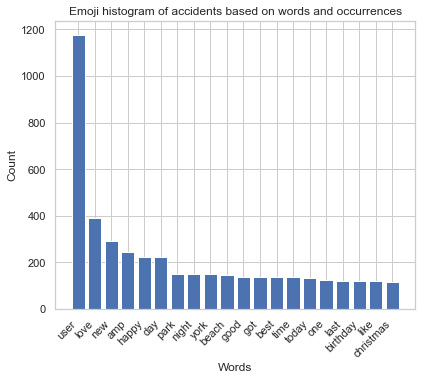

In [38]:
#Here we simply plot the distribution
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(emoji_top_20_val.keys(),emoji_top_20_val.values())
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [39]:
# Here we multiply the frequency with the rank

In [40]:
li =  []
counter = 1
for elm in emoji_top_20_val.values():
    li.append(elm * counter)
    counter += 1

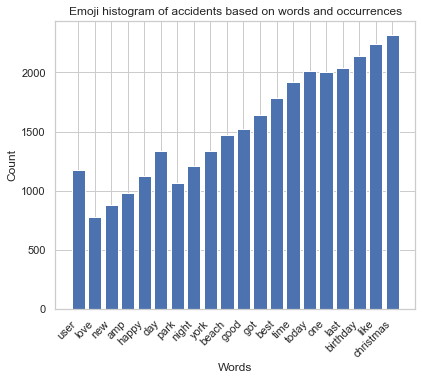

In [41]:
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(emoji_top_20_val.keys(),li)
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [42]:
# Raw dataset
emoji_raw_val = word_frequency(emoji_words_val_txt)
emoji_raw_train = word_frequency(emoji_words_train_txt)
emoji_raw_test = word_frequency(emoji_words_test_txt)

In [43]:
thing = most_common_words(emoji_raw_val)

In [44]:
li =  []
counter = 1
for elm in thing.values():
    li.append(elm * counter)
    counter += 1
    if counter == 51:
        break

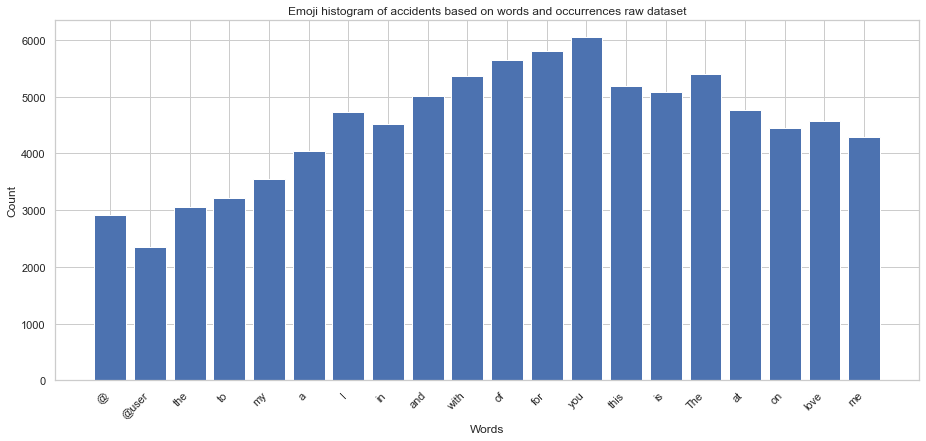

In [45]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:20],li[:20])
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

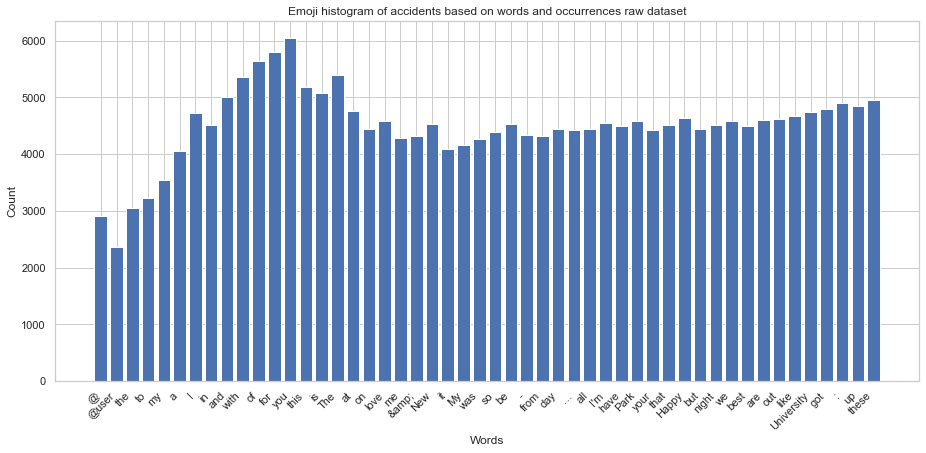

In [46]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:50],li)
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

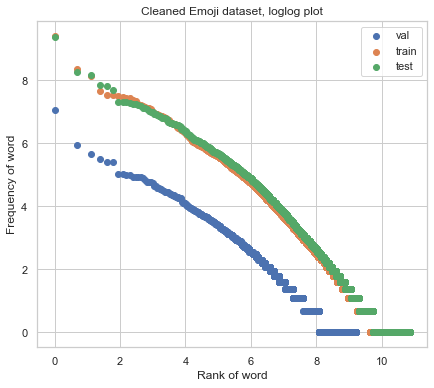

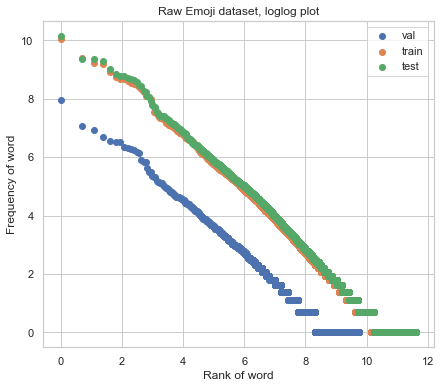

In [47]:
# Cleaned dataset:
llplot([emoji_freq_words_val, emoji_freq_words_train, emoji_freq_words_test], labels=["val", "train", "test"], title="Cleaned Emoji dataset, loglog plot")



llplot([emoji_raw_val, emoji_raw_train, emoji_raw_test], labels=["val", "train", "test"], title="Raw Emoji dataset, loglog plot")

## Type/token ratio

In [48]:
_, tokens, _, _,unique_tokens, _ ,_ = basic_statistics(emoji_text_train,printer = True)

The number of characters: 3285761
The number of tokens is: 671468
The number of sentences is: 23566
The average number of tokens per sentence is: 20
The number of unique tokens are: 45902
The tokens ratio is: 0.068
The number of total tokens after removing stopwords are: 314706


## Offensive dataset

## Size of our offensive vocabulary

In [49]:
print("Number of total words in the vocabulary " + str(len(offensive_freq_words_train)))

Number of total words in the vocabulary 17033


### Top 20 most common tokens 

In [50]:
offensive_top_20_val = top_20_most_common_words(offensive_freq_words_val)
offensive_top_20_train = top_20_most_common_words(offensive_freq_words_train)
offensive_top_20_test = top_20_most_common_words(offensive_freq_words_test)

print('Top 20 in val_text.txt:\n',offensive_top_20_val, '\n')
print('Top 20 in val_train.txt:\n',offensive_top_20_train,'\n')
print('Top 20 in val_test.txt:\n',offensive_top_20_test,'\n')

Top 20 in val_text.txt:
 {'user': 3455, 'liberals': 139, 'gun': 133, 'control': 125, 'antifa': 119, 'like': 110, 'conservatives': 107, 'maga': 98, 'people': 89, 'know': 77, 'get': 74, 'one': 72, 'trump': 70, 'think': 68, 'amp': 62, 'would': 61, 'want': 55, 'us': 52, 'going': 47, 'right': 46} 

Top 20 in val_train.txt:
 {'user': 29961, 'liberals': 1265, 'gun': 1230, 'control': 1097, 'antifa': 1051, 'like': 997, 'maga': 912, 'conservatives': 842, 'people': 832, 'amp': 615, 'get': 588, 'trump': 568, 'one': 568, 'know': 560, 'would': 507, 'think': 485, 'good': 418, 'right': 413, 'time': 350, 'us': 346} 

Top 20 in val_test.txt:
 {'user': 608, 'liberals': 81, 'conservatives': 80, 'antifa': 74, 'like': 65, 'gun': 64, 'control': 64, 'maga': 57, 'get': 51, 'one': 48, 'people': 47, 'trump': 44, 'us': 42, 'love': 38, 'want': 37, 'via': 33, 'know': 31, 'good': 31, 'see': 30, 'going': 30} 



## Top 20 least common tokens

In [51]:
offensive_least_words_val = least_common_words(offensive_freq_words_val)
offensive_least_words_train = least_common_words(offensive_freq_words_train)
offensive_least_words_test = least_common_words(offensive_freq_words_test)
print('Top 20 least common words in offensive_freq_words_val \n',offensive_least_words_val[0:20], '\n')
print('Top 20 least common words in offensive_freq_words_train \n',offensive_least_words_train[0:20], '\n')
print('Top 20 least common words in offensive_freq_words_test \n',offensive_least_words_test[0:20], '\n')

Top 20 least common words in offensive_freq_words_val 
 [('wiiu', 1), ('console', 1), ('az', 1), ('underage', 1), ('lionsden', 1), ('affect', 1), ('hazard', 1), ('club', 1), ('finger', 1), ('aid', 1), ('constituent', 1), ('disclosure', 1), ('etiquette', 1), ('moderation', 1), ('city', 1), ('ft', 1), ('richer', 1), ('sendhim', 1), ('allegation', 1), ('teen', 1)] 

Top 20 least common words in offensive_freq_words_train 
 [('countrymen', 1), ('breitbarters', 1), ('progressing', 1), ('reads', 1), ('unto', 1), ('optic', 1), ('vetsresistsquadron', 1), ('scout', 1), ('lifetimes', 1), ('obummer', 1), ('plethora', 1), ('peruse', 1), ('lighting', 1), ('torches', 1), ('checkmarks', 1), ('verifiedhate', 1), ('lmfaoooooo', 1), ('shitbiscuit', 1), ('tempe', 1), ('licensereporters', 1)] 

Top 20 least common words in offensive_freq_words_test 
 [('ibelieveblaseyford', 1), ('libreal', 1), ('snowflake', 1), ('iran', 1), ('johnkerryiranmeeting', 1), ('angels', 1), ('runs', 1), ('homers', 1), ('connects

## Zipf's Law

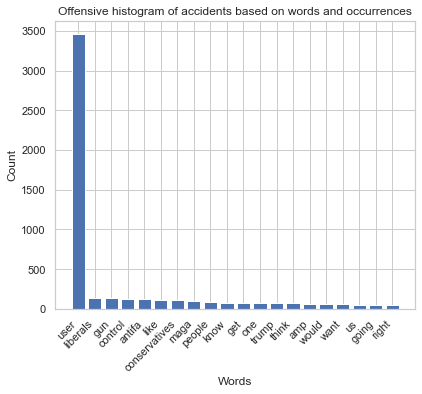

In [52]:
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(offensive_top_20_val.keys(),offensive_top_20_val.values())
fig.autofmt_xdate(rotation=45)
axes.set_title('Offensive histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [53]:
li =  []
counter = 1
for elm in offensive_top_20_val.values():
    li.append(elm * counter)
    counter += 1

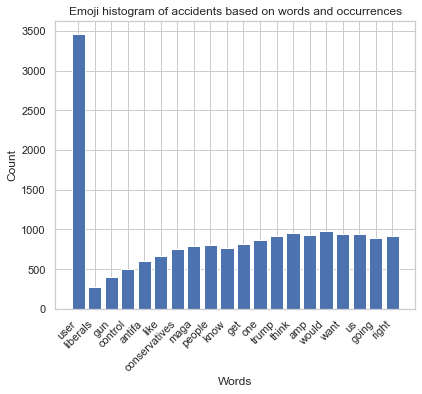

In [54]:
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(offensive_top_20_val.keys(),li)
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [55]:
# Raw dataset
offensive_raw_val = word_frequency(offensive_words_val_txt)
offensive_raw_train = word_frequency(offensive_words_train_txt)
offensive_raw_test = word_frequency(offensive_words_test_txt)


In [56]:
thing = most_common_words(offensive_raw_val)

In [57]:
li =  []
counter = 1
for elm in thing.values():
    li.append(elm * counter)
    counter += 1
    if counter == 51:
        break

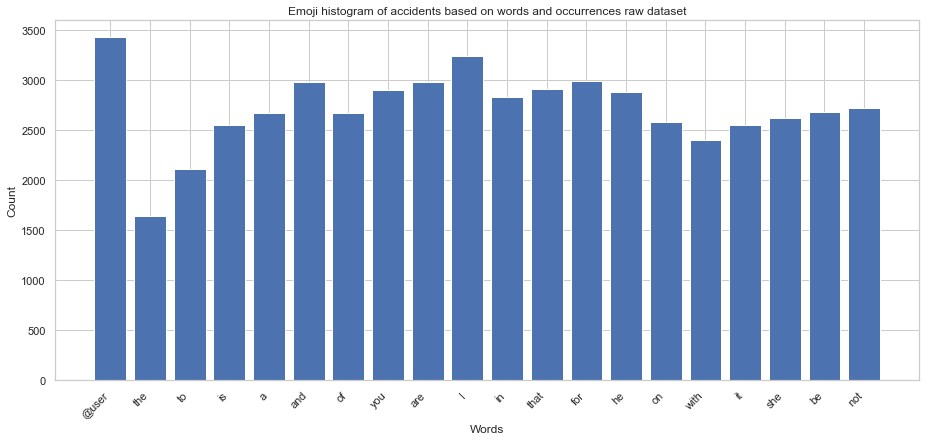

In [58]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:20],li[:20])
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

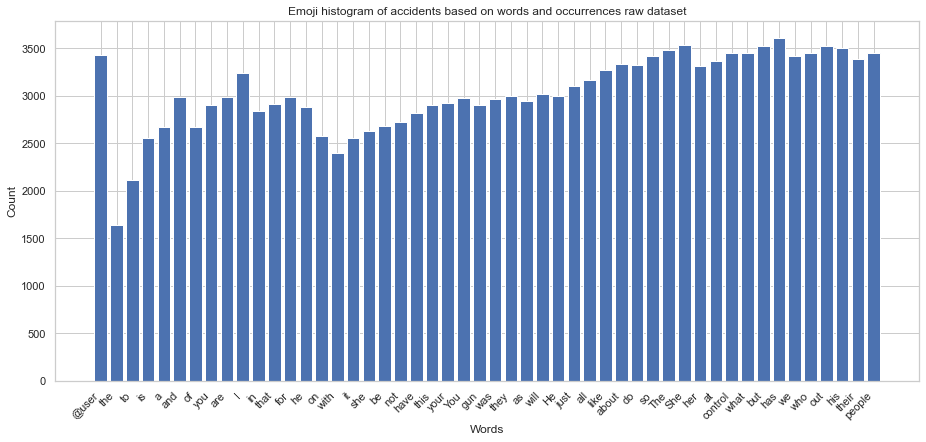

In [59]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:50],li[:50])
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

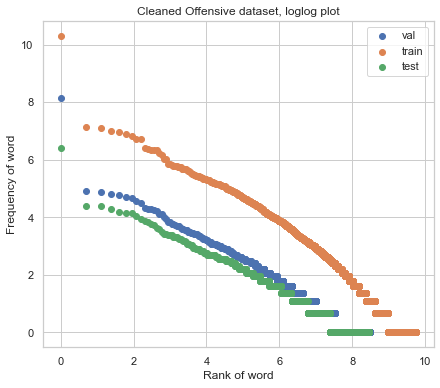

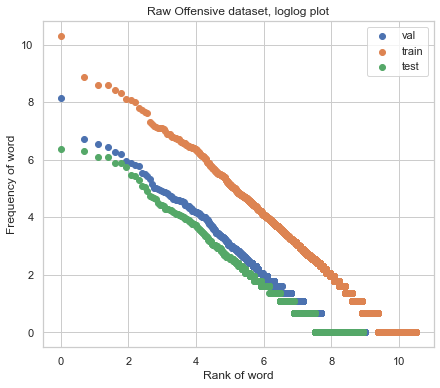

In [60]:
# Cleaned dataset:
llplot([offensive_freq_words_val, offensive_freq_words_train, offensive_freq_words_test], labels=["val", "train", "test"], title="Cleaned Offensive dataset, loglog plot")

llplot([offensive_raw_val, offensive_raw_train, offensive_raw_test], labels=["val", "train", "test"], title="Raw Offensive dataset, loglog plot")

There is an overall trend that the follows the law, however, this is has not been proven mathematicly, and our plots doesn't follow the excact distributions as described.

## Type/token ratio

In [61]:
_, tokens, _, _,unique_tokens, _ ,_ = basic_statistics(offensive_text_train,printer = True)

The number of characters: 1510503
The number of tokens is: 336814
The number of sentences is: 18122
The average number of tokens per sentence is: 14
The number of unique tokens are: 17182
The tokens ratio is: 0.051
The number of total tokens after removing stopwords are: 147828


***

## Data frames for offensive train text and offensive test text

In [62]:


train = pd.read_csv('datasets/offensive/train_text.txt', header=None, skiprows = 0, names=['tweet'], sep='\t', quoting=3)
print("Training Set:"% train.columns, train.shape, len(train))


test = pd.read_csv('datasets/offensive/test_text.txt',header=None, skiprows = 0, names=['tweet'], sep='\t', quoting=3)
print("Test Set:"% test.columns, test.shape, len(test))

Training Set: (11916, 1) 11916
Test Set: (860, 1) 860


In [63]:

index_train = [x for x in range(1, len(train.values)+1)]
index_test = [x for x in range(1, len(test.values)+1)]

train.insert(loc=0, column='id', value =index_train )
test.insert(loc=0, column='id', value =index_test )

train_labels = pd.read_csv('datasets/offensive/train_labels.txt',header=None, skiprows = 0, names=['label'], sep='\t', quoting=3)
train_labels.insert(loc=0, column='id', value=index_train)

test_labels = pd.read_csv('datasets/offensive/test_labels.txt',header=None, skiprows = 0, names=['label'], sep='\t', quoting=3)
test_labels.insert(loc=0, column='id', value =index_test )


test_df = test.merge(test_labels, on='id', how='left')
train_df = train.merge(train_labels, on='id', how='left')




In [64]:
train_df.head()

,id,tweet,label
0,1,@user Bono... who cares. Soon people will unde...,0
1,2,@user Eight years the republicans denied obama...,1
2,3,@user Get him some line help. He is gonna be j...,0
3,4,@user @user She is great. Hi Fiona!,0
4,5,@user She has become a parody unto herself? Sh...,1


In [65]:
test_df.head()

,id,tweet,label
0,1,#ibelieveblaseyford is liar she is fat ugly li...,1
1,2,@user @user @user I got in a pretty deep debat...,0
2,3,"...if you want more shootings and more death, ...",0
3,4,Angels now have 6 runs. Five of them have come...,0
4,5,#Travel #Movies and Unix #Fortune combined Vi...,0


In [66]:
test_clean = clean_text(test_df, 'tweet')
train_clean = clean_text(train_df, 'tweet')

In [67]:
stop = stopwords.words('english')

train_clean['tweet'] = train_clean['tweet'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
train_clean.head()

,id,tweet,label
0,1,bono cares soon people understand gain nothing...,0
1,2,eight years republicans denied obama picks bre...,1
2,3,get line help gonna fine game went could see p...,0
3,4,great hi fiona,0
4,5,become parody unto certainly taken heat well i...,1


In [68]:
stop = stopwords.words('english')
test_clean['tweet'] = test_clean['tweet'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

test_clean.head()

,id,tweet,label
0,1,ibelieveblaseyford liar fat ugly libreal snowf...,1
1,2,got pretty deep debate friend told latinos tru...,0
2,3,want shootings death listen aclu black lives m...,0
3,4,angels 6 runs five come courtesy mike trout ho...,0
4,5,travel movies unix fortune combined visit sali...,0


In [69]:
test_clean['tweet'] = test_clean['tweet'].apply(lambda x: word_tokenize(x))
test_clean.head()

,id,tweet,label
0,1,"[ibelieveblaseyford, liar, fat, ugly, libreal,...",1
1,2,"[got, pretty, deep, debate, friend, told, lati...",0
2,3,"[want, shootings, death, listen, aclu, black, ...",0
3,4,"[angels, 6, runs, five, come, courtesy, mike, ...",0
4,5,"[travel, movies, unix, fortune, combined, visi...",0


In [70]:

test_clean_offensive = test_clean.loc[test_clean['label'] == 1]
test_clean_offensive.head()
#test_clean_offensive['tweet'].to_csv('test_cleaned_off_lang_df.csv',  quoting=csv.QUOTE_NONE, escapechar=' ') 

,id,tweet,label
0,1,"[ibelieveblaseyford, liar, fat, ugly, libreal,...",1
8,9,"[grown, ass, woman, probably, 10, years, older...",1
10,11,"[kavanaugh, disciple, anthony, kennedy, ed, li...",1
15,16,"[apparently, committed, going, new, level, sin...",1
18,19,"[50, cent, calls, joe, budden, bullshit, insta...",1


In [71]:
test_clean_nonoffensive = test_clean.loc[test_clean['label'] == 0]

#test_clean_nonoffensive['tweet'].to_csv('test_cleaned_non_off_lang_df.csv',  quoting=csv.QUOTE_NONE, escapechar=' ') 

test_clean_nonoffensive.head()

,id,tweet,label
1,2,"[got, pretty, deep, debate, friend, told, lati...",0
2,3,"[want, shootings, death, listen, aclu, black, ...",0
3,4,"[angels, 6, runs, five, come, courtesy, mike, ...",0
4,5,"[travel, movies, unix, fortune, combined, visi...",0
5,6,"[naturephotography, nature, birds, wild, wisco...",0


In [72]:
test_off_lists = test_clean_offensive['tweet'].values.tolist()
test_off_lists[0]

['ibelieveblaseyford',
 'liar',
 'fat',
 'ugly',
 'libreal',
 'snowflake',
 'sold',
 'get',
 'cash',
 'dems',
 'iran',
 'spoke',
 'johnkerryiranmeeting']

In [73]:
test_non_off_lists = test_clean_nonoffensive['tweet'].values.tolist()
test_non_off_lists[0]

['got',
 'pretty',
 'deep',
 'debate',
 'friend',
 'told',
 'latinos',
 'trump',
 'blacks',
 'trump',
 'paid',
 'supporters',
 'said',
 'mean',
 'antifa',
 'paid',
 'domestic',
 'terrorist',
 'said',
 'anti',
 'fascist',
 'said',
 'fascist',
 'kidding']

# Task 04 - Automatic Prediction

In [74]:
# Merging validation text and labels
val_df = merging_labels_and_sentences('datasets/offensive/val_text', 'datasets/offensive/val_labels')

# Checking for missing values
missing_val = missing_values(val_df)
# Average words devided into labels
avg_labels_word = word_count(val_df)
avg_labels_char = char_count(val_df)

print(' Average Number of Words - Offensive Tweets: ', avg_labels_word[1],'\n','Average Number of Words - Non-offensive Tweets: ', avg_labels_word[2])
print(' Average Characters in Offensive Tweets: ', avg_labels_char[1],'\n','Average Characters in Non-offensive Tweets: ', avg_labels_char[2])

print('\nNumber of missing values for each column\n',missing_val)



 Average Number of Words - Offensive Tweets:  25.569 
 Average Number of Words - Non-offensive Tweets:  22.151
 Average Characters in Offensive Tweets:  143.852 
 Average Characters in Non-offensive Tweets:  126.98

Number of missing values for each column
 id       0
tweet    0
label    0
dtype: int64


C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


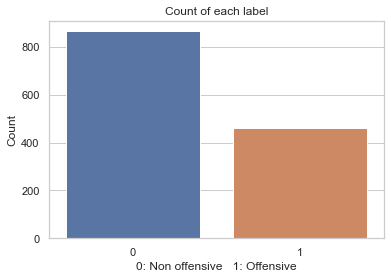

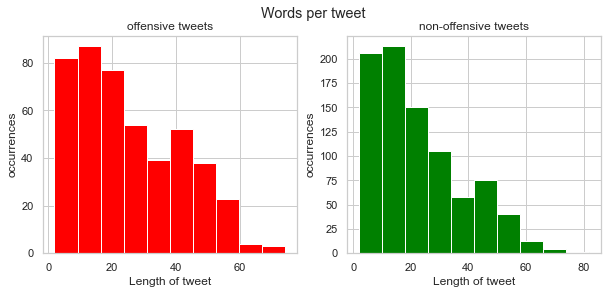

In [75]:
# Number of total labels for each class: 0 = non offensive, 1 = offensive
barplot = class_distribution(val_df,"Count of each label","0: Non offensive   1: Offensive")
# Histogram of Word count pr tweet
plot_word_count = plot_word_count(val_df)

## Term Frequency-Inverse Document Frequencies

Term Frequency-Inverse Document Frequencies (tf-Idf): Count vectors might not be the best representation for converting text data to numerical data. So, instead of simple counting, we can also use an advanced variant of the Bag-of-Words that uses the term frequency–inverse document frequency (or Tf-Idf). Basically, the value of a word increases proportionally to count in the document, but it is inversely proportional to the frequency of the word in the corpus

# We are splitting the data into training and test
X_train, X_test, y_train, y_test = split_dataset_2(val_df,labels)

# Here we tokenize the data
X_train_tok, X_test_tok = tokenize_train_test_2(X_train[:,0].tolist(), X_test[:,0].tolist())

# (tf-Idf)
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
X_train_vectors_tfidf = tfidf_vectorizer.fit_transform(X_train.tolist()) 
X_test_vectors_tfidf = tfidf_vectorizer.transform(X_test.tolist())


val_df['clean_text_tok']=[nltk.word_tokenize(i) for i in val_df['tweet']]
model = gensim.models.Word2Vec(val_df['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

# converting text to numerical data using Word2Vec
X_train_vectors_w2v = modelw.transform(X_train_tok)
X_test_vectors_w2v = modelw.transform(X_test_tok)

In [76]:
# We are splitting the data into training and test
X_train, X_test, y_train, y_test = split_dataset(val_df)

# Here we tokenize the data
X_train_tok, X_test_tok = tokenize_train_test(X_train, X_test)

# (tf-Idf)
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
X_train_vectors_tfidf = tfidf_vectorizer.fit_transform(X_train) 
X_test_vectors_tfidf = tfidf_vectorizer.transform(X_test)


val_df['clean_text_tok']=[nltk.word_tokenize(i) for i in val_df['tweet']]
model = gensim.models.Word2Vec(val_df['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

# converting text to numerical data using Word2Vec
X_train_vectors_w2v = modelw.transform(X_train_tok)
X_test_vectors_w2v = modelw.transform(X_test_tok)

In [296]:
corpus = X_train[0:4]
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(corpus)

In [304]:
X.shape # This is baseline

(4, 20)

In [309]:
l = [x for x in range(20)]

In [311]:
new = np.append(X,l)

In [322]:
new

array([<4x20 sparse matrix of type '<class 'numpy.int64'>'
       	with 22 stored elements in Compressed Sparse Row format>, 0, 1, 2,
       3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
      dtype=object)

In [321]:
print(np.array(new))

1


In [303]:
tfidf_vectorizer = TfidfVectorizer(use_idf=True)

In [292]:
X_train_vectors_w2v.shape

(1059, 100)

In [295]:
w2v

{'@': array([-0.94041526,  0.65468544,  0.67473876,  0.76589346,  0.09177283,
        -1.4968597 ,  1.1794199 ,  2.412633  , -1.0324645 , -1.3523188 ,
         0.28187644, -1.6258    , -0.9631005 ,  0.87643325,  0.19660443,
        -0.2943199 ,  0.6686161 , -0.26670066, -0.61349356, -1.9870389 ,
         0.6193692 ,  0.5140465 ,  1.2136613 , -0.53843987,  0.10460641,
         0.2802246 , -0.8276132 ,  0.47451913, -1.0975006 ,  0.35035166,
         1.0570396 , -0.44428265,  0.7652077 , -1.7145507 , -0.50936043,
         0.94288796,  0.30592862, -0.30605623,  0.13410562, -0.99714595,
         0.4125404 , -0.91471595, -1.2646459 , -0.19556846,  0.9195529 ,
         0.3529509 , -1.1865458 , -0.05114181,  0.8936297 ,  0.7986936 ,
        -0.04509547, -1.1365107 , -0.0708861 ,  0.13819982, -0.22768283,
         0.45284748,  1.0660915 , -0.0096826 , -0.7579342 ,  0.549457  ,
         0.19269103,  0.12875596,  0.30376154, -0.6971444 , -0.49482316,
         1.1409042 ,  0.48145106,  0.95916325,

In [290]:
X_train_vectors_w2v[0]

array([-0.04866999,  0.10138365,  0.01216076, -0.08721095,  0.11021332,
       -0.24939409,  0.1545223 ,  0.40835074, -0.12659772, -0.17514563,
       -0.08335479, -0.2711565 , -0.02056155, -0.02089083,  0.14683434,
       -0.12975188,  0.00575707, -0.23402263,  0.03499068, -0.3956987 ,
        0.01561671,  0.07623544,  0.01519875, -0.02408827, -0.2014009 ,
        0.04009229, -0.10329784, -0.05894685, -0.13743065,  0.02838293,
        0.20182641, -0.01804405,  0.02275786, -0.20559803, -0.1642065 ,
        0.22520301, -0.15796809, -0.1245757 , -0.18574192, -0.31813526,
        0.10049869, -0.13407697, -0.02507007,  0.0111065 ,  0.28025812,
       -0.08709729, -0.26186508, -0.11496311,  0.14155819,  0.07521087,
        0.00041233, -0.17421655,  0.02228964, -0.06768428, -0.16376908,
        0.03558908,  0.04200524,  0.00266996, -0.06697241, -0.1722654 ,
        0.22371924,  0.0042511 ,  0.17230928,  0.04995212, -0.2262081 ,
        0.23471817, -0.00953278,  0.20029321, -0.36394626,  0.10

## Logistic regression (tf-idf)

In [77]:
#FITTING THE CLASSIFICATION MODEL using Logistic Regression(tf-idf)

lr_tfidf=LogisticRegression(solver = 'liblinear', C=10, penalty = 'l2')

lr_tfidf.fit(X_train_vectors_tfidf, y_train)  

#Predict y value for test dataset
y_predict = lr_tfidf.predict(X_test_vectors_tfidf)
y_prob = lr_tfidf.predict_proba(X_test_vectors_tfidf)[:,1]
print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))
 
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

              precision    recall  f1-score   support

           0       0.72      0.87      0.79       172
           1       0.61      0.38      0.47        93

    accuracy                           0.70       265
   macro avg       0.67      0.62      0.63       265
weighted avg       0.68      0.70      0.68       265

Confusion Matrix: [[150  22]
 [ 58  35]]
AUC: 0.7046136534133534


In [78]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html

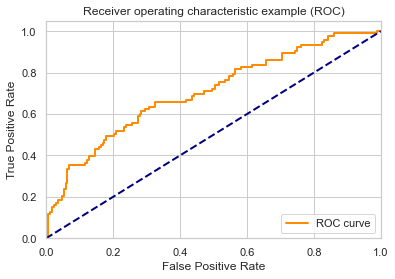

In [79]:
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example (ROC)')
plt.legend(loc="lower right")
plt.show()

In [80]:
#FITTING THE CLASSIFICATION MODEL using Logistic Regression (W2v)

lr_w2v=LogisticRegression(solver = 'liblinear', C=10, penalty = 'l2')
lr_w2v.fit(X_train_vectors_w2v, y_train)  #model

#Predict y value for test dataset
y_predict = lr_w2v.predict(X_test_vectors_w2v)
y_prob = lr_w2v.predict_proba(X_test_vectors_w2v)[:,1]

print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))
 
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

              precision    recall  f1-score   support

           0       0.65      1.00      0.79       172
           1       1.00      0.01      0.02        93

    accuracy                           0.65       265
   macro avg       0.83      0.51      0.41       265
weighted avg       0.77      0.65      0.52       265

Confusion Matrix: [[172   0]
 [ 92   1]]
AUC: 0.5585771442860715


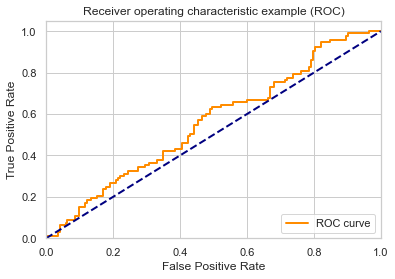

In [81]:
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example (ROC)')
plt.legend(loc="lower right")
plt.show()

# Naive

# Test

In [82]:

def split_dataset(dataframe):
    X_train, X_test, y_train, y_test = train_test_split(dataframe["tweet"],dataframe      
    ["label"],test_size=0.2,shuffle=True)
    return X_train, X_test, y_train, y_test

def split_dataset_2(dataframe,labels):
    counter = 0
    li = []
    for rows in dataframe.iterrows():
        row = []
        for elm in labels:
            row.append(rows[1][elm])
        li.append(row)
    
    X_train, X_test, y_train, y_test = train_test_split(li,dataframe["label"],test_size=0.2,shuffle=True)
    return X_train,X_test, y_train, y_test
labels = ["tweet","word_count","char_count"]

In [83]:
test = val_df.copy()

In [84]:
test = test.drop(["id"],axis = 1)

In [85]:
test

,tweet,label,word_count,char_count,clean_text_tok
0,@user @user WiiU is not even a real console.,0,9,45,"[@, user, @, user, WiiU, is, not, even, a, rea..."
1,@user @user @user If he is from AZ I would put...,1,18,83,"[@, user, @, user, @, user, If, he, is, from, ..."
2,@user I thought Canada had strict gun control....,0,14,86,"[@, user, I, thought, Canada, had, strict, gun..."
3,@user @user @user @user @user @user @user @use...,0,28,173,"[@, user, @, user, @, user, @, user, @, user, ..."
4,1 Minute of Truth: Gun Control via @user,0,8,41,"[1, Minute, of, Truth, :, Gun, Control, via, @..."
...,...,...,...,...,...
1319,@user @user Whose twitter interest start with ...,0,24,143,"[@, user, @, user, Whose, twitter, interest, s..."
1320,"@user @user How did the press"""" get the letter...",0,9,59,"[@, user, @, user, How, did, the, press, '', '..."
1321,@user @user @user @user @user @user Sorry abou...,0,52,277,"[@, user, @, user, @, user, @, user, @, user, ..."
1322,@user Fuck Alan I’m sorry,1,5,26,"[@, user, Fuck, Alan, I, ’, m, sorry]"


In [86]:
li = []
counter = 0
for elm in test["tweet"]:
    li.append(len(re.findall("@user", elm)))

In [87]:
test["Tags"] = li

In [88]:
df_off = test.where(test["label"] == 1).dropna()
df_not_off = test.where(test["label"] == 0).dropna()

In [89]:
df_not_off

,tweet,label,word_count,char_count,clean_text_tok,Tags
0,@user @user WiiU is not even a real console.,0.0,9.0,45.0,"[@, user, @, user, WiiU, is, not, even, a, rea...",2.0
2,@user I thought Canada had strict gun control....,0.0,14.0,86.0,"[@, user, I, thought, Canada, had, strict, gun...",1.0
3,@user @user @user @user @user @user @user @use...,0.0,28.0,173.0,"[@, user, @, user, @, user, @, user, @, user, ...",16.0
4,1 Minute of Truth: Gun Control via @user,0.0,8.0,41.0,"[1, Minute, of, Truth, :, Gun, Control, via, @...",1.0
5,@user @user @user We could help if you are Lon...,0.0,12.0,58.0,"[@, user, @, user, @, user, We, could, help, i...",3.0
...,...,...,...,...,...,...
1317,@user lmao i really didn’t know him before tha...,0.0,12.0,57.0,"[@, user, lmao, i, really, didn, ’, t, know, h...",1.0
1319,@user @user Whose twitter interest start with ...,0.0,24.0,143.0,"[@, user, @, user, Whose, twitter, interest, s...",2.0
1320,"@user @user How did the press"""" get the letter...",0.0,9.0,59.0,"[@, user, @, user, How, did, the, press, '', '...",2.0
1321,@user @user @user @user @user @user Sorry abou...,0.0,52.0,277.0,"[@, user, @, user, @, user, @, user, @, user, ...",6.0


In [90]:
Counter(df_off["Tags"])
Counter(df_not_off["Tags"])

Counter({2.0: 193,
         1.0: 393,
         16.0: 4,
         3.0: 79,
         4.0: 38,
         0.0: 87,
         10.0: 1,
         50.0: 11,
         42.0: 1,
         6.0: 12,
         12.0: 3,
         11.0: 6,
         7.0: 5,
         5.0: 17,
         28.0: 1,
         13.0: 1,
         15.0: 1,
         9.0: 3,
         14.0: 3,
         49.0: 3,
         8.0: 1,
         43.0: 2})

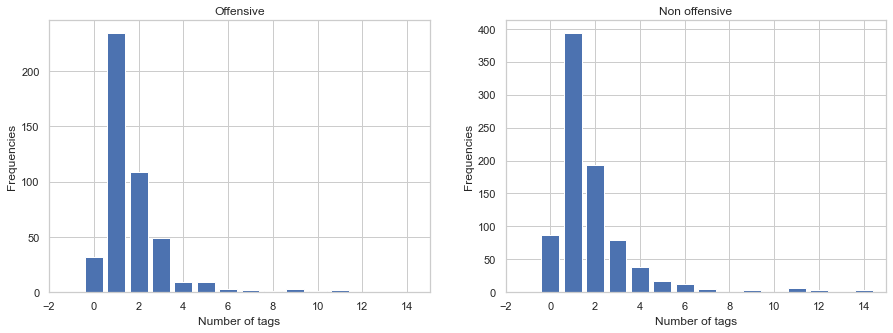

In [91]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
value = Counter(df_off["Tags"]).values()
keys = Counter(df_off["Tags"]).keys()
ax1.bar(keys,value)
ax1.set_ylabel("Frequencies")
ax1.set_xlabel("Number of tags")
ax1.set_title("Offensive")
ax1.set_xlim(-2,15)
value_2 = Counter(df_not_off["Tags"]).values()
keys_2 = Counter(df_not_off["Tags"]).keys()
ax2.bar(keys_2,value_2)
ax2.set_ylabel("Frequencies")
ax2.set_xlabel("Number of tags")
ax2.set_title("Non offensive")
ax2.set_xlim(-2,15)
plt.show()

In [92]:
test

,tweet,label,word_count,char_count,clean_text_tok,Tags
0,@user @user WiiU is not even a real console.,0,9,45,"[@, user, @, user, WiiU, is, not, even, a, rea...",2
1,@user @user @user If he is from AZ I would put...,1,18,83,"[@, user, @, user, @, user, If, he, is, from, ...",3
2,@user I thought Canada had strict gun control....,0,14,86,"[@, user, I, thought, Canada, had, strict, gun...",1
3,@user @user @user @user @user @user @user @use...,0,28,173,"[@, user, @, user, @, user, @, user, @, user, ...",16
4,1 Minute of Truth: Gun Control via @user,0,8,41,"[1, Minute, of, Truth, :, Gun, Control, via, @...",1
...,...,...,...,...,...,...
1319,@user @user Whose twitter interest start with ...,0,24,143,"[@, user, @, user, Whose, twitter, interest, s...",2
1320,"@user @user How did the press"""" get the letter...",0,9,59,"[@, user, @, user, How, did, the, press, '', '...",2
1321,@user @user @user @user @user @user Sorry abou...,0,52,277,"[@, user, @, user, @, user, @, user, @, user, ...",6
1322,@user Fuck Alan I’m sorry,1,5,26,"[@, user, Fuck, Alan, I, ’, m, sorry]",1


In [93]:
li = []
for elm in test["tweet"]:
    #li.append(re.sub('\W+',' ', elm ).strip()) # Removes all special characters
    clean = re.sub('\W+',' ', elm ).strip()
    clean = clean.lower()
    temp = []
    for i in clean:
        if i == " ":
            temp.append(0)
            #temp.append(" ")
        else:
            #k = str(i)
            temp.append((ord(i) - 97))
    li.append(temp)
test["Numeric"] = li

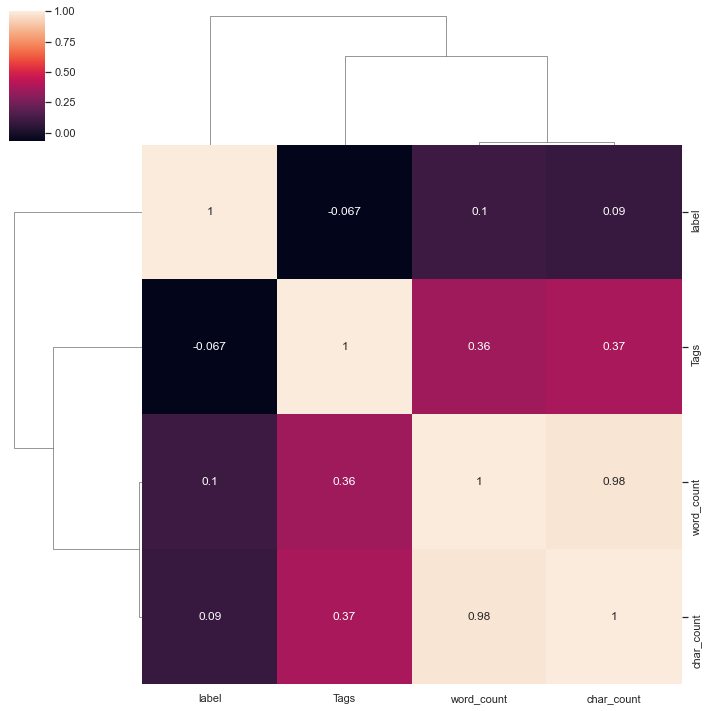

In [94]:
import seaborn as sns

# calculate the correlations
correlations = test.corr()

# plot the heatmap bb
#sns.heatmap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True)

# plot the clustermap 
sns.clustermap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True);

In [95]:
test = test.drop(["tweet","clean_text_tok","char_count","Tags"],axis = 1)

In [96]:
test

,label,word_count,Numeric
0,0,9,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 22, 8, 8,..."
1,1,18,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 20, 18, 4..."
2,0,14,"[20, 18, 4, 17, 0, 8, 0, 19, 7, 14, 20, 6, 7, ..."
3,0,28,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 20, 18, 4..."
4,0,8,"[-48, 0, 12, 8, 13, 20, 19, 4, 0, 14, 5, 0, 19..."
...,...,...,...
1319,0,24,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 22, 7, 14..."
1320,0,9,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 7, 14, 22..."
1321,0,52,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 20, 18, 4..."
1322,1,5,"[20, 18, 4, 17, 0, 5, 20, 2, 10, 0, 0, 11, 0, ..."


In [ ]:
input = [[9,[20,18]],[6,[9,3,4]]]

In [273]:
X = np.array(list(zip(test["word_count"],test["Numeric"])))

C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [257]:
li = []
for elm in zip(test["word_count"],test["Numeric"]):
    li.append([np.array(elm[0]),np.array(elm[1])])
    break
li[0][0]

array(9)

In [262]:
li = np.array(li[0])

C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [268]:
li.shape

(2,)

In [164]:
y = np.array(test["label"])
from keras.utils import to_categorical
train_labels = to_categorical(y)

In [128]:
import tensorflow as tf

In [138]:
import keras
#from keras.models import Sequential
#from keras.layers import Dense

In [269]:
train_labels

array([[1., 0.],
       [0., 1.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]], dtype=float32)

In [280]:
# Multilayer Perceptron
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Flatten

In [281]:
# define the keras model
model = Sequential()
model.add(Flatten(input_shape=(2,2)))
model.add(Dense(12, input_dim=2, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(2, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# fit the keras model on the dataset
model.fit(X, train_labels, epochs=10, batch_size=10)

ValueError: Error when checking input: expected flatten_1_input to have 3 dimensions, but got array with shape (1324, 2)

In [ ]:
test = test.drop(["tweet","char_count","clean_text_tok"],axis = 1)

In [ ]:
test

In [ ]:
#test['clean_text_tok']=[nltk.word_tokenize(i) for i in test['tweet']]
model = gensim.models.Word2Vec(test['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

In [ ]:
X_train_vectors_w2v = modelw.transform(X_train_tok)

In [ ]:
len(X_train_vectors_w2v)

In [ ]:
test["w2v"] 

In [ ]:
# We are splitting the data into training and test
X_train, X_test, y_train, y_test = split_dataset(val_df)

# Here we tokenize the data
X_train_tok, X_test_tok = tokenize_train_test(X_train, X_test)

# (tf-Idf)
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
X_train_vectors_tfidf = tfidf_vectorizer.fit_transform(X_train) 
X_test_vectors_tfidf = tfidf_vectorizer.transform(X_test)


val_df['clean_text_tok']=[nltk.word_tokenize(i) for i in val_df['tweet']]
model = gensim.models.Word2Vec(val_df['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

# converting text to numerical data using Word2Vec
X_train_vectors_w2v = modelw.transform(X_train_tok)
X_test_vectors_w2v = modelw.transform(X_test_tok)

In [ ]:
test = test.drop(["label"],axis = 1)

In [ ]:
test

In [ ]:
#featurespace**2

In [ ]:
#evt antallet af users

In [ ]:
import seaborn as sns

# calculate the correlations
correlations = test.corr()

# plot the heatmap 
#sns.heatmap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True)

# plot the clustermap 
sns.clustermap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True);

In [323]:
#FITTING THE CLASSIFICATION MODEL using Naive Bayes(tf-idf)
nb_tfidf = MultinomialNB()
nb_tfidf.fit(X_train_vectors_tfidf, y_train) 

 #Predict y value for test dataset
y_predict = nb_tfidf.predict(X_test_vectors_tfidf)
y_prob = nb_tfidf.predict_proba(X_test_vectors_tfidf)[:,1]

print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))
 
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

              precision    recall  f1-score   support

           0       0.66      1.00      0.79       172
           1       1.00      0.03      0.06        93

    accuracy                           0.66       265
   macro avg       0.83      0.52      0.43       265
weighted avg       0.78      0.66      0.54       265

Confusion Matrix: [[172   0]
 [ 90   3]]
AUC: 0.6255313828457115


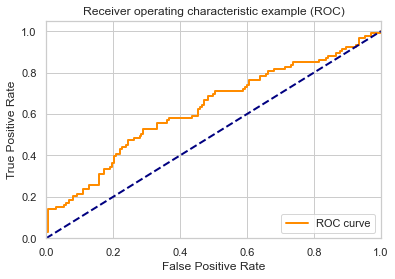

In [324]:
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Sa
#model_prediction_preprocessed_data(val_df).to_csv('model_predict_proc_validation.csv')

In [ ]:
#model_prediction_nonprocessed_data(val_df).to_csv('model_predict_nonproc_validation.csv')

In [ ]:
import numpy as np
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer

df = pd.read_csv('data/wine_data.csv')

counter = Counter(df['variety'].tolist())
top_10_varieties = {i[0]: idx for idx, i in enumerate(counter.most_common(10))}
df = df[df['variety'].map(lambda x: x in top_10_varieties)]

description_list = df['description'].tolist()
varietal_list = [top_10_varieties[i] for i in df['variety'].tolist()]
varietal_list = np.array(varietal_list)

count_vect = CountVectorizer()
x_train_counts = count_vect.fit_transform(description_list)


tfidf_transformer = TfidfTransformer()
x_train_tfidf = tfidf_transformer.fit_transform(x_train_counts)

train_x, test_x, train_y, test_y = train_test_split(x_train_tfidf, varietal_list, test_size=0.3)

clf = MultinomialNB().fit(train_x, train_y)
y_score = clf.predict(test_x)

n_right = 0
for i in range(len(y_score)):
    if y_score[i] == test_y[i]:
        n_right += 1

print("Accuracy: %.2f%%" % ((n_right/float(len(test_y)) * 100)))